## A Detailed Regression Guide with House-pricing

### This kernel is going to solve House Pricing with Advanced Regression Analysis, a popular machine learning dataset for beginners. I am going to share how I work with a dataset step by step from data preparation and data analysis to statistical tests and implementing machine learning models. I will also describe the model results along with many other tips. Let's get started.


### Goals
This kernel hopes to accomplish many goals, to name a few...

Learn/review/explain complex data science topics through write-ups.
Do a comprehensive data analysis along with visualizations.
Create models that are well equipped to predict better sale price of the houses.

### Introduction
Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

As the name suggests, this kernel goes on a detailed analysis journey of most of the regression algorithms. In addition to that, this kernel uses many charts and images to make things easier for readers to understand.

### A Data Science Framework
Define the Problem:
    
Gather the Data:
    
Prepare Data for Consumption:
    
Perform Exploratory Analysis:
    
Model Data:
    
Validate and Implement Data Model:
    
Optimize and Strategize:

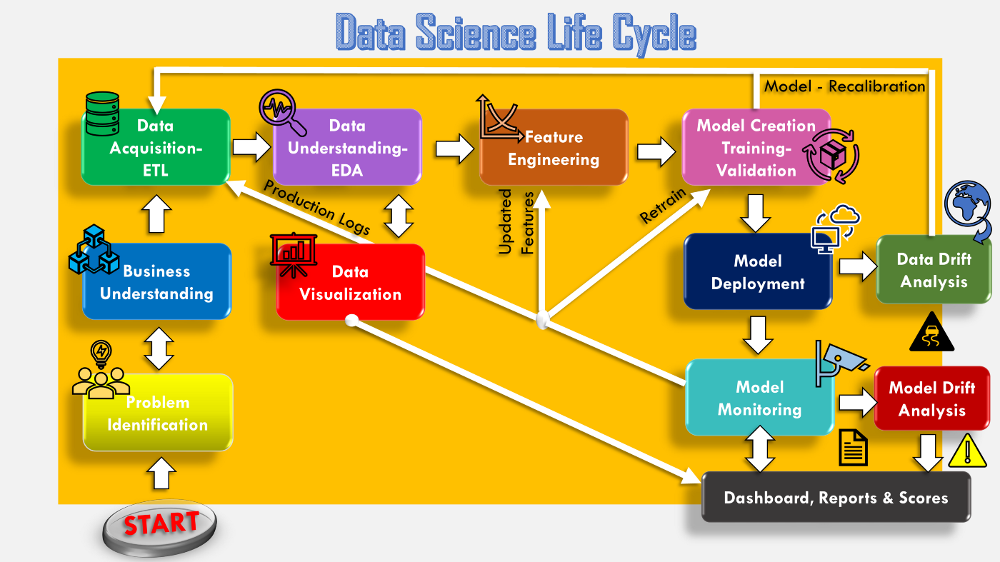

In [1]:
from IPython.display import Image
Image("/Users/tuktuk/Downloads/1*DjIccrMeRWmrC_mCUOGDhw.png")  # Image 1

### Understanding
In this problem we have to predict house prices on the basis of independent variables.
With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

### Step 1: Define the Problem
For this project, the problem statement is given to us on a golden plater, develop an algorithm to predict the house prices.

### Step 2 : Gather the Data
Data is downloaded from Kaggle. "https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data" 
It consists of train, test and submission datasets in csv formats

### Step 3: Prepare Data for Consumption
Since step 2 was provided to us , Therefore, normal processes in data wrangling, such as data architecture, governance, and extraction are out of scope. Thus, only data cleaning is in scope.

### 3.1 Import Libraries
#### 3.11 Load Data Modelling Libraries
We will use the popular scikit-learn library to develop our machine learning algorithms. In sklearn, algorithms are called Estimators and implemented in their own classes. For data visualization, we will use the matplotlib and seaborn library. Below are common classes to load.

In [2]:
# NumPy
import numpy as np # linear algebra

# Dataframe operations
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

#Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import matplotlib.style as style
style.use('fivethirtyeight')
%matplotlib inline

# Feature Scaling
from sklearn.feature_selection import VarianceThreshold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

# Scalers
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle



from datetime import datetime
from scipy.stats import skew  # for some statistics
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

import sklearn.linear_model as linear_model
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor


from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error


import scipy.stats as stats

import matplotlib.style as style
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import missingno as msno

import os
print(os.listdir("/Users/tuktuk/Downloads/house-prices-advanced-regression-techniques"))
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import warnings
warnings.filterwarnings('ignore')

['submission22Sep.csv', 'submissionpycarat.csv', 'submission22Sep1.csv', 'test.csv', 'data_description.txt', 'train.csv', 'sample_submission.csv', 'XGBsubmission.csv']


In [3]:
## Import Training data. 
train = pd.read_csv("/Users/tuktuk/Downloads/house-prices-advanced-regression-techniques/train.csv")
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test = pd.read_csv("/Users/tuktuk/Downloads/house-prices-advanced-regression-techniques/test.csv")
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [5]:
# making submission dataframe with test Id
submission = pd.DataFrame()
submission['Id'] = test['Id']
submission.head(5)

,Id
0,1461
1,1462
2,1463
3,1464
4,1465


In [6]:
train.drop('Id', axis=1, inplace = True)
test.drop('Id', axis=1, inplace = True)

In [7]:
data = (train, test) # to perform actions on both datasets

In [8]:
# To perform actions on both sets together ( for data imputation and encoding)
train_test=pd.concat([train,test],axis=0,sort=False)
train_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [9]:
print(train.shape, test.shape, train_test.shape)
print (f"Train has {train.shape[0]} rows and {train.shape[1]} columns")
print (f"Test has {test.shape[0]} rows and {test.shape[1]} columns")
print (f"Train_Test has {train_test.shape[0]} rows and {train_test.shape[1]} columns")

(1460, 80) (1459, 79) (2919, 80)
Train has 1460 rows and 80 columns
Test has 1459 rows and 79 columns
Train_Test has 2919 rows and 80 columns


### Data info
Data fields

Here's a brief version of what you'll find in the data description file.

SalePrice - the property's sale price in dollars. This is the target variable that we are trying to predict.

MSSubClass: The building class
    
MSZoning: The general zoning classification
    
LotFrontage: Linear feet of street connected to property
    
LotArea: Lot size in square feet
    
Street: Type of road access
    
Alley: Type of alley access
    
LotShape: General shape of property
    
LandContour: Flatness of the property
    
Utilities: Type of utilities available
    
LotConfig: Lot configuration
    
LandSlope: Slope of property
    
Neighborhood: Physical locations within Ames city limits
    
Condition1: Proximity to main road or railroad
    
Condition2: Proximity to main road or railroad (if a second is present)
    
BldgType: Type of dwelling
    
HouseStyle: Style of dwelling
    
OverallQual: Overall material and finish quality
    
OverallCond: Overall condition rating
    
YearBuilt: Original construction date
    
YearRemodAdd: Remodel date
    
RoofStyle: Type of roof
    
RoofMatl: Roof material
    
Exterior1st: Exterior covering on house
    
Exterior2nd: Exterior covering on house (if more than one material)
    
MasVnrType: Masonry veneer type
    
MasVnrArea: Masonry veneer area in square feet
    
ExterQual: Exterior material quality
    
ExterCond: Present condition of the material on the exterior
    
Foundation: Type of foundation
    
BsmtQual: Height of the basement
    
BsmtCond: General condition of the basement
    
BsmtExposure: Walkout or garden level basement walls

BsmtFinType1: Quality of basement finished area

BsmtFinSF1: Type 1 finished square feet
    
BsmtFinType2: Quality of second finished area (if present)
    
BsmtFinSF2: Type 2 finished square feet
    
BsmtUnfSF: Unfinished square feet of basement area
    
TotalBsmtSF: Total square feet of basement area
    
Heating: Type of heating
    
HeatingQC: Heating quality and condition
    
CentralAir: Central air conditioning
    
Electrical: Electrical system
    
1stFlrSF: First Floor square feet
    
2ndFlrSF: Second floor square feet
    
LowQualFinSF: Low quality finished square feet (all floors)
    
GrLivArea: Above grade (ground) living area square feet
    
BsmtFullBath: Basement full bathrooms
    
BsmtHalfBath: Basement half bathrooms
    
FullBath: Full bathrooms above grade
    
HalfBath: Half baths above grade
    
Bedroom: Number of bedrooms above basement level
    
Kitchen: Number of kitchens
    
KitchenQual: Kitchen quality
    
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
    
Functional: Home functionality rating
    
Fireplaces: Number of fireplaces
    
FireplaceQu: Fireplace quality
    
GarageType: Garage location
    
GarageYrBlt: Year garage was built
    
GarageFinish: Interior finish of the garage
    
GarageCars: Size of garage in car capacity
    
GarageArea: Size of garage in square feet
    
GarageQual: Garage quality
    
GarageCond: Garage condition
    
PavedDrive: Paved driveway
    
WoodDeckSF: Wood deck area in square feet
    
OpenPorchSF: Open porch area in square feet
    
EnclosedPorch: Enclosed porch area in square feet
    
3SsnPorch: Three season porch area in square feet
    
ScreenPorch: Screen porch area in square feet
    
PoolArea: Pool area in square feet
    
PoolQC: Pool quality
    
Fence: Fence quality
    
MiscFeature: Miscellaneous feature not covered in other categories
    
MiscVal: $Value of miscellaneous feature
    
MoSold: Month Sold
    
YrSold: Year Sold
    
SaleType: Type of sale
    
SaleCondition: Condition of sale

In [10]:
train.info() # to get feel of the data( number,names, type, missing values)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [11]:
# count of different types of objects.
(train.dtypes).value_counts()

object     43
int64      34
float64     3
dtype: int64

In [12]:
# count of different types of objects.
(test.dtypes).value_counts()

object     43
int64      25
float64    11
dtype: int64

In [13]:
# count of different types of objects.
(train_test.dtypes).value_counts()

object     43
int64      25
float64    12
dtype: int64

#### It can be seen that train and test have mismatch in data type ( int64 and float64). Will convert later

In [14]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 79 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1459 non-null   int64  
 1   MSZoning       1455 non-null   object 
 2   LotFrontage    1232 non-null   float64
 3   LotArea        1459 non-null   int64  
 4   Street         1459 non-null   object 
 5   Alley          107 non-null    object 
 6   LotShape       1459 non-null   object 
 7   LandContour    1459 non-null   object 
 8   Utilities      1457 non-null   object 
 9   LotConfig      1459 non-null   object 
 10  LandSlope      1459 non-null   object 
 11  Neighborhood   1459 non-null   object 
 12  Condition1     1459 non-null   object 
 13  Condition2     1459 non-null   object 
 14  BldgType       1459 non-null   object 
 15  HouseStyle     1459 non-null   object 
 16  OverallQual    1459 non-null   int64  
 17  OverallCond    1459 non-null   int64  
 18  YearBuil

In [15]:
train.describe() # statistical feel (min, max, mean, std, 25% percentile, 50% percentile, 75% percentile)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [16]:
# Variable wise ( by transposing above)
train.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [17]:
train.describe(include = 'O') # For categorical columns

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


In [18]:
train.describe(include = 'O').T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260


In [19]:
train_test.describe(include = 'O').T

,count,unique,top,freq
MSZoning,2915,5,RL,2265
Street,2919,2,Pave,2907
Alley,198,2,Grvl,120
LotShape,2919,4,Reg,1859
LandContour,2919,4,Lvl,2622
Utilities,2917,2,AllPub,2916
LotConfig,2919,5,Inside,2133
LandSlope,2919,3,Gtl,2778
Neighborhood,2919,25,NAmes,443
Condition1,2919,9,Norm,2511


### Finding Numerical (continuous and discrete) and Categorical Features

In [20]:
# list of numerical variables

num_vars = [var for var in train.columns if train[var].dtypes != 'O' and var not in ['Id','SalePrice' ]]
print('Number of numerical variables: ', num_vars, len(num_vars))

Number of numerical variables:  ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'] 36


In [21]:
#list of discrete variables

discrete_vars = [var for var in num_vars if len(train[var].unique())<20 and var not in ['Id','SalePrice']]
print('Number of discrete variables: ', discrete_vars, len(discrete_vars))

Number of discrete variables:  ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'PoolArea', 'MoSold', 'YrSold'] 15


In [22]:
# list of continuous variables

cont_vars = [var for var in num_vars if var not in discrete_vars+['Id','SalePrice']]
print('Number of continuous variables: ', cont_vars, len(cont_vars))

Number of continuous variables:  ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal'] 21


In [23]:
### Categorical variables

cat_vars = [var for var in train.columns if train[var].dtypes=='O']
print('Number of categorical variables: ', cat_vars, len(cat_vars))

Number of categorical variables:  ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'] 43


In [24]:
# Checking cardianility
for var in cat_vars:
    print(var, "---------", len(train[var].unique()), ' categories')

MSZoning --------- 5  categories
Street --------- 2  categories
Alley --------- 3  categories
LotShape --------- 4  categories
LandContour --------- 4  categories
Utilities --------- 2  categories
LotConfig --------- 5  categories
LandSlope --------- 3  categories
Neighborhood --------- 25  categories
Condition1 --------- 9  categories
Condition2 --------- 8  categories
BldgType --------- 5  categories
HouseStyle --------- 8  categories
RoofStyle --------- 6  categories
RoofMatl --------- 8  categories
Exterior1st --------- 15  categories
Exterior2nd --------- 16  categories
MasVnrType --------- 5  categories
ExterQual --------- 4  categories
ExterCond --------- 5  categories
Foundation --------- 6  categories
BsmtQual --------- 5  categories
BsmtCond --------- 5  categories
BsmtExposure --------- 5  categories
BsmtFinType1 --------- 7  categories
BsmtFinType2 --------- 7  categories
Heating --------- 6  categories
HeatingQC --------- 5  categories
CentralAir --------- 2  categories
El

In [25]:
# Lets check range and unique values
# discrete data unique values
for dataset in data:
    for var in discrete_vars:
        print(var, dataset[var].unique())

MSSubClass [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
OverallQual [ 7  6  8  5  9  4 10  3  1  2]
OverallCond [5 8 6 7 4 2 3 9 1]
BsmtFullBath [1 0 2 3]
BsmtHalfBath [0 1 2]
FullBath [2 1 3 0]
HalfBath [1 0 2]
BedroomAbvGr [3 4 1 2 0 5 6 8]
KitchenAbvGr [1 2 3 0]
TotRmsAbvGrd [ 8  6  7  9  5 11  4 10 12  3  2 14]
Fireplaces [0 1 2 3]
GarageCars [2 3 1 0 4]
PoolArea [  0 512 648 576 555 480 519 738]
MoSold [ 2  5  9 12 10  8 11  4  1  7  3  6]
YrSold [2008 2007 2006 2009 2010]
MSSubClass [ 20  60 120 160  80  30  50  90  85 190  45  70  75 180  40 150]
OverallQual [ 5  6  8  7  4  9  2  3 10  1]
OverallCond [6 5 7 8 2 9 3 4 1]
BsmtFullBath [ 0.  1.  2.  3. nan]
BsmtHalfBath [ 0.  1. nan  2.]
FullBath [1 2 3 4 0]
HalfBath [0 1 2]
BedroomAbvGr [2 3 4 1 6 5 0]
KitchenAbvGr [1 2 0]
TotRmsAbvGrd [ 5  6  7  4 10  8  9  3 12 11 13 15]
Fireplaces [0 1 2 3 4]
GarageCars [ 1.  2.  3.  0.  4.  5. nan]
PoolArea [  0 144 368 444 228 561 800]
MoSold [ 6  3  1  4  5  2  7 10  8 11  

In [26]:
# continuous data range
for dataset in data:    
    for var in cont_vars:
        print(var, dataset[var].min(),'-',dataset[var].max())

LotFrontage 21.0 - 313.0
LotArea 1300 - 215245
YearBuilt 1872 - 2010
YearRemodAdd 1950 - 2010
MasVnrArea 0.0 - 1600.0
BsmtFinSF1 0 - 5644
BsmtFinSF2 0 - 1474
BsmtUnfSF 0 - 2336
TotalBsmtSF 0 - 6110
1stFlrSF 334 - 4692
2ndFlrSF 0 - 2065
LowQualFinSF 0 - 572
GrLivArea 334 - 5642
GarageYrBlt 1900.0 - 2010.0
GarageArea 0 - 1418
WoodDeckSF 0 - 857
OpenPorchSF 0 - 547
EnclosedPorch 0 - 552
3SsnPorch 0 - 508
ScreenPorch 0 - 480
MiscVal 0 - 15500
LotFrontage 21.0 - 200.0
LotArea 1470 - 56600
YearBuilt 1879 - 2010
YearRemodAdd 1950 - 2010
MasVnrArea 0.0 - 1290.0
BsmtFinSF1 0.0 - 4010.0
BsmtFinSF2 0.0 - 1526.0
BsmtUnfSF 0.0 - 2140.0
TotalBsmtSF 0.0 - 5095.0
1stFlrSF 407 - 5095
2ndFlrSF 0 - 1862
LowQualFinSF 0 - 1064
GrLivArea 407 - 5095
GarageYrBlt 1895.0 - 2207.0
GarageArea 0.0 - 1488.0
WoodDeckSF 0 - 1424
OpenPorchSF 0 - 742
EnclosedPorch 0 - 1012
3SsnPorch 0 - 360
ScreenPorch 0 - 576
MiscVal 0 - 17000


In [27]:
# categorical data range
for dataset in data:    
    for var in cat_vars:
        print(var, "------", dataset[var].unique(), '\n')

MSZoning ------ ['RL' 'RM' 'C (all)' 'FV' 'RH'] 

Street ------ ['Pave' 'Grvl'] 

Alley ------ [nan 'Grvl' 'Pave'] 

LotShape ------ ['Reg' 'IR1' 'IR2' 'IR3'] 

LandContour ------ ['Lvl' 'Bnk' 'Low' 'HLS'] 

Utilities ------ ['AllPub' 'NoSeWa'] 

LotConfig ------ ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3'] 

LandSlope ------ ['Gtl' 'Mod' 'Sev'] 

Neighborhood ------ ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste'] 

Condition1 ------ ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe'] 

Condition2 ------ ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe'] 

BldgType ------ ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs'] 

HouseStyle ------ ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin'] 

RoofStyle ------ ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Sh

### Finding missing values

In [28]:
def missing_percentage(df):
    """This function takes a DataFrame(df) as input and returns two columns, total missing values and total missing values percentage"""
    ## the two following line may seem complicated but its actually very simple. 
    total = df.isnull().sum().sort_values(ascending = False)[df.isnull().sum().sort_values(ascending = False) != 0]
    percent = round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2)[round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2) != 0]
    return pd.concat([total, percent], axis=1, keys=['Total','Percent'])



In [29]:
missing_percentage(train)

,Total,Percent
PoolQC,1453,99.52
MiscFeature,1406,96.30
Alley,1369,93.77
Fence,1179,80.75
FireplaceQu,690,47.26
LotFrontage,259,17.74
GarageType,81,5.55
GarageCond,81,5.55
GarageFinish,81,5.55
GarageQual,81,5.55


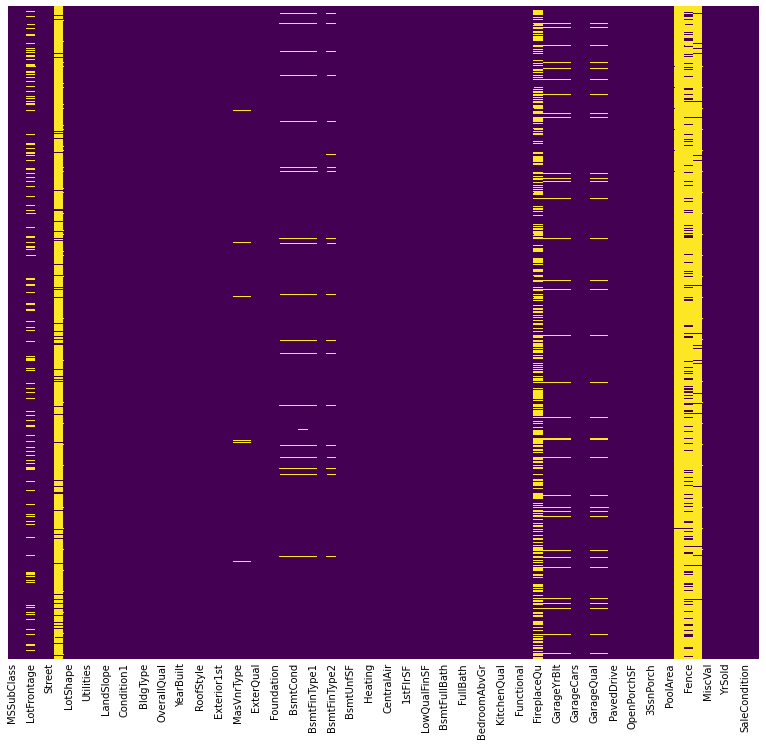

In [30]:
# Visualising NaN values
plt.figure(figsize = (12,12))
sns.heatmap(train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [31]:
missing_percentage(test)

,Total,Percent
PoolQC,1456,99.79
MiscFeature,1408,96.50
Alley,1352,92.67
Fence,1169,80.12
FireplaceQu,730,50.03
LotFrontage,227,15.56
GarageCond,78,5.35
GarageFinish,78,5.35
GarageYrBlt,78,5.35
GarageQual,78,5.35


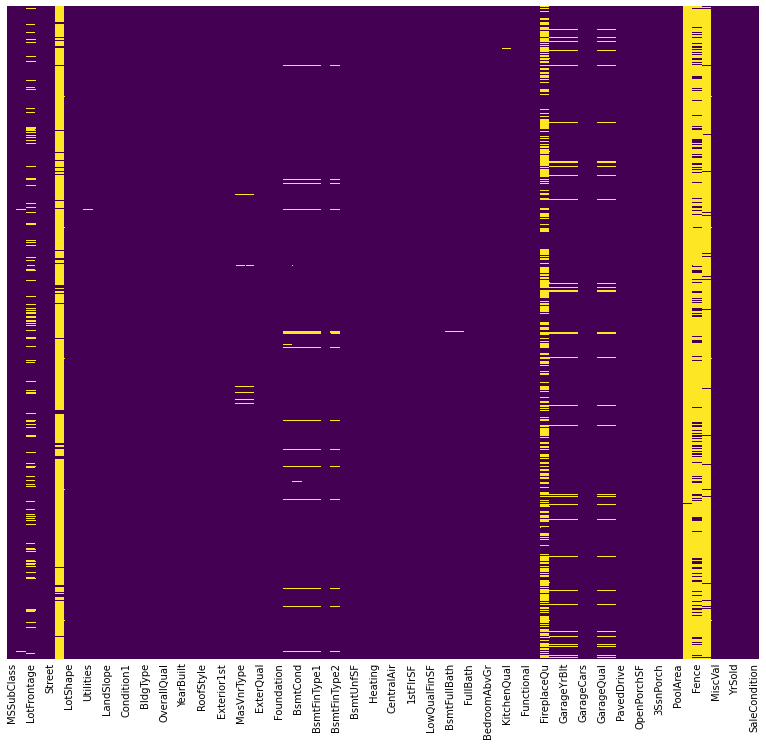

In [32]:
# Visualising NaN values
plt.figure(figsize = (12,12))
sns.heatmap(test.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [33]:
missing_percentage(train_test)

,Total,Percent
PoolQC,2909,99.66
MiscFeature,2814,96.40
Alley,2721,93.22
Fence,2348,80.44
SalePrice,1459,49.98
FireplaceQu,1420,48.65
LotFrontage,486,16.65
GarageCond,159,5.45
GarageYrBlt,159,5.45
GarageQual,159,5.45


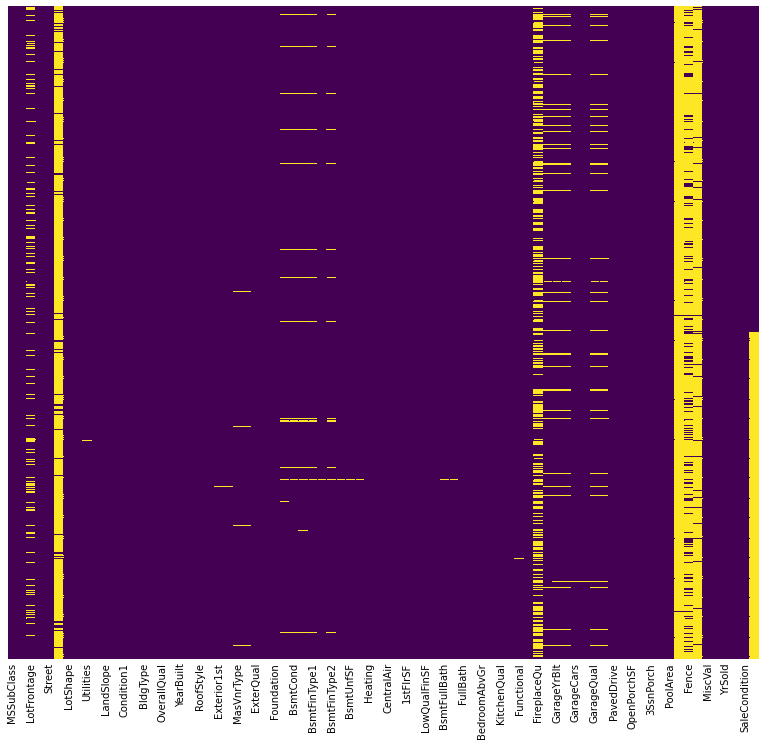

In [34]:
# Visualising NaN values
plt.figure(figsize = (12,12))
sns.heatmap(train_test.isnull(), yticklabels=False, cbar=False, cmap='viridis')

### Observation
There are multiple types of features.

Some features have missing values.

Most of the features are object( includes string values in the variable).

I want to focus on the target variable which is SalePrice. Let's create a histogram to see if the target variable is Normally distributed. If we want to create any linear model, it is essential that the features are normally distributed. This is one of the assumptions of multiple linear regression. I will explain more on this later.

#### 1. So... What can we expect?
In order to understand our data, we can look at each variable and try to understand their meaning and relevance to this problem. I know this is time-consuming, but it will give us the flavour of our dataset.

In order to have some discipline in our analysis, we can create an Excel spreadsheet with the following columns:

Variable - Variable name.

Type - Identification of the variables' type. There are two possible values for this field: 'numerical' or 'categorical'. By 'numerical' we mean variables for which the values are numbers, and by 'categorical' we mean variables for which the values are categories.

Segment - Identification of the variables' segment. We can define three possible segments: building, space or location. When we say 'building', we mean a variable that relates to the physical characteristics of the building (e.g. 'OverallQual'). When we say 'space', we mean a variable that reports space properties of the house (e.g. 'TotalBsmtSF'). Finally, when we say a 'location', we mean a variable that gives information about the place where the house is located (e.g. 'Neighborhood').

Expectation - Our expectation about the variable influence in 'SalePrice'. We can use a categorical scale with 'High', 'Medium' and 'Low' as possible values.

Conclusion - Our conclusions about the importance of the variable, after we give a quick look at the data. We can keep with the same categorical scale as in 'Expectation'.

Comments - Any general comments that occured to us.

While 'Type' and 'Segment' is just for possible future reference, the column 'Expectation' is important because it will help us develop a 'sixth sense'. To fill this column, we should read the description of all the variables and, one by one, ask ourselves:

Do we think about this variable when we are buying a house? (e.g. When we think about the house of our dreams, do we care about its 'Masonry veneer type'?).
If so, how important would this variable be? (e.g. What is the impact of having 'Excellent' material on the exterior instead of 'Poor'? And of having 'Excellent' instead of 'Good'?).
Is this information already described in any other variable? (e.g. If 'LandContour' gives the flatness of the property, do we really need to know the 'LandSlope'?).
After this daunting exercise, we can filter the spreadsheet and look carefully to the variables with 'High' 'Expectation'. Then, we can rush into some scatter plots between those variables and 'SalePrice', filling in the 'Conclusion' column which is just the correction of our expectations.

I went through this process and concluded that the following variables can play an important role in this problem:

OverallQual (which is a variable that I don't like because I don't know how it was computed; a funny exercise would be to predict 'OverallQual' using all the other variables available).

YearBuilt.

TotalBsmtSF.

GrLivArea.

I ended up with two 'building' variables ('OverallQual' and 'YearBuilt') and two 'space' variables ('TotalBsmtSF' and 'GrLivArea'). This might be a little bit unexpected as it goes against the real estate mantra that all that matters is 'location, location and location'. It is possible that this quick data examination process was a bit harsh for categorical variables. For example, I expected the 'Neigborhood' variable to be more relevant, but after the data examination I ended up excluding it. Maybe this is related to the use of scatter plots instead of boxplots, which are more suitable for categorical variables visualization. The way we visualize data often influences our conclusions.

However, the main point of this exercise was to think a little about our data and expectactions, so I think we achieved our goal. Now it's time for 'a little less conversation, a little more action please'. Let's shake it!

### 3.21 The 4 C's of Data Cleaning: Correcting, Completing, Creating, and Converting

### 3.22 Correcting
#### For correcting, lets see data distribution and outliers insight

In [35]:
# defining customised plots to see distribution, probability and boxplot

def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

### Checking outliers in continuous variables (Visualisation)

Train LotFrontage


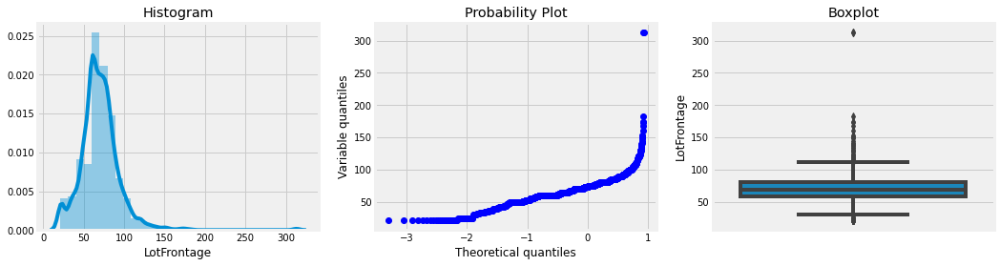

Test LotFrontage


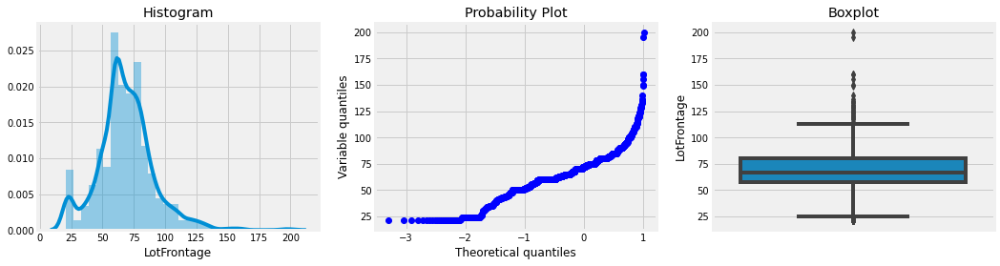

Train LotArea


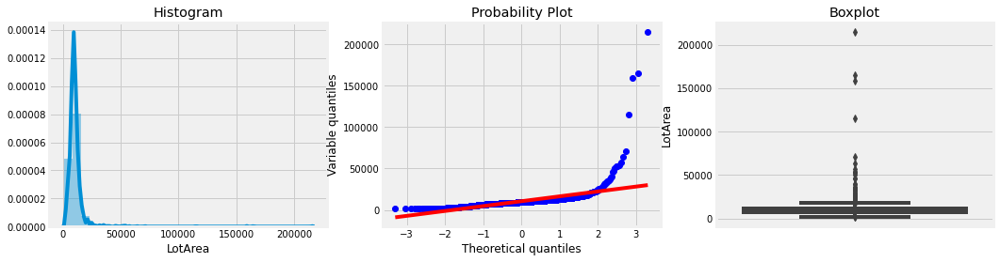

Test LotArea


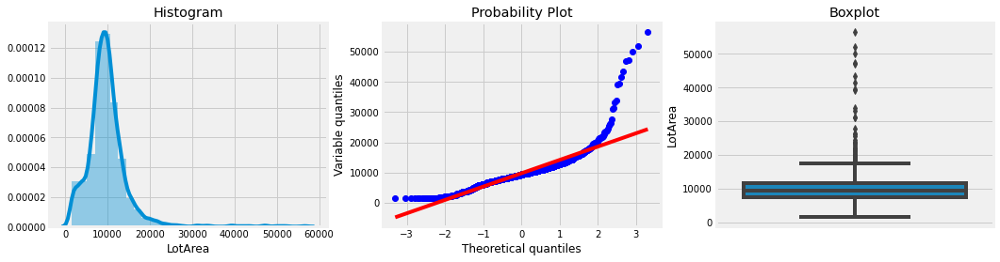

Train YearBuilt


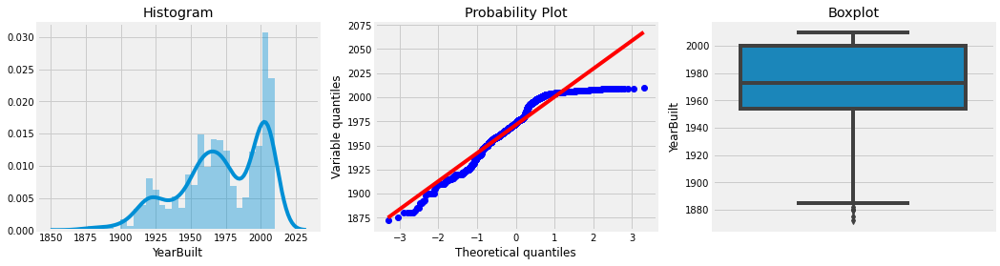

Test YearBuilt


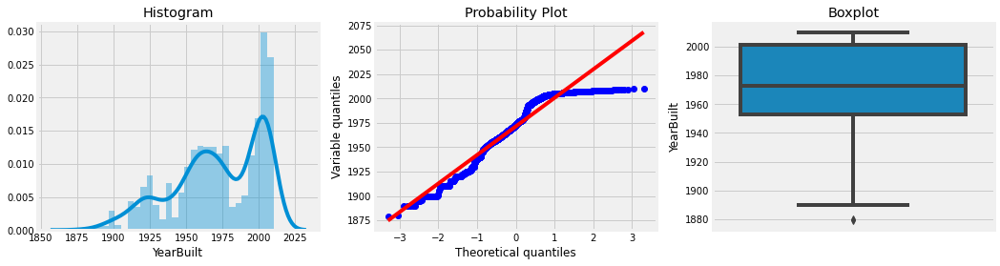

Train YearRemodAdd


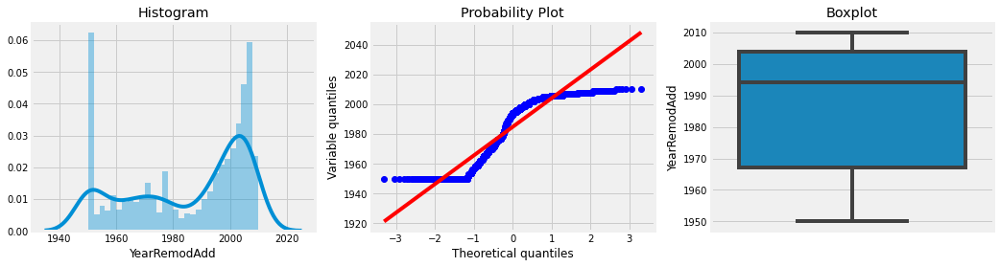

Test YearRemodAdd


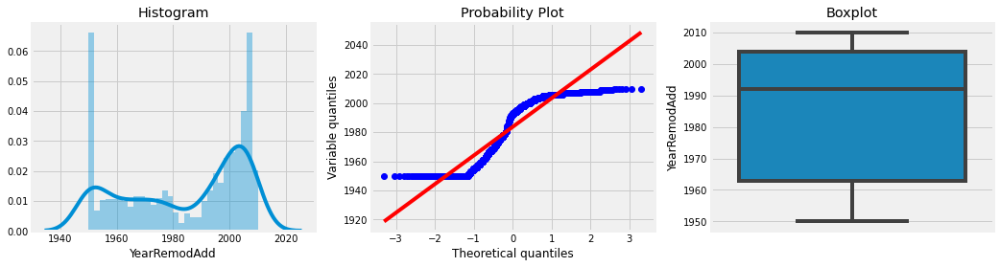

Train MasVnrArea


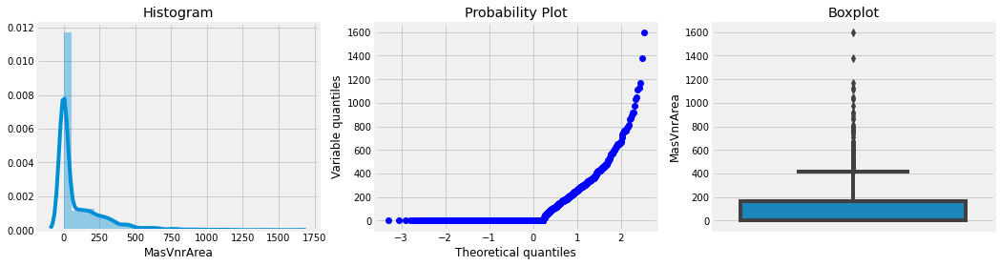

Test MasVnrArea


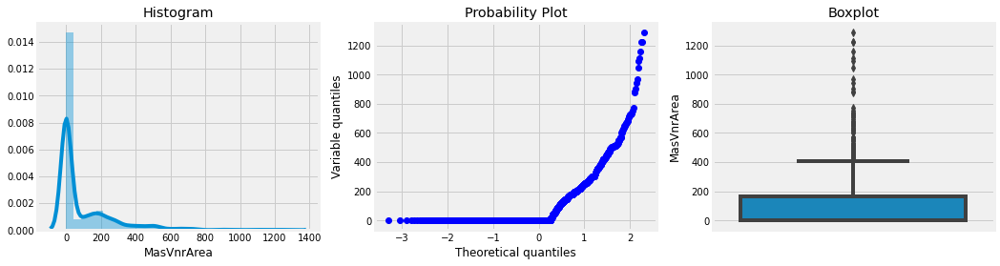

Train BsmtFinSF1


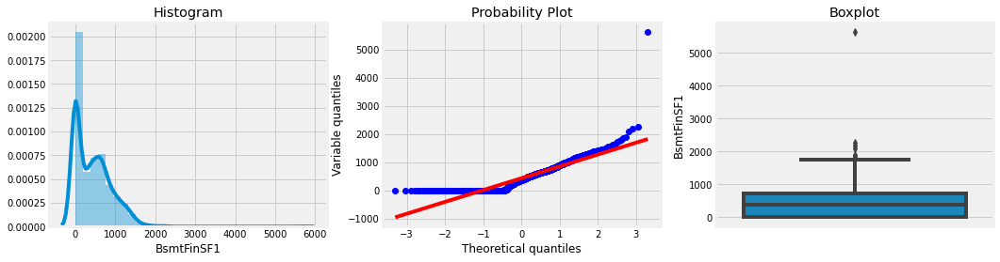

Test BsmtFinSF1


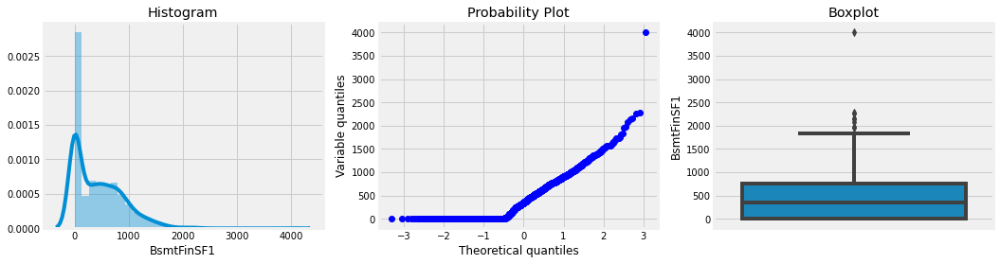

Train BsmtFinSF2


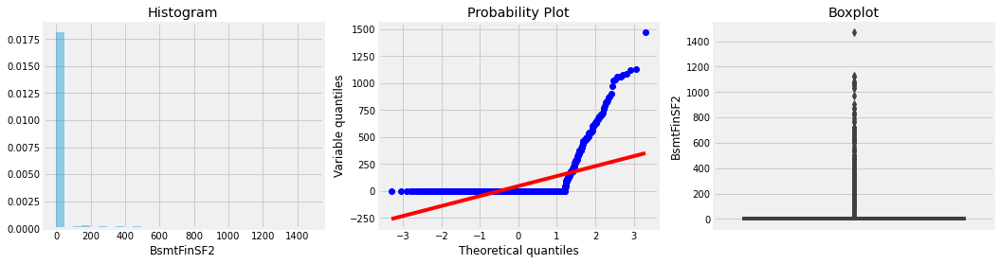

Test BsmtFinSF2


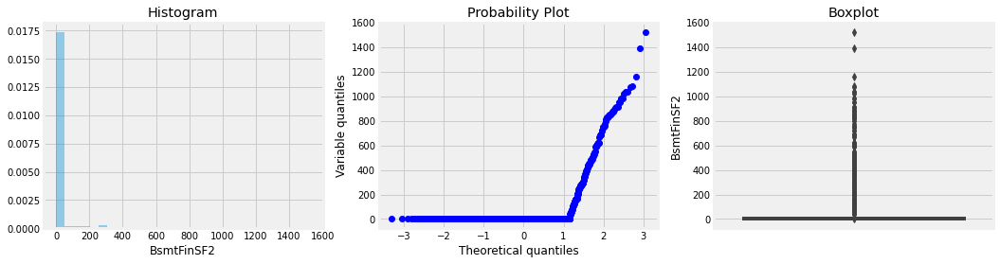

Train BsmtUnfSF


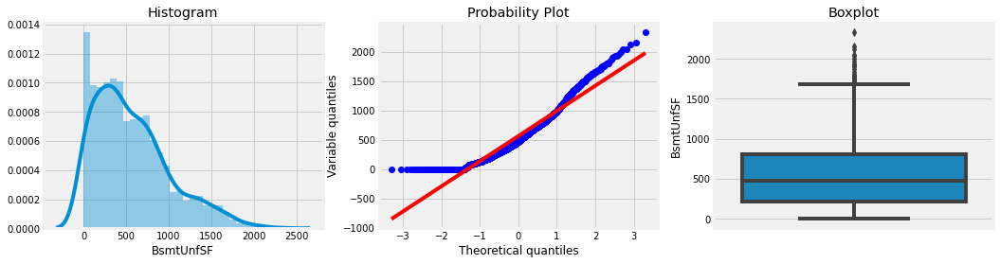

Test BsmtUnfSF


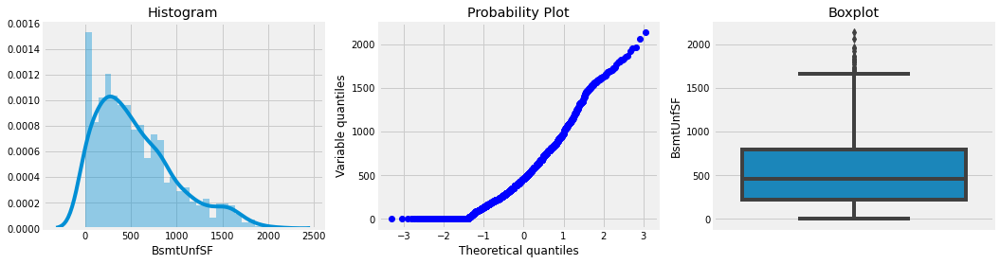

Train TotalBsmtSF


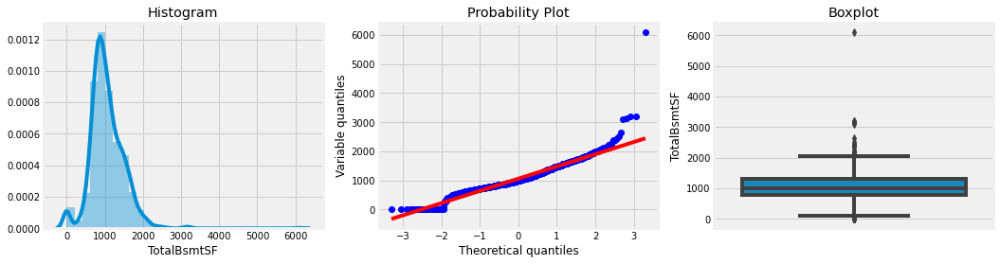

Test TotalBsmtSF


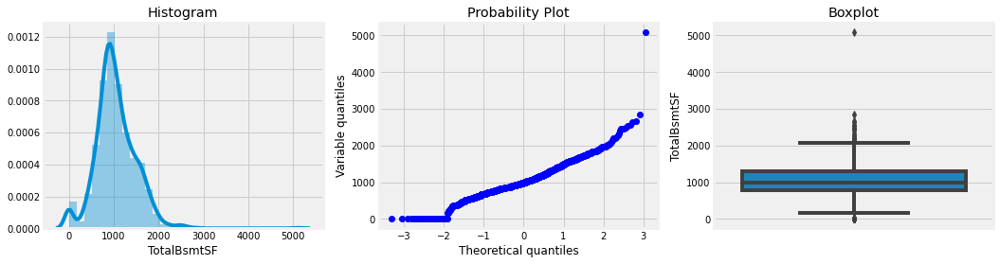

Train 1stFlrSF


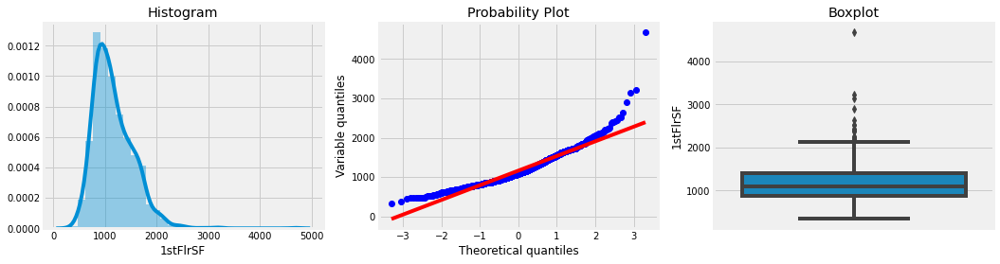

Test 1stFlrSF


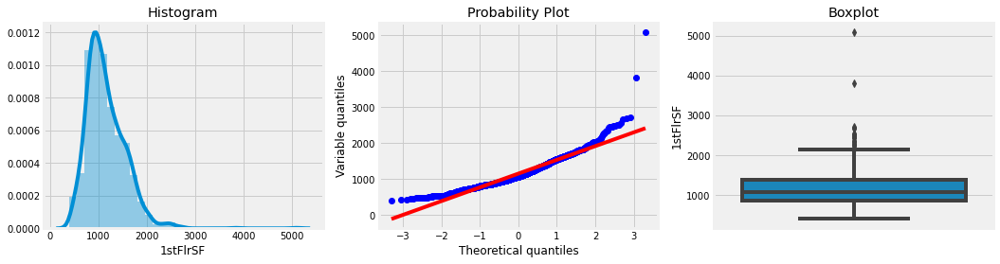

Train 2ndFlrSF


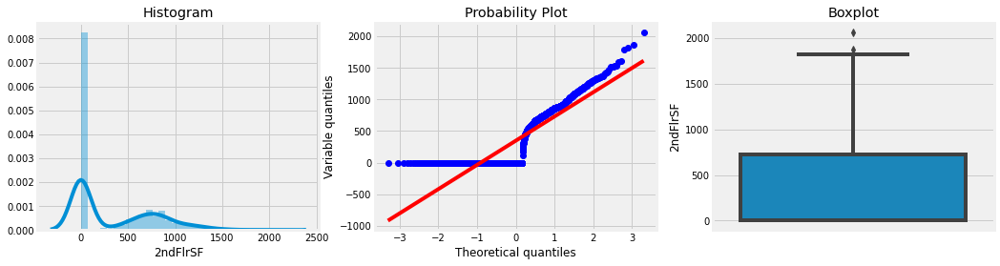

Test 2ndFlrSF


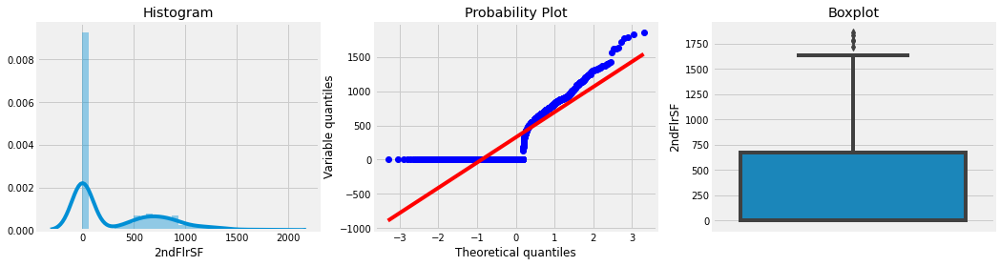

Train LowQualFinSF


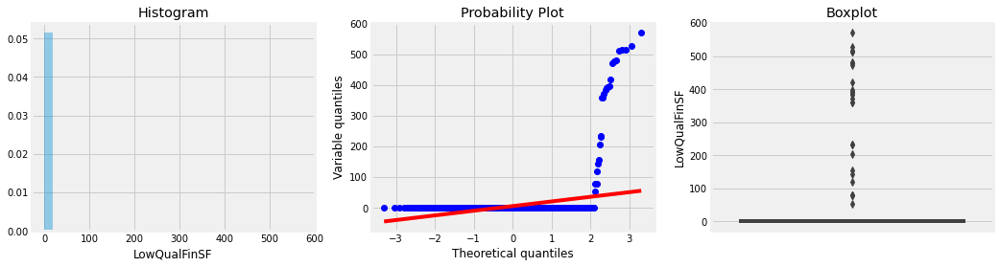

Test LowQualFinSF


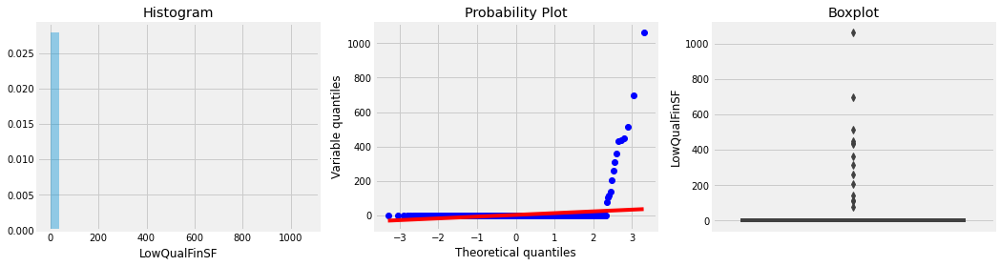

Train GrLivArea


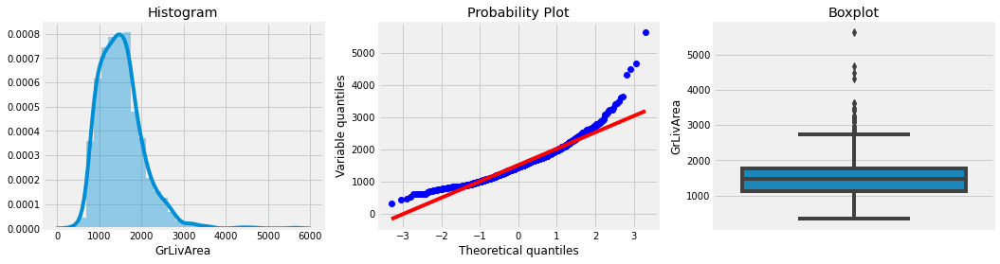

Test GrLivArea


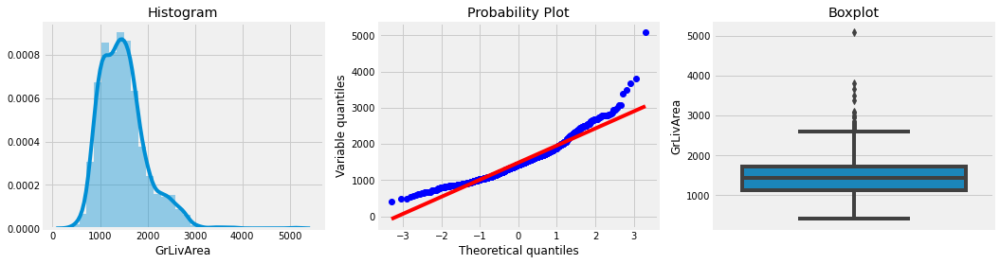

Train GarageYrBlt


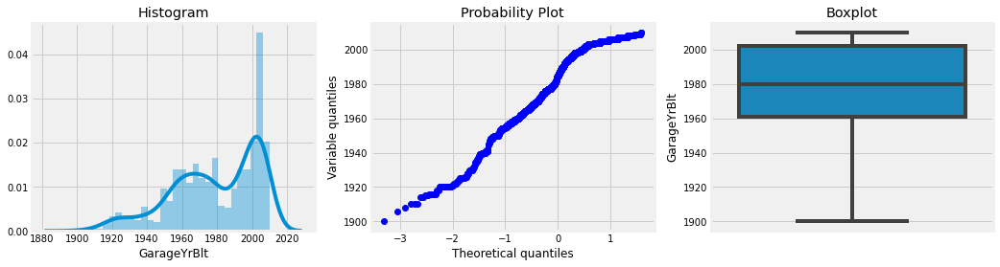

Test GarageYrBlt


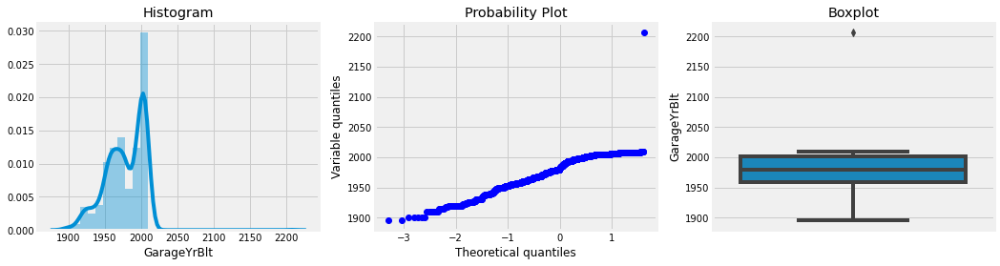

Train GarageArea


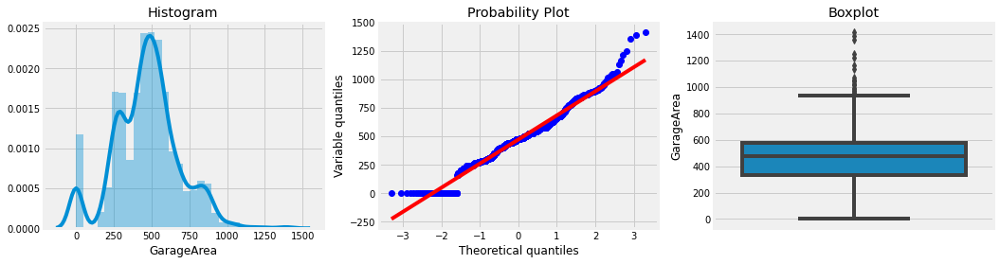

Test GarageArea


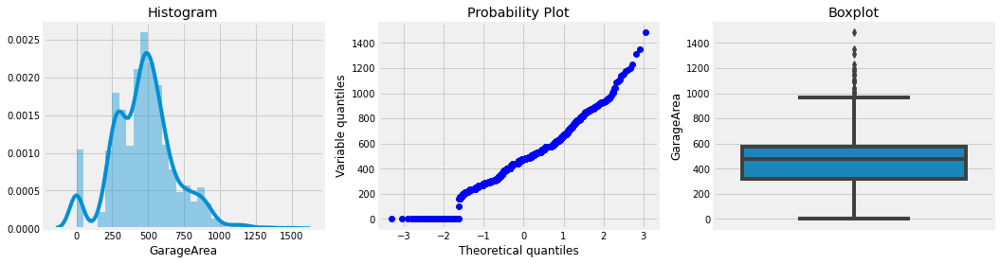

Train WoodDeckSF


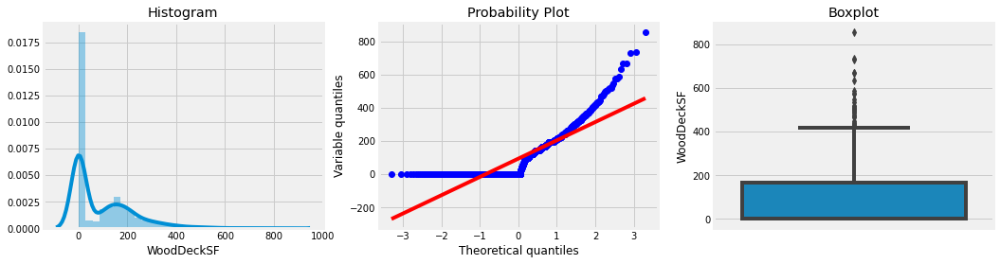

Test WoodDeckSF


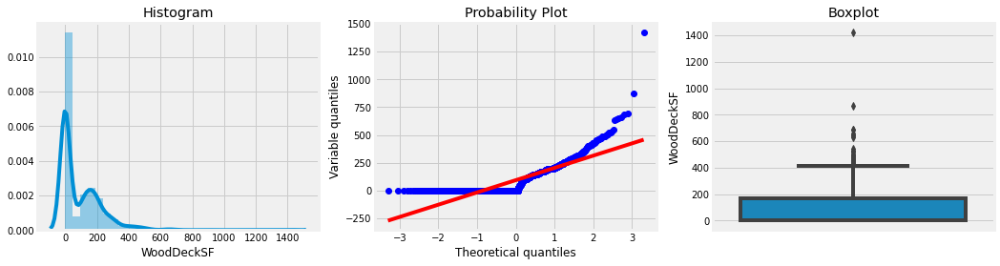

Train OpenPorchSF


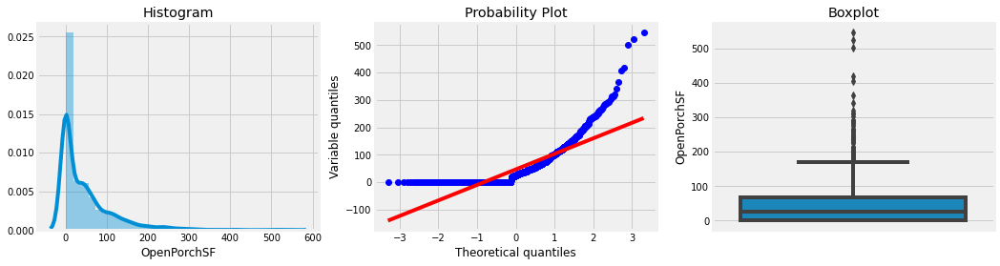

Test OpenPorchSF


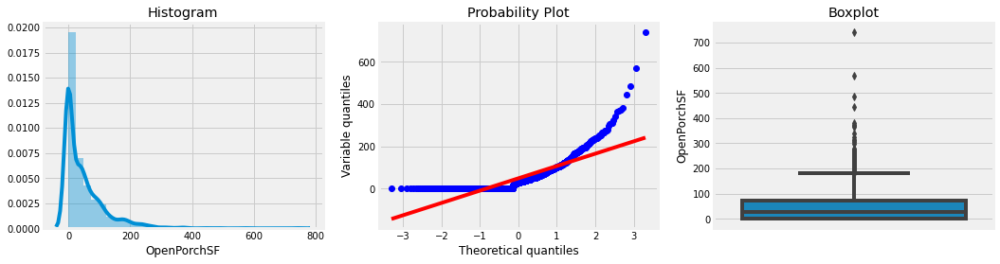

Train EnclosedPorch


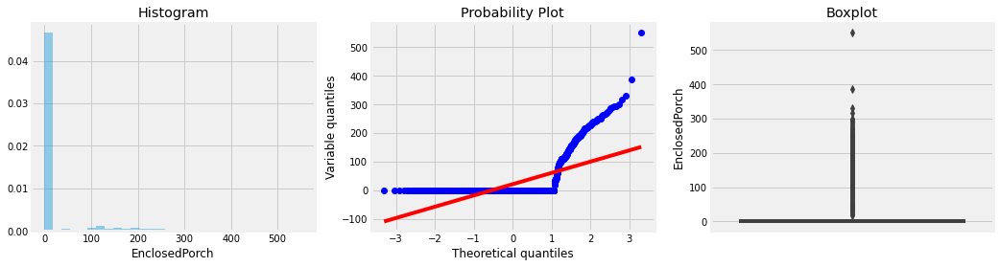

Test EnclosedPorch


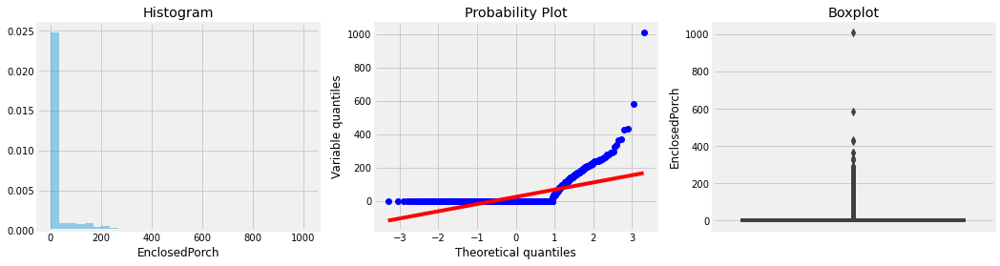

Train 3SsnPorch


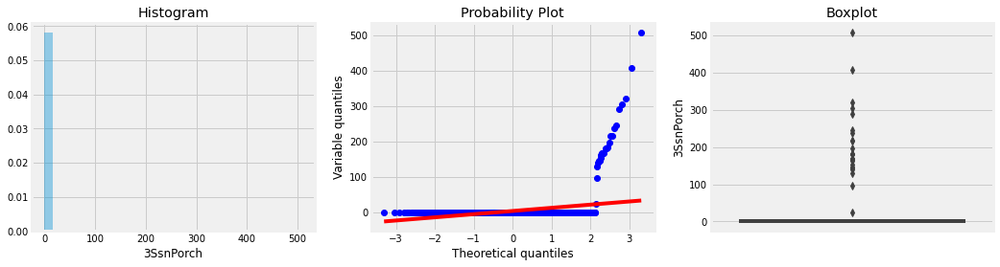

Test 3SsnPorch


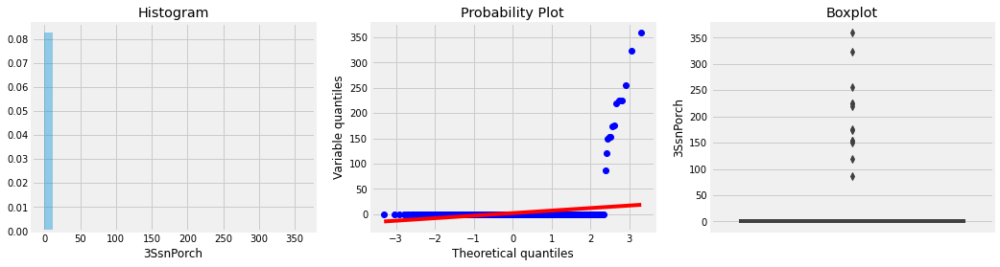

Train ScreenPorch


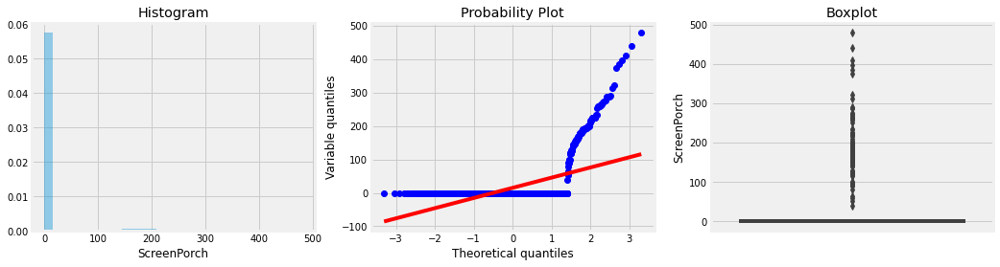

Test ScreenPorch


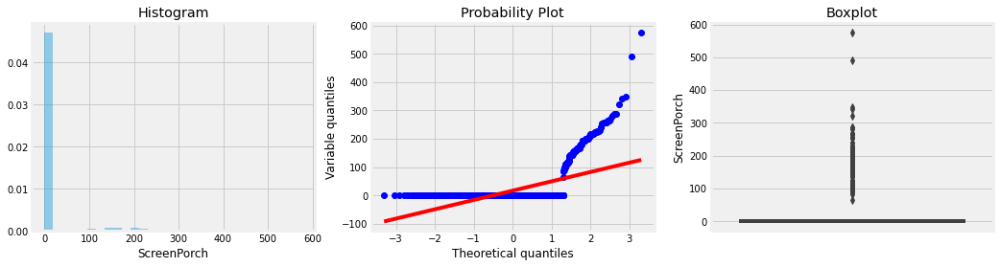

Train MiscVal


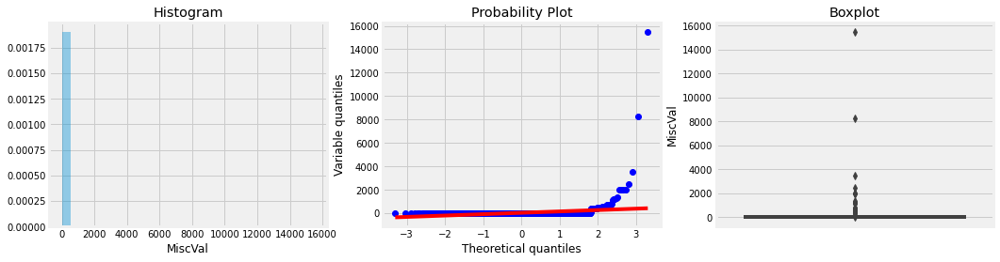

Test MiscVal


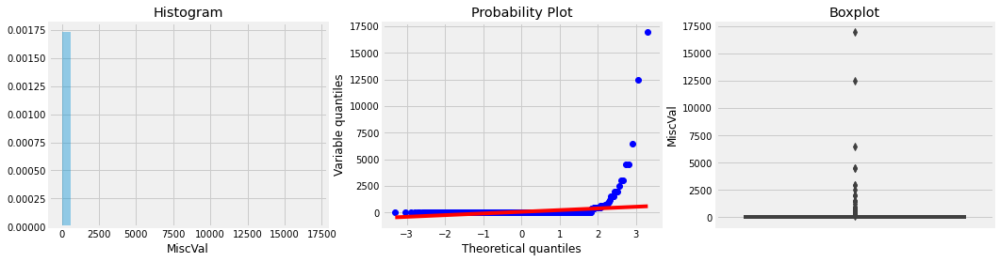

In [36]:
for var in cont_vars:
    print("Train", var)
    diagnostic_plots(train, var)
    print("Test", var)
    diagnostic_plots(test, var)

In [37]:
# defining outlier function to find outliers
def outlier_function(df, col_name):
    ''' this function detects first and third quartile and interquartile range for a given column of a dataframe
    then calculates upper and lower limits to determine outliers conservatively
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(df[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(df[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
                      
    upper_limit = third_quartile+(1.5*IQR)
    lower_limit = first_quartile-(1.5*IQR)
    outlier_count = 0
                      
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

In [38]:
# finding outliers in train and test data
# loop through all columns to see if there are any outliers
outlier_columns=[]
for dataset in data:
    for column in cont_vars:
        if outlier_function(dataset, column)[2] > 0:
            outlier_columns.append(column)
            print( "There are {} outliers in {}".format(outlier_function(dataset, column)[2], column))
            print("Lower limit is {} & Upper limit is {} in {}".format(outlier_function(dataset, column)[0],
                                                                       outlier_function(dataset, column)[1] ,column))
            print('\n')
    print(outlier_columns)

There are 69 outliers in LotArea
Lower limit is 1481.5 & Upper limit is 17673.5 in LotArea


There are 7 outliers in YearBuilt
Lower limit is 1885.0 & Upper limit is 2069.0 in YearBuilt


There are 7 outliers in BsmtFinSF1
Lower limit is -1068.375 & Upper limit is 1780.625 in BsmtFinSF1


There are 167 outliers in BsmtFinSF2
Lower limit is 0.0 & Upper limit is 0.0 in BsmtFinSF2


There are 29 outliers in BsmtUnfSF
Lower limit is -654.5 & Upper limit is 1685.5 in BsmtUnfSF


There are 61 outliers in TotalBsmtSF
Lower limit is 42.0 & Upper limit is 2052.0 in TotalBsmtSF


There are 20 outliers in 1stFlrSF
Lower limit is 118.125 & Upper limit is 2155.125 in 1stFlrSF


There are 2 outliers in 2ndFlrSF
Lower limit is -1092.0 & Upper limit is 1820.0 in 2ndFlrSF


There are 26 outliers in LowQualFinSF
Lower limit is 0.0 & Upper limit is 0.0 in LowQualFinSF


There are 31 outliers in GrLivArea
Lower limit is 158.625 & Upper limit is 2747.625 in GrLivArea


There are 21 outliers in GarageArea
L

In [39]:
# Before moving ahead, lets save our original data 
train_orig = train.copy(deep=True)
test_orig = test.copy(deep=True)

### I will deal with outliers,after filling missing values, categorical data encoding, continuous data transformation to make itn normalised, discretisation
### Steps are:-

1. Missing Data Imputation

2. Categorical Data Encoding.

3. Continuous Data Transformation to make it normalised.

4. Discretisation.

5. Outlier Handling.

6. Feature Selection.

### Before Missing Data Imputation, lets analyse the data by visualisation tools

#### First things first: analysing 'SalePrice'

In [40]:
train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

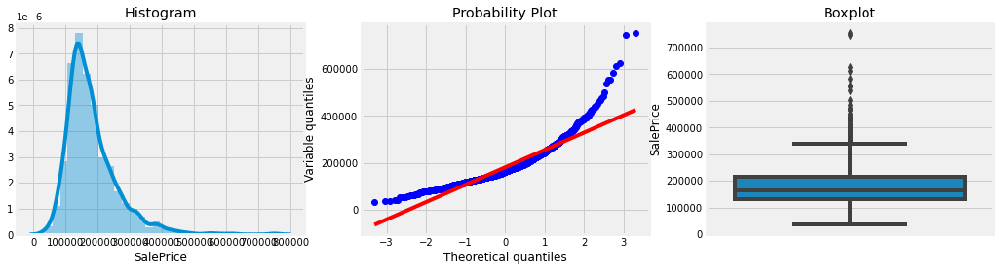

In [41]:
diagnostic_plots(train, 'SalePrice')

#### Above can tell us a lot about our target variable.

Our target variable, SalePrice is not normally distributed.

Our target variable is right-skewed.

There are multiple outliers in the variable.

In [42]:
#skewness and kurtosis
print("Skewness: " + str(train['SalePrice'].skew()))
print("Kurtosis: " + str(train['SalePrice'].kurt()))

Skewness: 1.8828757597682129
Kurtosis: 6.536281860064529


#### It looks like there are quite a bit Skewness and Kurtosis in the target variable. Let's talk about those a bit.

Skewness is the degree of distortion from the symmetrical bell curve or the normal curve.

So, a symmetrical distribution will have a skewness of "0".

There are two types of Skewness: Positive and Negative.
    
Positive Skewness(similar to our target variable distribution) means the tail on the right side of the distribution is longer and fatter.

In positive Skewness the mean and median will be greater than the mode similar to this dataset. Which means more houses were sold by less than the average price.

Negative Skewness means the tail on the left side of the distribution is longer and fatter.

In negative Skewness the mean and median will be less than the mode.

Skewness differentiates in extreme values in one versus the other tail.

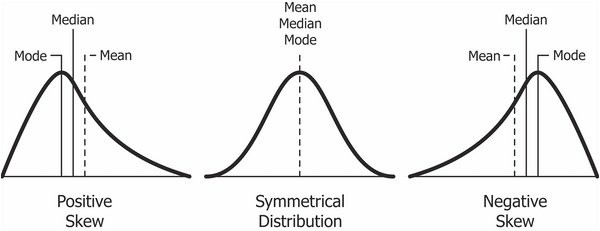

In [43]:
from IPython.display import Image
Image("/Users/tuktuk/Downloads/1*nj-Ch3AUFmkd0JUSOW_bTQ.jpeg") # Image 2

#### Kurtosis According to Wikipedia,

In probability theory and statistics, Kurtosis is the measure of the "tailedness" of the probability. distribution of a real-valued random variable. So, In other words, it is the measure of the extreme values(outliers) present in the distribution.

There are three types of Kurtosis: Mesokurtic, Leptokurtic, and Platykurtic.
    
Mesokurtic is similar to the normal curve with the standard value of 3. This means that the extreme values of this distribution are similar to that of a normal distribution.

Leptokurtic Example of leptokurtic distributions are the T-distributions with small degrees of freedom.

Platykurtic: Platykurtic describes a particular statistical distribution with thinner tails than a normal distribution. Because this distribution has thin tails, it has fewer outliers (e.g., extreme values three or more standard deviations from the mean) than do mesokurtic and leptokurtic distributions.

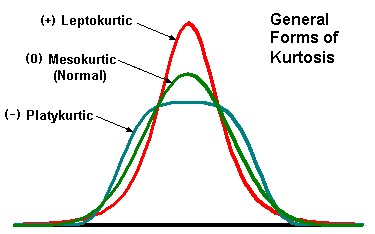

In [46]:
Image("/Users/tuktuk/Downloads/KurtosisPict.jpg") # Image 3

#### We can fix this by using different types of transformation(more on this later). However, before doing that, I want to find out the relationships among the target variable and other predictor variables. Let's find out.

### Lets visualise relationship of target label with continuous variables, discrete label and categorical labels, one by one

### Lets see distribution of Target Label first

In [47]:
## Getting the correlation of all the features with target variable.

(train.corr()**2)["SalePrice"].sort_values(ascending = False)[1:]

OverallQual      0.625652
GrLivArea        0.502149
GarageCars       0.410124
GarageArea       0.388667
TotalBsmtSF      0.376481
1stFlrSF         0.367057
FullBath         0.314344
TotRmsAbvGrd     0.284860
YearBuilt        0.273422
YearRemodAdd     0.257151
GarageYrBlt      0.236548
MasVnrArea       0.228000
Fireplaces       0.218023
BsmtFinSF1       0.149320
LotFrontage      0.123763
WoodDeckSF       0.105244
2ndFlrSF         0.101974
OpenPorchSF      0.099765
HalfBath         0.080717
LotArea          0.069613
BsmtFullBath     0.051585
BsmtUnfSF        0.046001
BedroomAbvGr     0.028296
KitchenAbvGr     0.018471
EnclosedPorch    0.016532
ScreenPorch      0.012420
PoolArea         0.008538
MSSubClass       0.007104
OverallCond      0.006062
MoSold           0.002156
3SsnPorch        0.001988
YrSold           0.000837
LowQualFinSF     0.000656
MiscVal          0.000449
BsmtHalfBath     0.000284
BsmtFinSF2       0.000129
Name: SalePrice, dtype: float64

#### These are the predictor variables sorted in a descending order starting with the most correlated one OverallQual. Let's put this one in a scatter plot and see how it looks.

### Continuous variables - scatter plot is the best to visualise relationship between target label and contionuous variables in a Regression probelm

### Multivariate Analysis using Scatter Plots

In [48]:
def customized_scatterplot(y, x):
        ## Sizing the plot. 
    style.use('fivethirtyeight')
    plt.subplots(figsize = (12,8))
    ## Plotting target variable with predictor variable(OverallQual)
    sns.scatterplot(y = y, x = x);

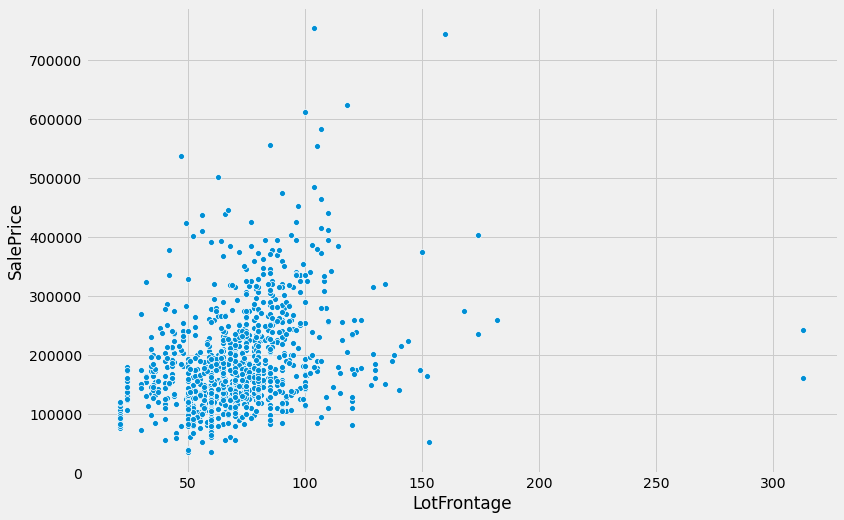

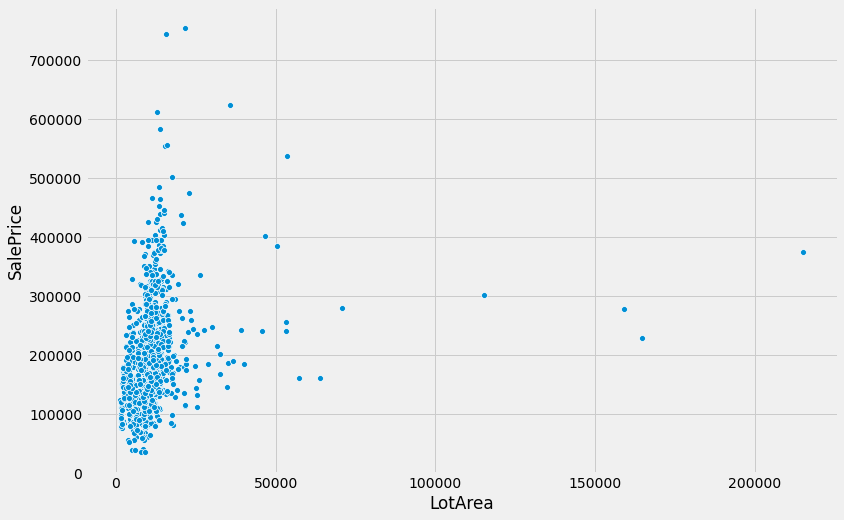

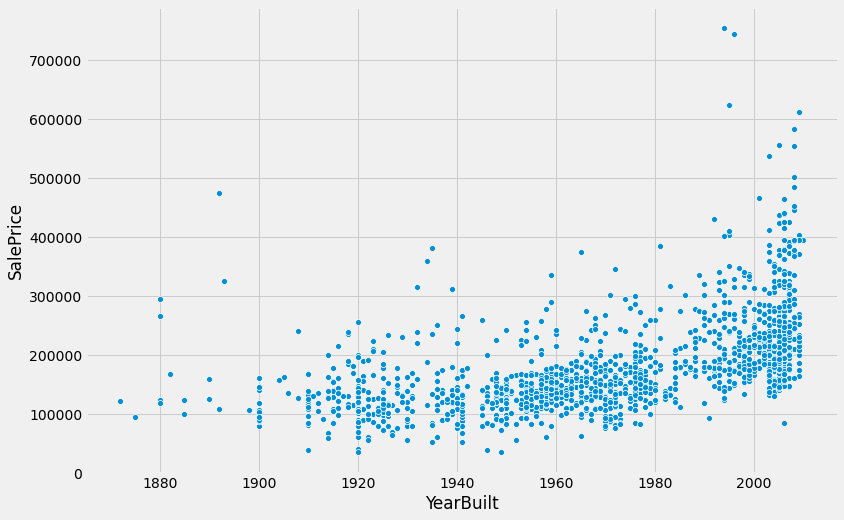

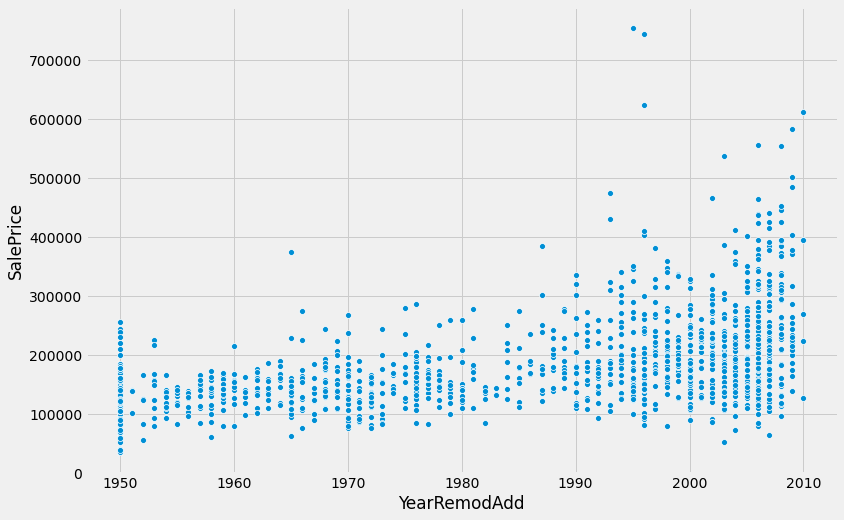

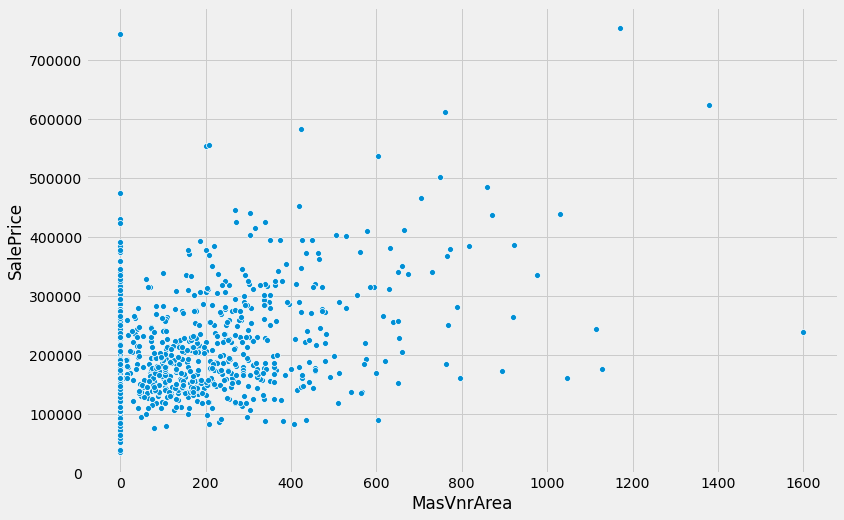

...

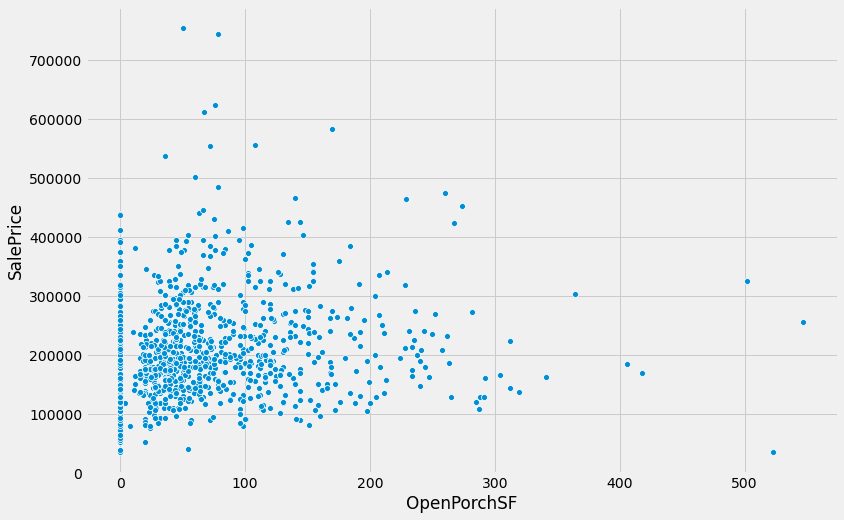

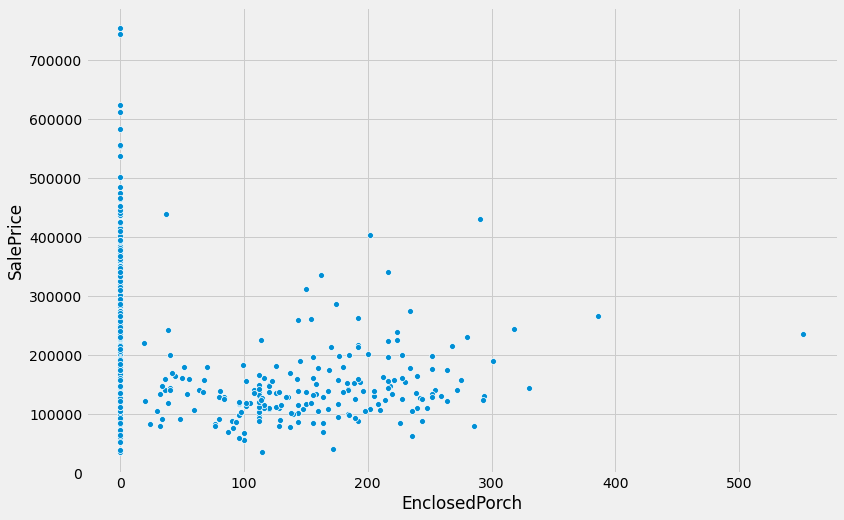

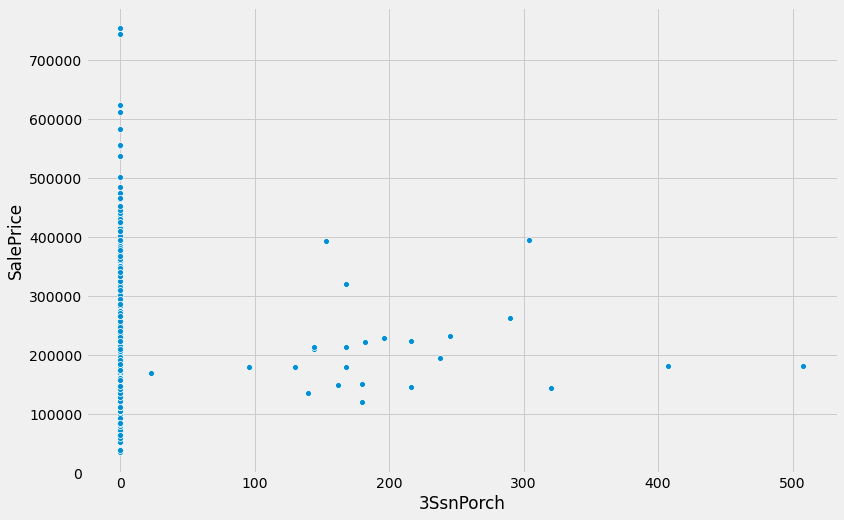

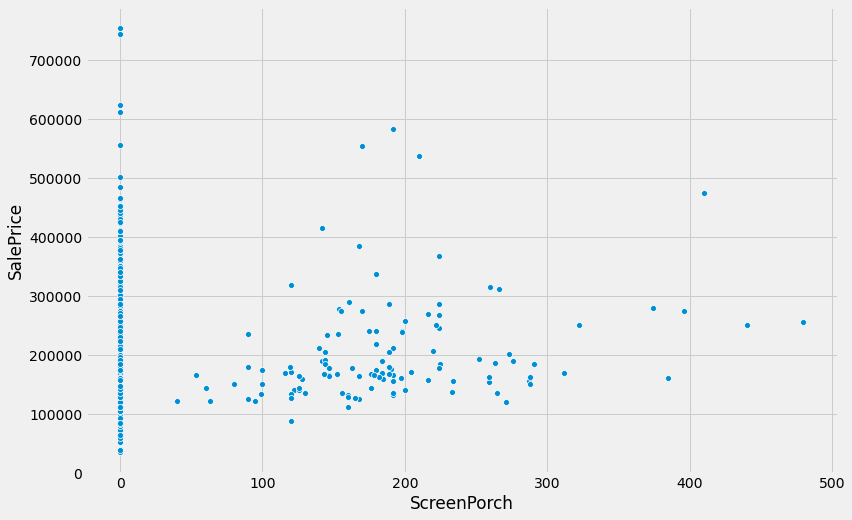

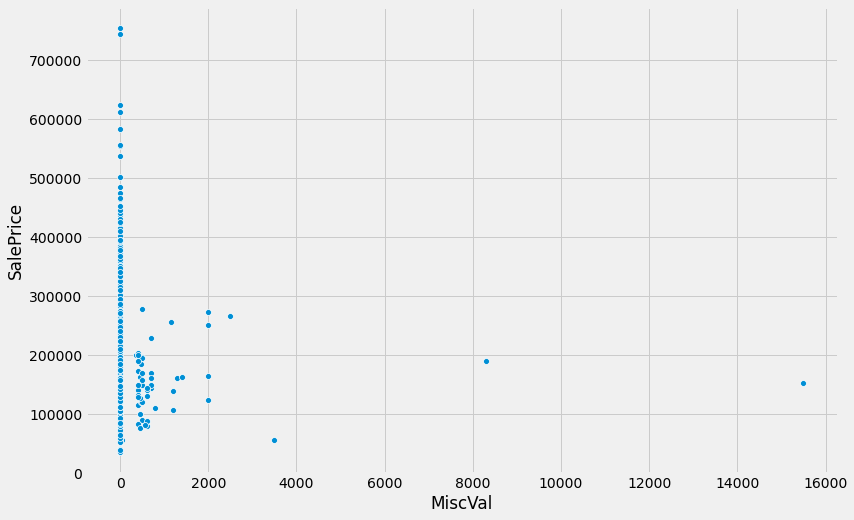

In [49]:
for var in cont_vars:
    customized_scatterplot(train['SalePrice'], train[var])

### We can see relationship of continuous variables with Sale Price. 

### Univariate Analysis by distribution plots of every continuous variable

In [50]:
def distributionplot(x):
        ## Sizing the plot. 
    style.use('fivethirtyeight')
    plt.subplots(figsize = (12,8))
    ## Plotting distribution plot)
    sns.kdeplot(x);

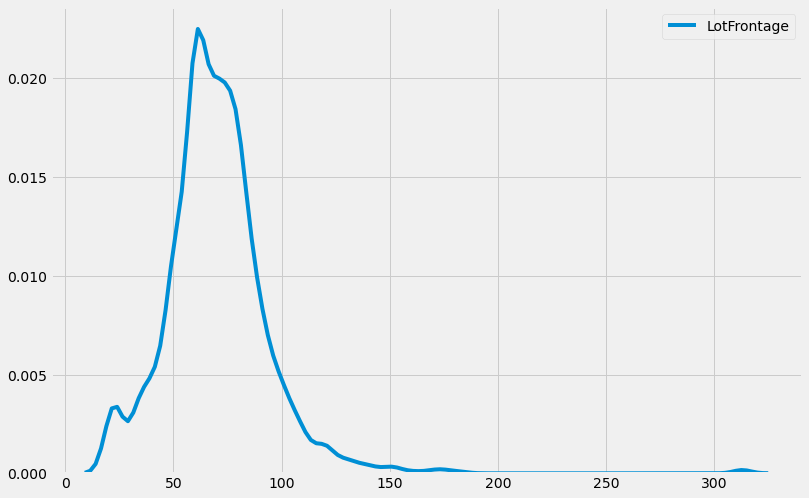

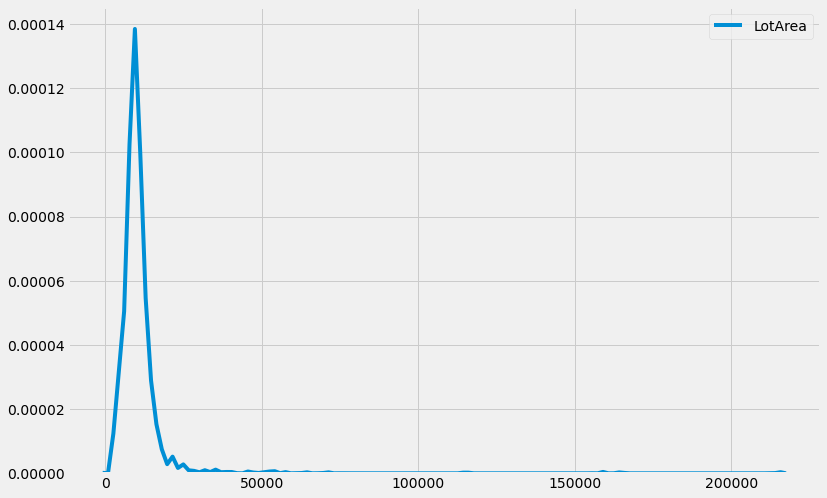

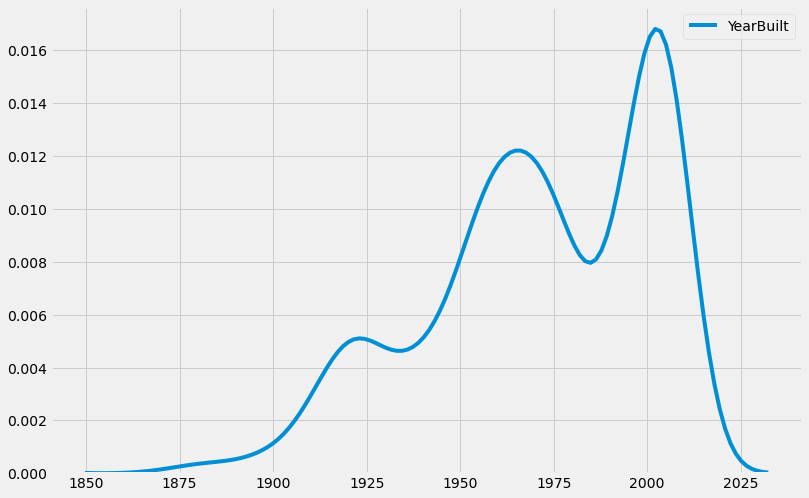

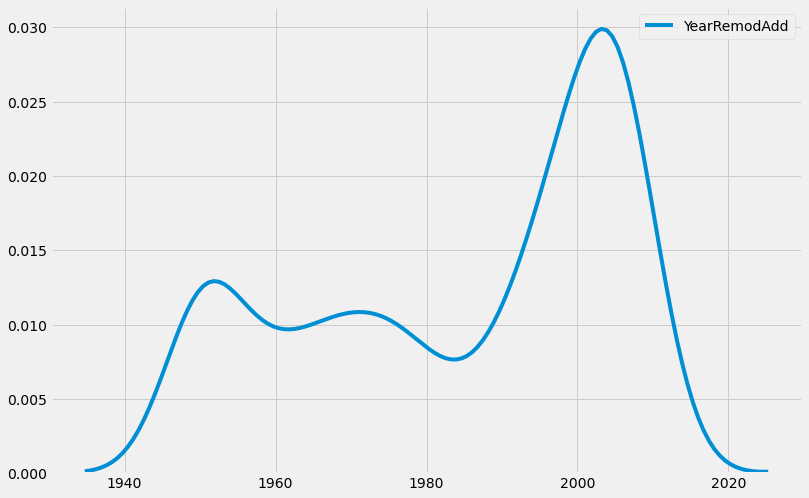

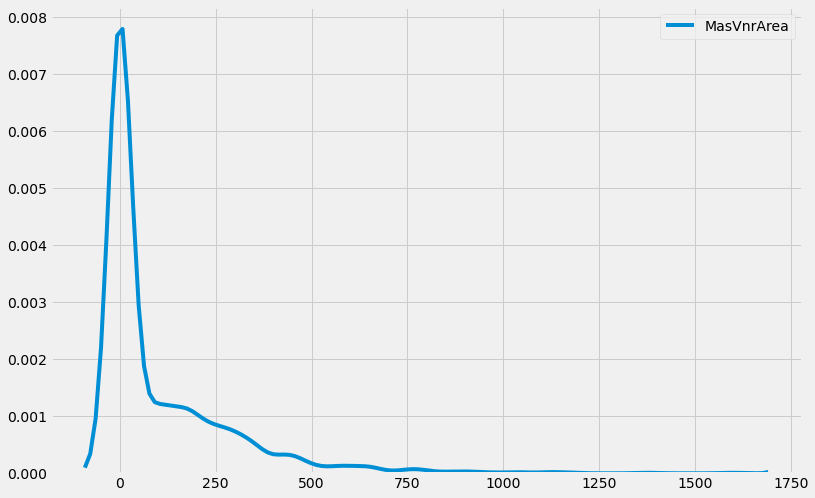

...

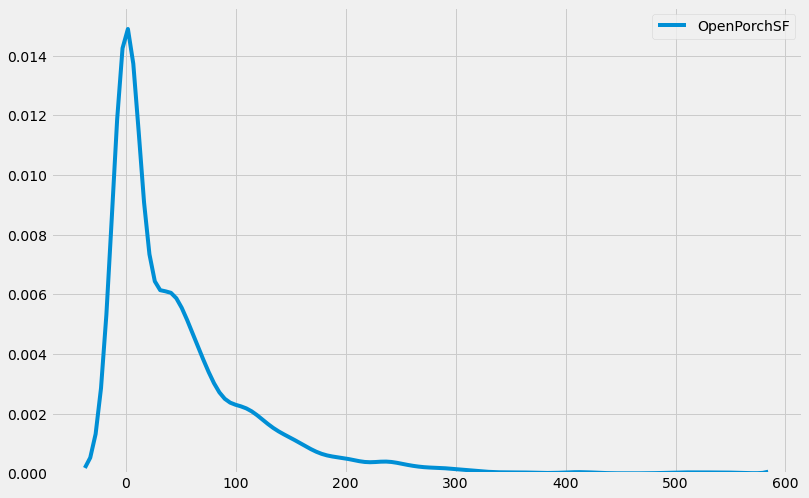

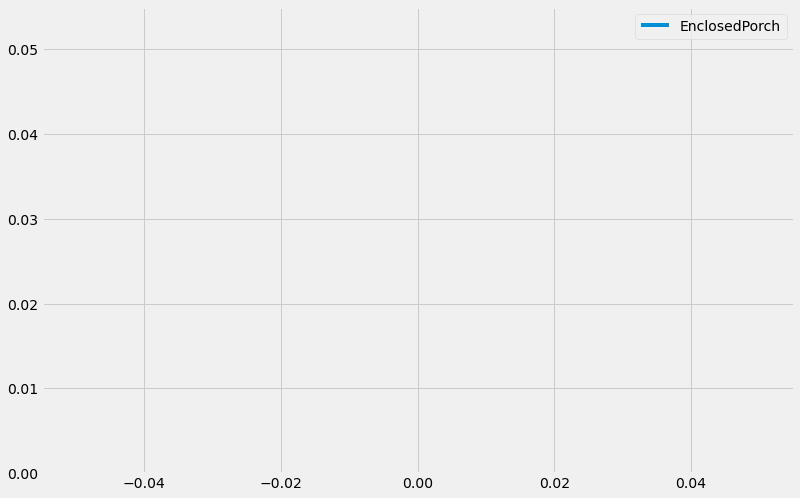

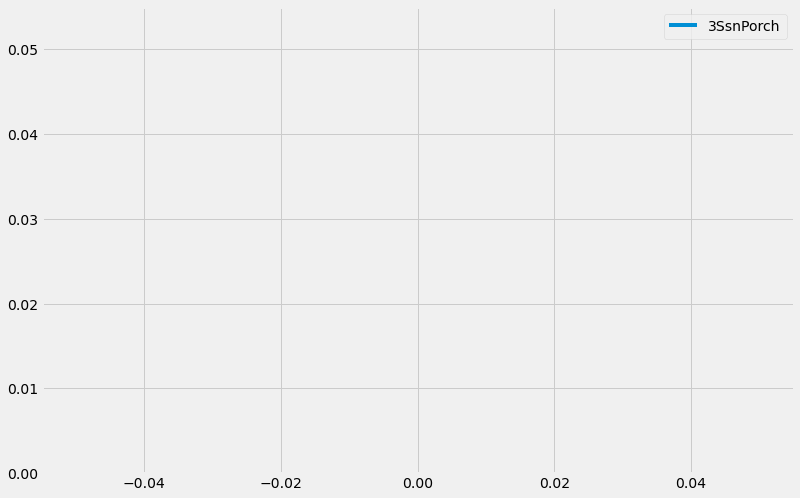

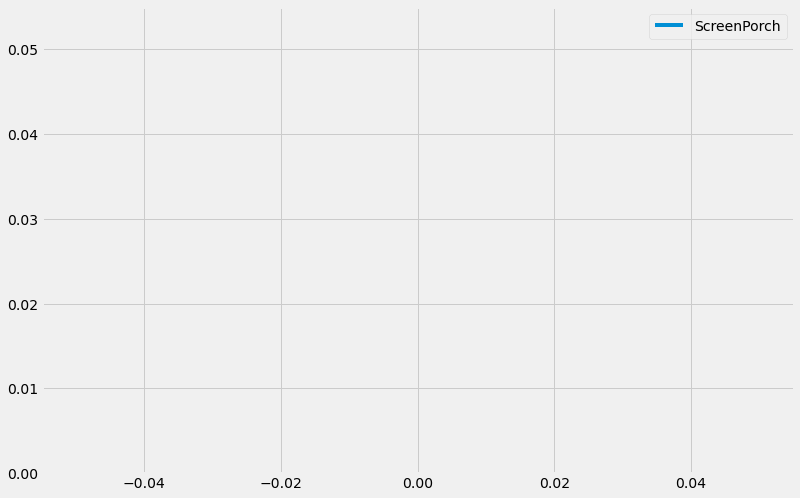

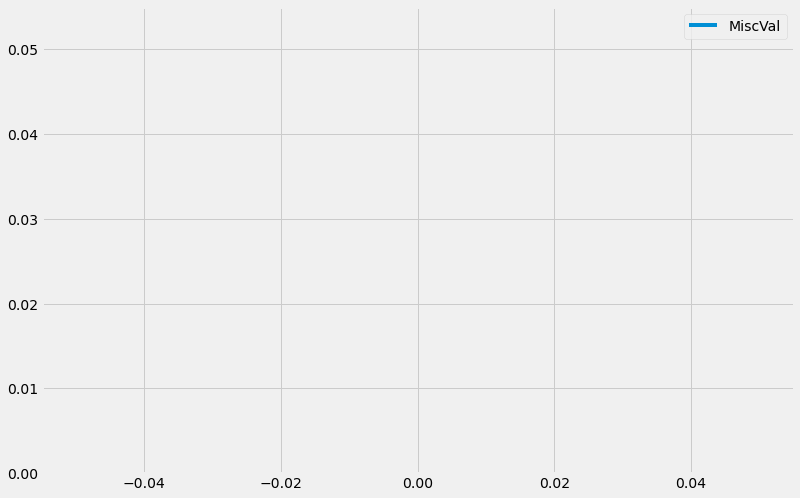

In [51]:
### Visualising their distribution
for var in cont_vars:
    distributionplot(train[var])

#### we can see maximum variables are skewed

### Relationship with discrete numerical features using box plots

In [52]:
discrete_vars

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'PoolArea',
 'MoSold',
 'YrSold']

In [53]:
for var in discrete_vars:
    
    print(var, train[var].value_counts())
    

MSSubClass 20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
OverallQual 5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64
OverallCond 5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64
BsmtFullBath 0    856
1    588
2     15
3      1
Name: BsmtFullBath, dtype: int64
BsmtHalfBath 0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64
FullBath 2    768
1    650
3     33
0      9
Name: FullBath, dtype: int64
HalfBath 0    913
1    535
2     12
Name: HalfBath, dtype: int64
BedroomAbvGr 3    804
2    358
4    213
1     50
5     21
6      7
0      6
8      1
Name: BedroomAbvGr, dtype: int64
KitchenAbvGr 1    1392
2      65
3       2
0       1
Name: KitchenAbvGr, dtype: int64
TotRmsAbvGrd 6     402


In [54]:
for var in discrete_vars:
    
    print(var, train[var].value_counts(), (train[var].value_counts()/len(train)))

MSSubClass 20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64 20     0.367123
60     0.204795
50     0.098630
120    0.059589
30     0.047260
160    0.043151
70     0.041096
80     0.039726
90     0.035616
190    0.020548
85     0.013699
75     0.010959
45     0.008219
180    0.006849
40     0.002740
Name: MSSubClass, dtype: float64
OverallQual 5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64 5     0.271918
6     0.256164
7     0.218493
8     0.115068
4     0.079452
9     0.029452
3     0.013699
10    0.012329
2     0.002055
1     0.001370
Name: OverallQual, dtype: float64
OverallCond 5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64 5    0.562329
6    0.172603
7    0.140411
8    0.049315
4    0.0390

In [55]:
def cutomboxplot(df, x):
        ## Sizing the plot. 
    style.use('fivethirtyeight')
    plt.subplots(figsize = (12,8))
    ## Plotting distribution plot)
    sns.boxplot(x=x, y = df.SalePrice, data =df);

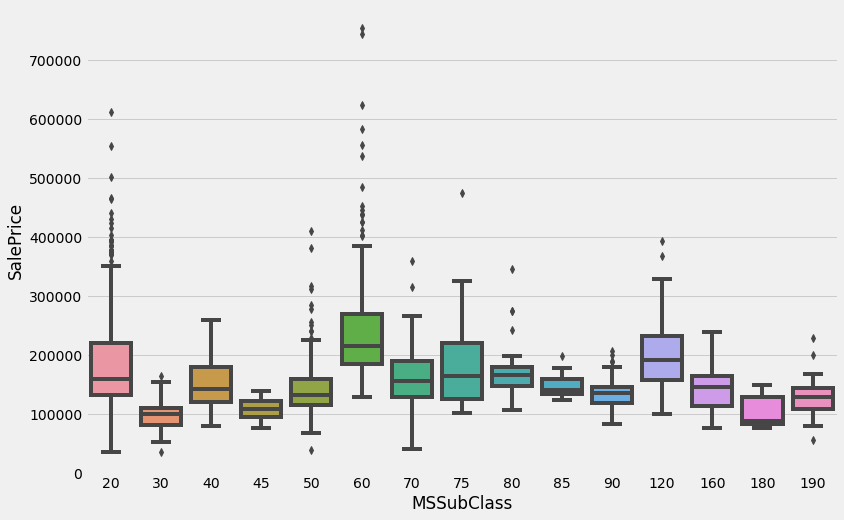

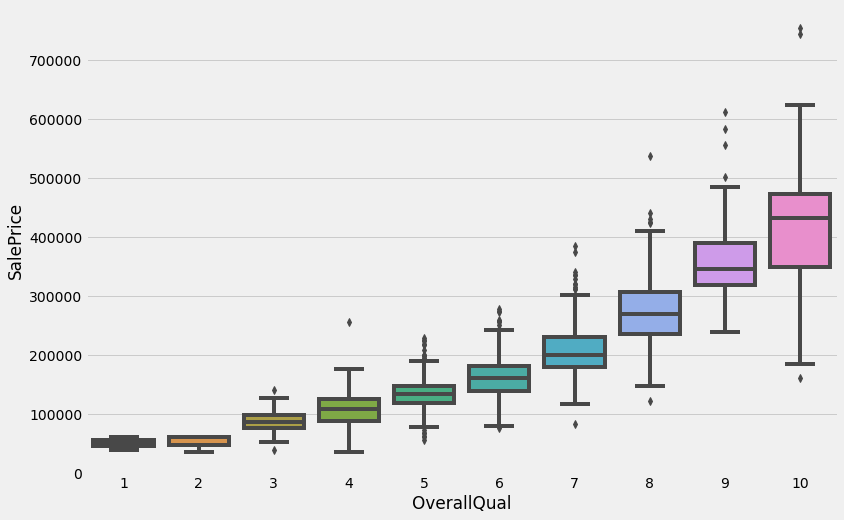

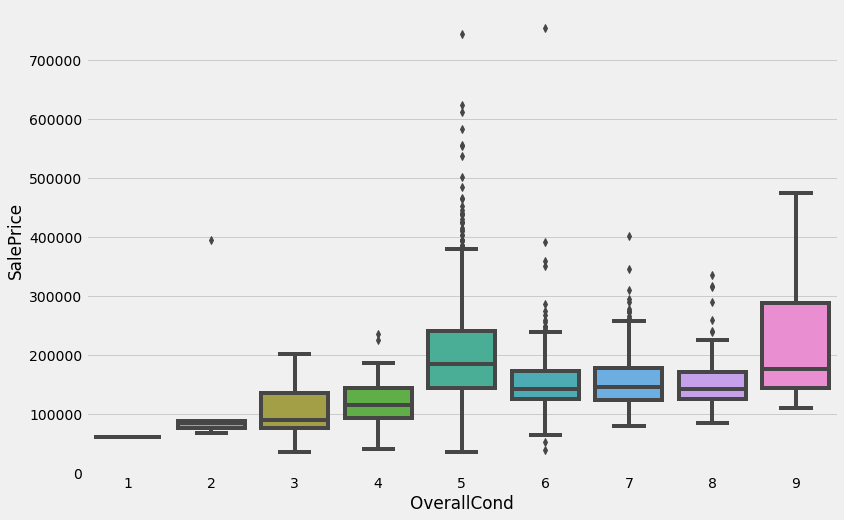

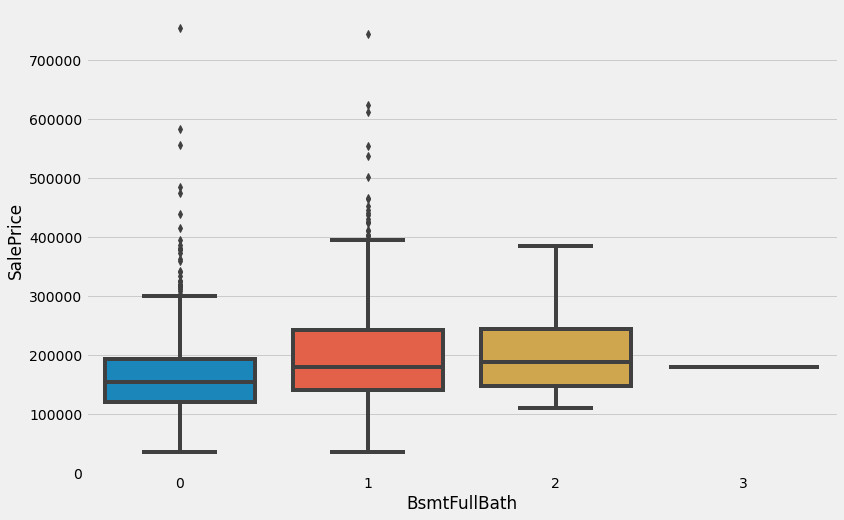

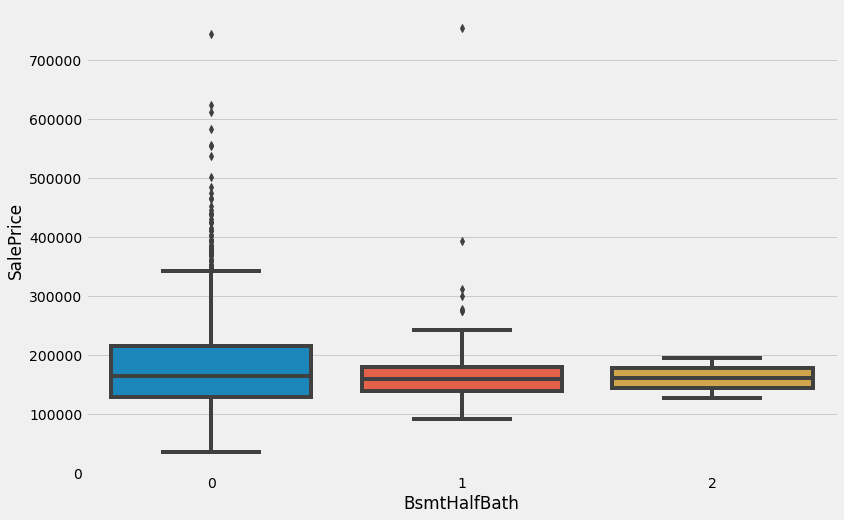

...

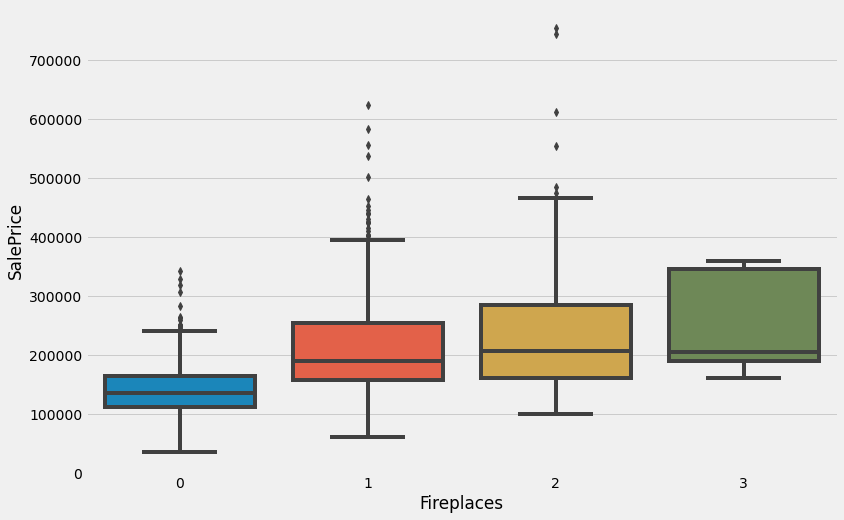

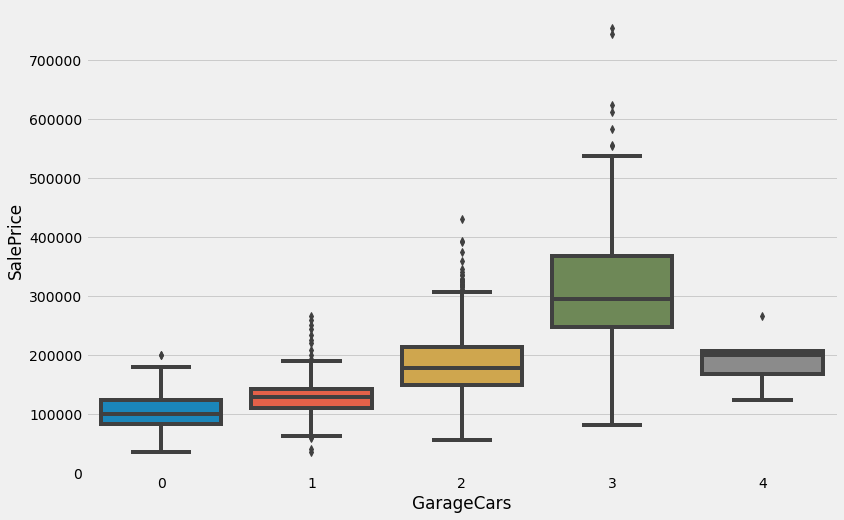

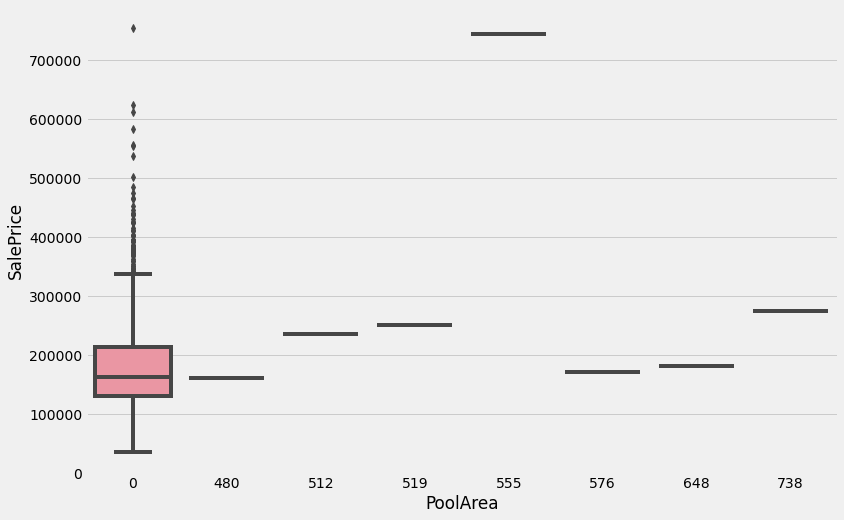

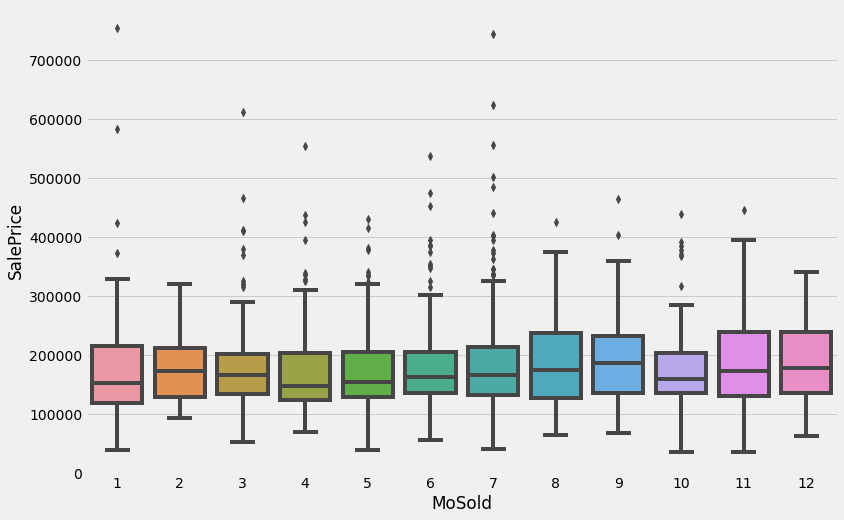

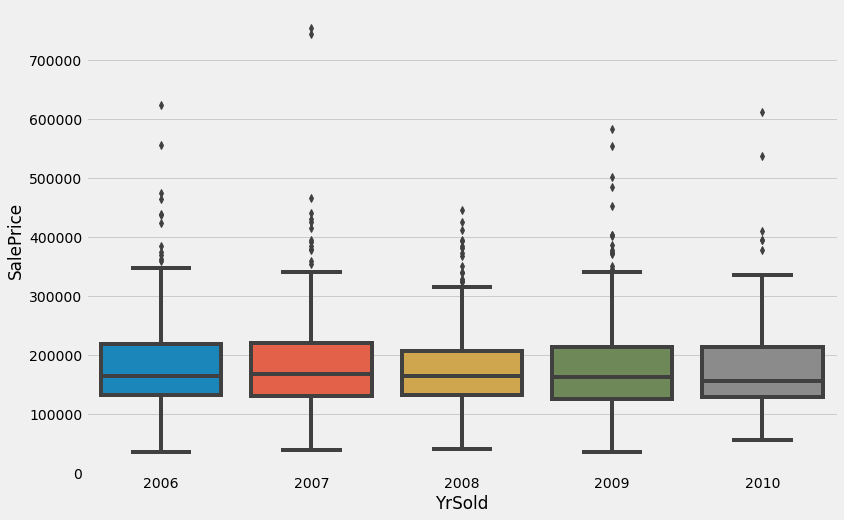

In [56]:
for var in discrete_vars:
    
    cutomboxplot(train,var )

### Relationship with categorical features using box plots

In [57]:
for var in cat_vars:
    
    print(var, train[var].value_counts(), (train[var].value_counts()/len(train)))

MSZoning RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64 RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
Street Pave    1454
Grvl       6
Name: Street, dtype: int64 Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
Alley Grvl    50
Pave    41
Name: Alley, dtype: int64 Grvl    0.034247
Pave    0.028082
Name: Alley, dtype: float64
LotShape Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64 Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
LandContour Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64 Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
Utilities AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64 AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
LotConf

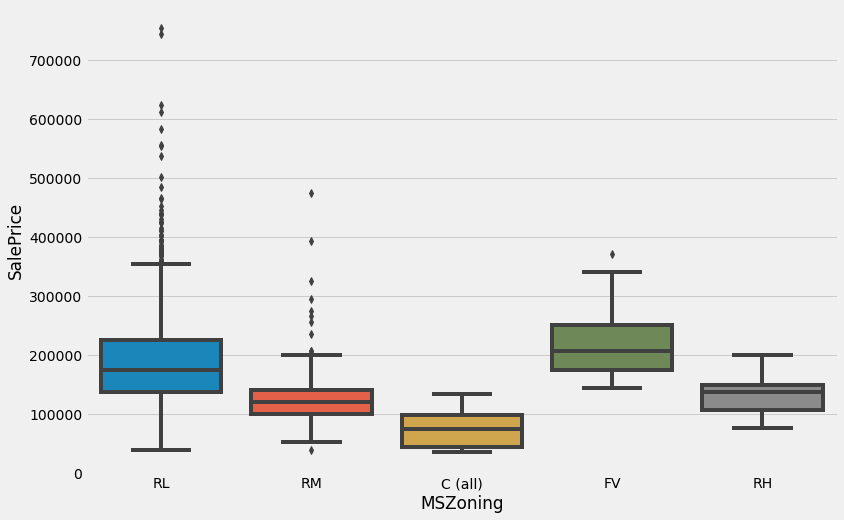

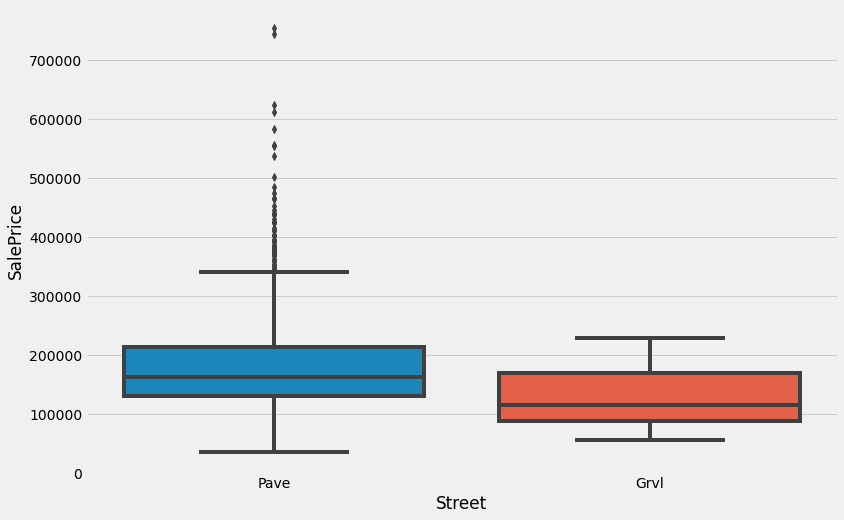

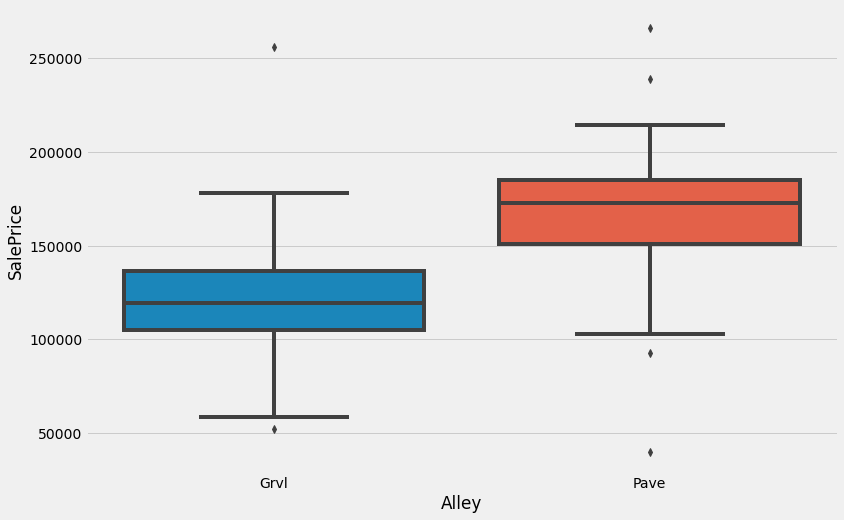

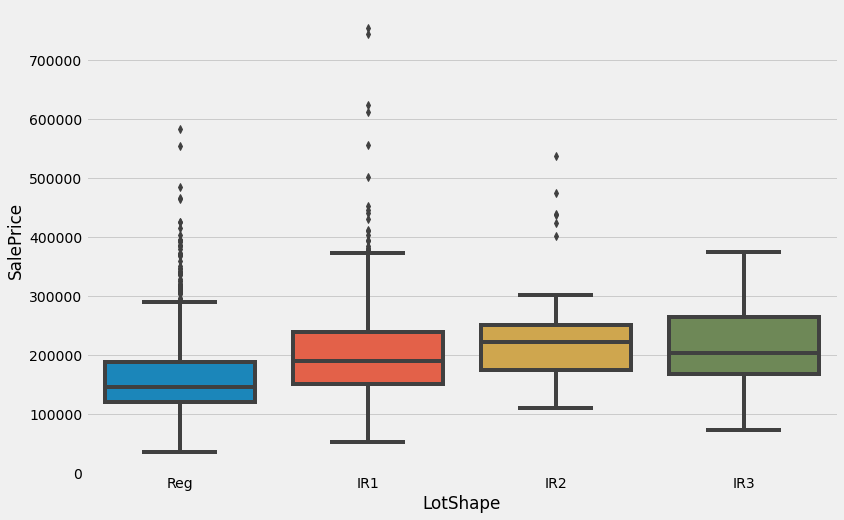

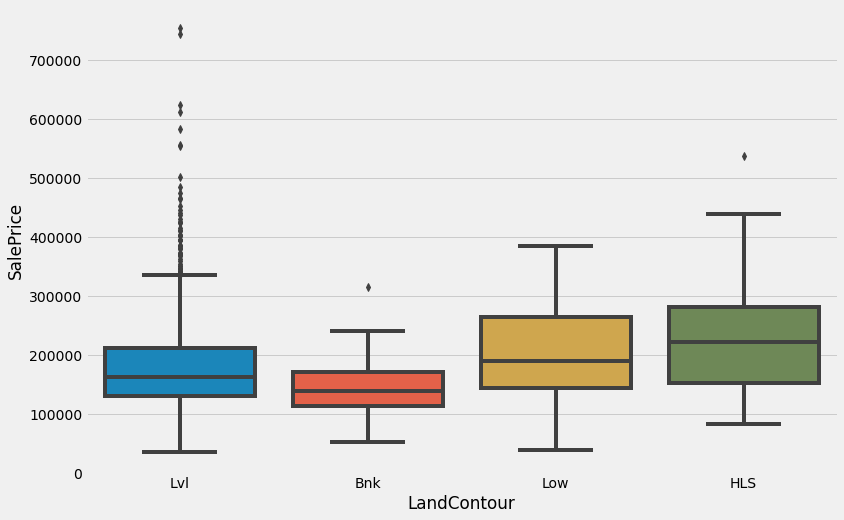

...

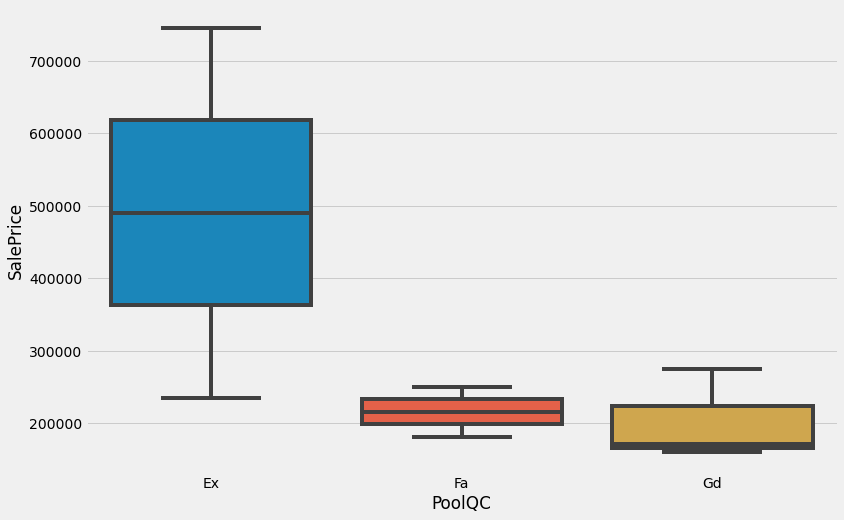

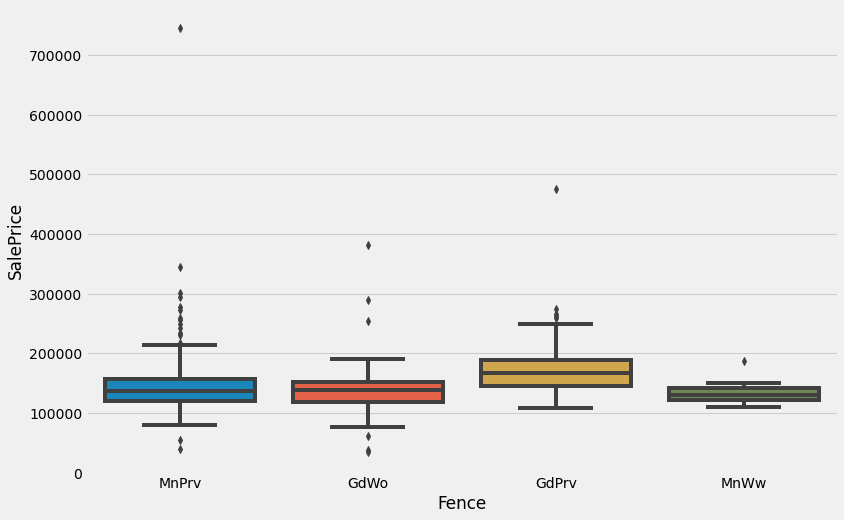

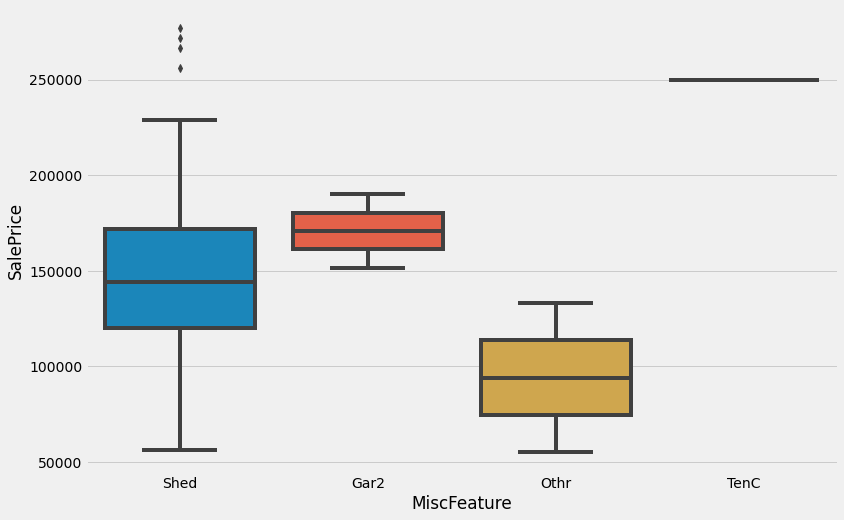

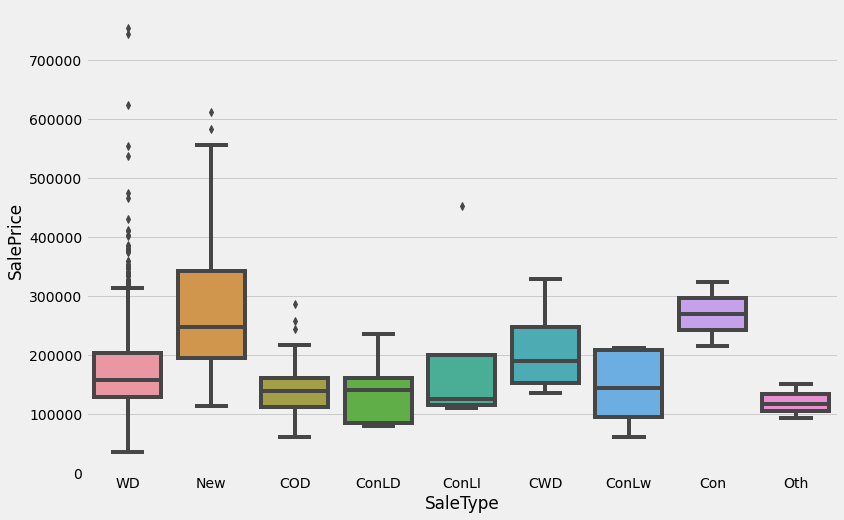

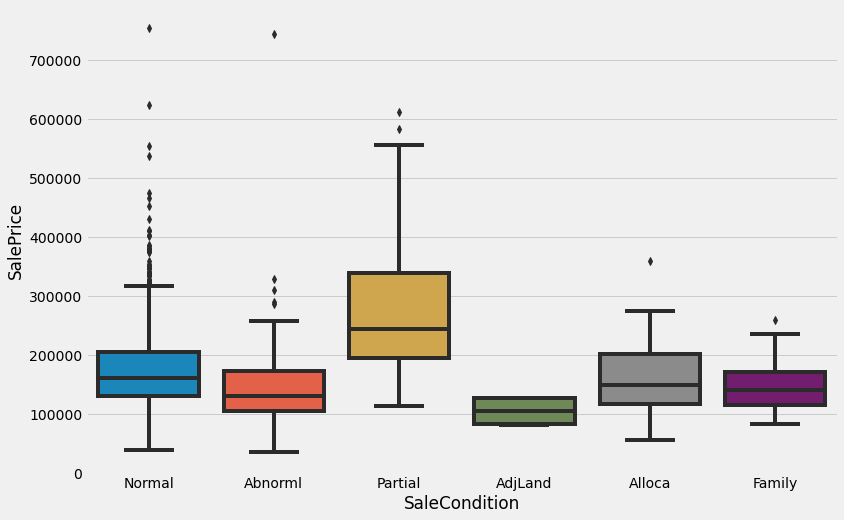

In [58]:
for var in cat_vars:
    cutomboxplot(train, var)

### The 'plasma soup'

'In the very beginning there was nothing except for a plasma soup. What is known of these brief moments in time, at the start of our study of cosmology, is largely conjectural. However, science has devised some sketch of what probably happened, based on what is known about the universe today.' (source: http://umich.edu/~gs265/bigbang.htm)

To explore the universe, we will start with some practical recipes to make sense of our 'plasma soup':

Correlation matrix (heatmap style).

'SalePrice' correlation matrix (zoomed heatmap style).

Scatter plots between the most correlated variables (move like Jagger style).

#### Correlation matrix (heatmap style)

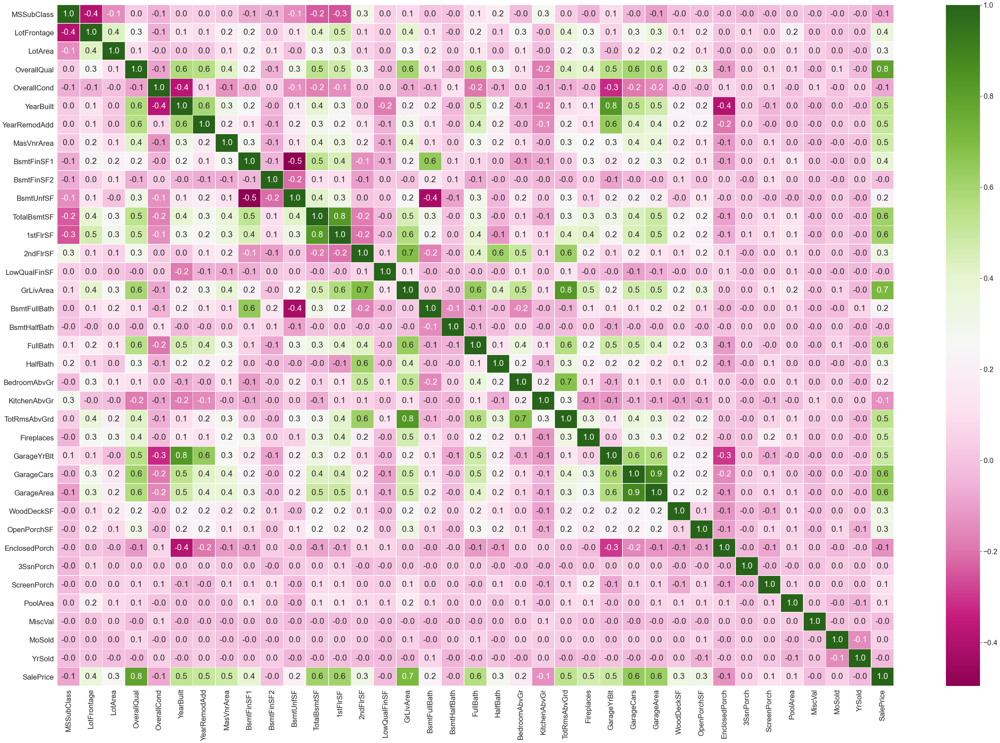

In [59]:
correlation_train=train.corr()
sns.set(font_scale=2)
plt.figure(figsize = (50,35))
ax = sns.heatmap(correlation_train, annot=True,annot_kws={"size": 25},fmt='.1f',cmap='PiYG', linewidths=.5)

#### SalePrice' correlation matrix (zoomed heatmap style)

In [60]:
correlation_train = train.corr()
corr_dict=correlation_train['SalePrice'].sort_values(ascending=False).to_dict()
important_columns=[]
for key,value in corr_dict.items():
    if ((value>0.1) & (value<0.8)) | (value<=-0.1):
        important_columns.append(key)
important_columns

['OverallQual',
 'GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'MasVnrArea',
 'Fireplaces',
 'BsmtFinSF1',
 'LotFrontage',
 'WoodDeckSF',
 '2ndFlrSF',
 'OpenPorchSF',
 'HalfBath',
 'LotArea',
 'BsmtFullBath',
 'BsmtUnfSF',
 'BedroomAbvGr',
 'ScreenPorch',
 'EnclosedPorch',
 'KitchenAbvGr']

In [61]:

important_columns1=[]
for key,value in corr_dict.items():
    if ((value>0.5) & (value<0.8)) | (value<=-0.5):
        important_columns1.append(key)
important_columns1

['OverallQual',
 'GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'YearBuilt',
 'YearRemodAdd']

#### According to our crystal ball, these are the variables most correlated with 'SalePrice'. My thoughts on this:

'OverallQual', 'GrLivArea' and 'TotalBsmtSF' are strongly correlated with 'SalePrice'. Check!
'GarageCars' and 'GarageArea' are also some of the most strongly correlated variables. However, the number of cars that fit into the garage is a consequence of the garage area. 'GarageCars' and 'GarageArea' are like twin brothers. You'll never be able to distinguish them. Therefore, we just need one of these variables in our analysis (we can keep 'GarageCars' since its correlation with 'SalePrice' is higher).
'TotalBsmtSF' and '1stFloor' also seem to be twin brothers. We can keep 'TotalBsmtSF' just to say that our first guess was right (re-read 'So... What can we expect?').
'FullBath'?? Really?
'TotRmsAbvGrd' and 'GrLivArea', twin brothers again. Is this dataset from Chernobyl?
Ah... 'YearBuilt'..and 'YearRemodAdd'. It seems that 'YearBuilt' is slightly correlated with 'SalePrice'. Honestly, it scares me to think about 'YearBuilt' because I start feeling that we should do a little bit of time-series analysis to get this right. I'll leave this as a homework for you.

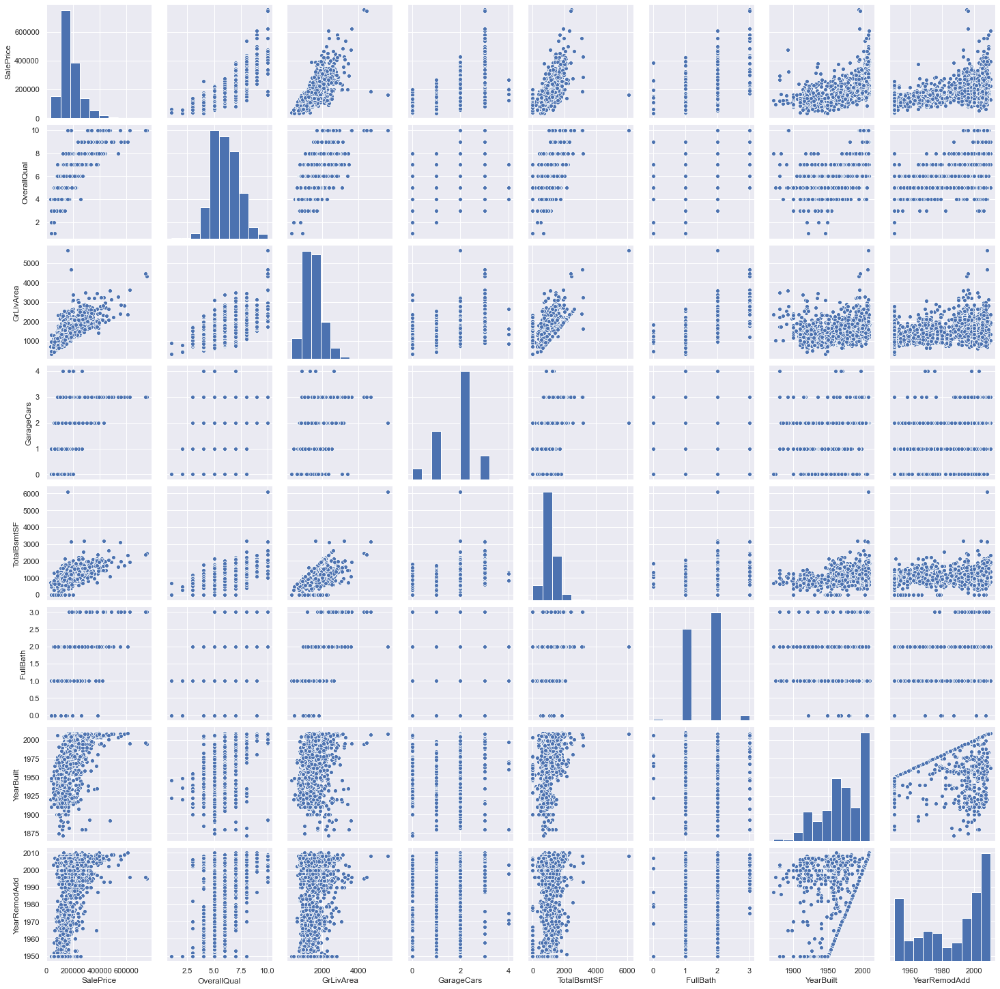

In [62]:
### Lets plot scatter plot for these columns (using pair plot)

#scatterplot
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt', 'YearRemodAdd']
sns.pairplot(train[cols], size = 2.5)
plt.show();

#### Although we already know some of the main figures, this mega scatter plot gives us a reasonable idea about variables relationships.

One of the figures we may find interesting is the one between 'TotalBsmtSF' and 'GrLiveArea'. In this figure we can see the dots drawing a linear line, which almost acts like a border. It totally makes sense that the majority of the dots stay below that line. Basement areas can be equal to the above ground living area, but it is not expected a basement area bigger than the above ground living area (unless you're trying to buy a bunker).

The plot concerning 'SalePrice' and 'YearBuilt' can also make us think. In the bottom of the 'dots cloud', we see what almost appears to be a shy exponential function (be creative). We can also see this same tendency in the upper limit of the 'dots cloud' (be even more creative). Also, notice how the set of dots regarding the last years tend to stay above this limit (I just wanted to say that prices are increasing faster now).



#### OverallQual is a categorical variable, and a scatter plot is not the best way to visualize categorical variables. However, there is an apparent relationship between the two features. The price of the houses increases with the overall quality. Let's check out some more features to determine the outliers. Let's focus on the numerical variables this time.

#### SalePrice vs GrLivArea

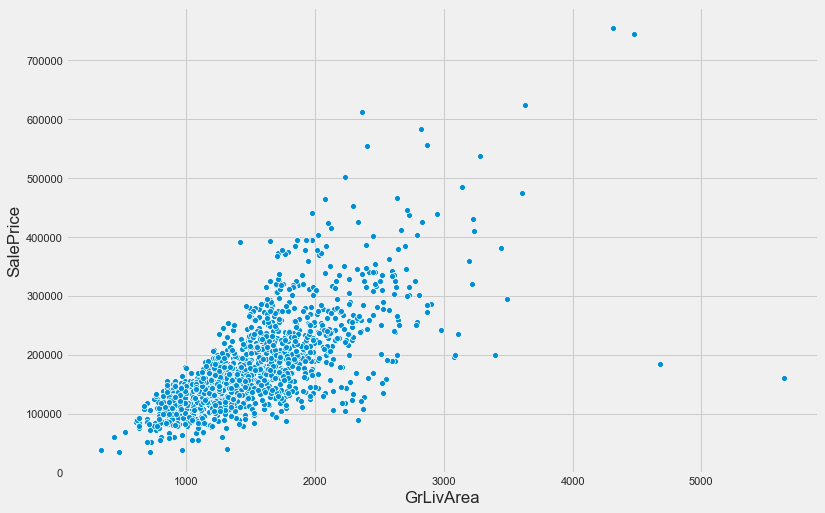

In [63]:
customized_scatterplot(train.SalePrice, train.GrLivArea)

#### As you can see, there are two outliers in the plot above. We will get rid off them later. Let's look at another scatter plot with a different feature.

#### SalePrice vs GarageArea

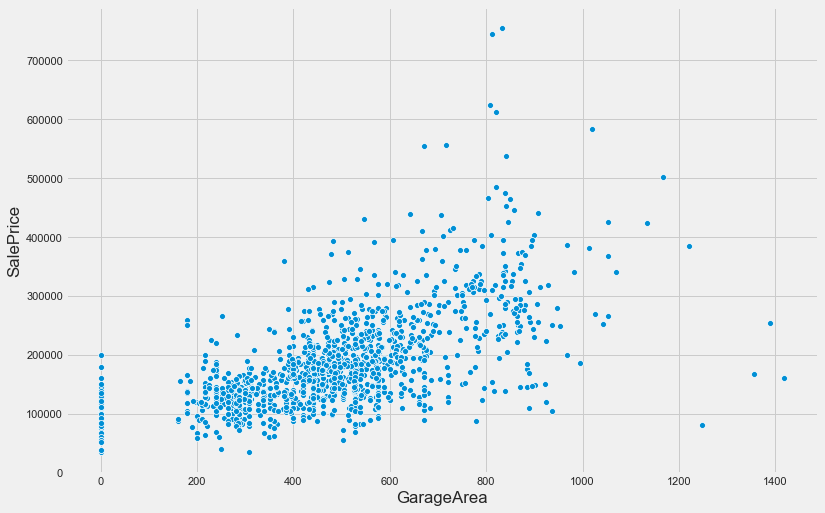

In [64]:
customized_scatterplot(train.SalePrice, train.GarageArea);

#### SalePrice vs TotalBsmtSF

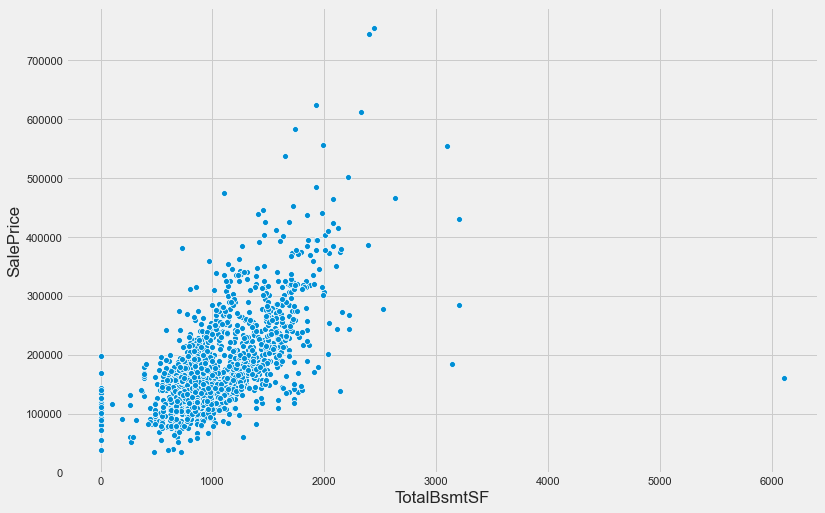

In [65]:
customized_scatterplot(train.SalePrice, train.TotalBsmtSF)

#### SalePrice vs 1stFlrSF

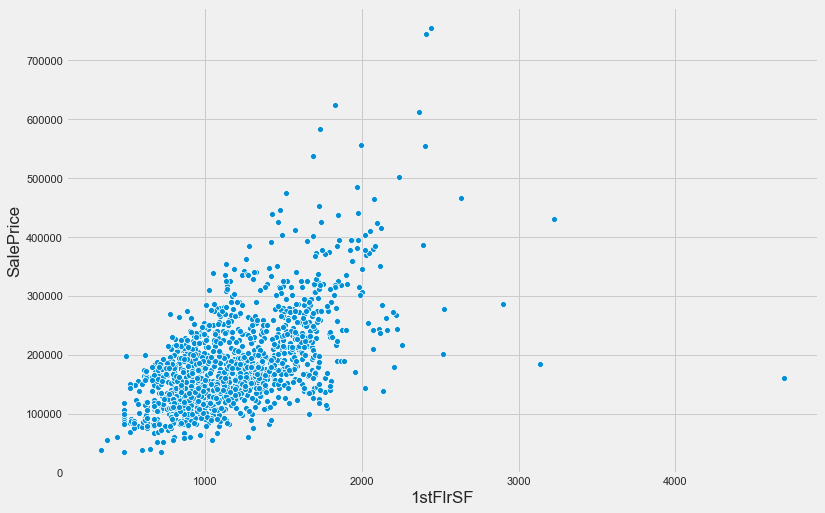

In [66]:
customized_scatterplot(train.SalePrice, train['1stFlrSF']);

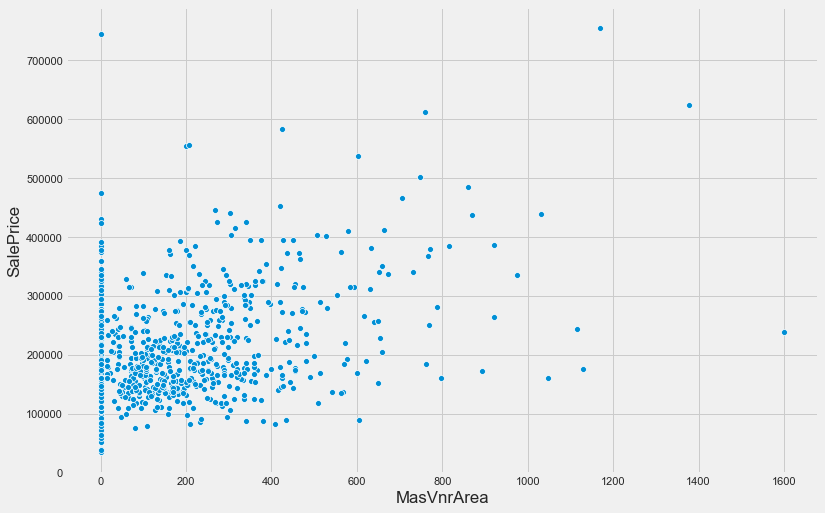

In [67]:
customized_scatterplot(train.SalePrice, train.MasVnrArea);

#### Observations
Our target variable shows an unequal level of variance across most predictor(independent) variables. This is called Heteroscedasticity(more explanation below) and is a red flag for the multiple linear regression model.
There are many outliers in the scatter plots above that took my attention.

The two on the top-right edge of SalePrice vs. GrLivArea seem to follow a trend, which can be explained by saying that "As the prices increased, so did the area.

However, The two on the bottom right of the same chart do not follow any trends. We will get rid of these two below.

### Before we move ahead, lets go through some theroretical fundamentals of linear progression
As we look through the scatter plots, I realized that it is time to explain the assumptions of Multiple Linear Regression. Before building a multiple linear regression model, we need to check that these assumptions below are valid.

#### Assumptions of Regression

Linearity ( Correct functional form )

Homoscedasticity ( Constant Error Variance )( vs Heteroscedasticity ).

Independence of Errors ( vs Autocorrelation )

Multivariate Normality ( Normality of Errors )

No or little Multicollinearity.

Since we fit a linear model, we assume that the relationship is linear, and the errors, or residuals, are pure random fluctuations around the true line. We expect that the variability in the response(dependent) variable doesn't increase as the value of the predictor(independent) increases, which is the assumptions of equal variance, also known as Homoscedasticity. We also assume that the observations are independent of one another(No Multicollinearity), and a correlation between sequential observations or auto-correlation is not there.
Now, these assumptions are prone to happen altogether. In other words, if we see one of these assumptions in the dataset, it's more likely that we may come across with others mentioned above. Therefore, we can find and fix various assumptions with a few unique techniques.
So, How do we check regression assumptions? We fit a regression line and look for the variability of the response data along the regression line. Let's apply this to each one of them.
Linearity(Correct functional form): Linear regression needs the relationship between each independent variable and the dependent variable to be linear. The linearity assumption can be tested with scatter plots. The following two examples depict two cases, where no or little linearity is present.

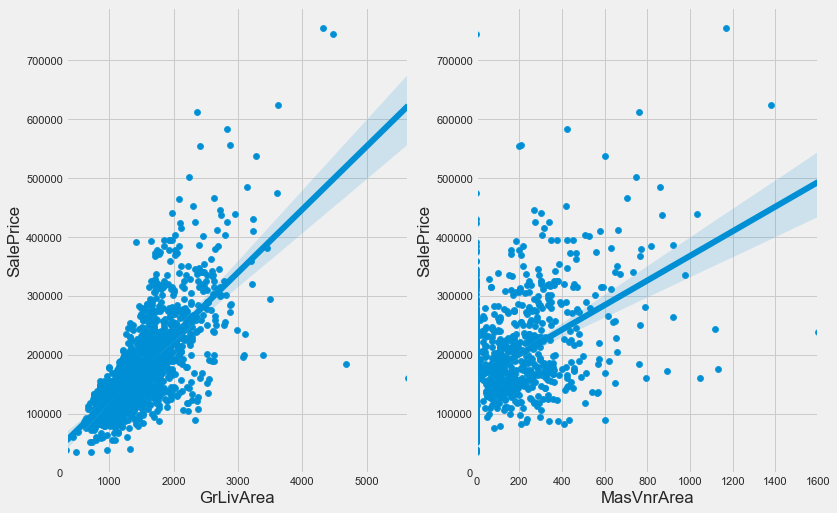

In [68]:
## Plot sizing. 
fig, (ax1, ax2) = plt.subplots(figsize = (12,8), ncols=2,sharey=False)

## Scatter plotting for SalePrice and GrLivArea. 
sns.scatterplot( x = train.GrLivArea, y = train.SalePrice,  ax=ax1)

## Putting a regression line. 
sns.regplot(x=train.GrLivArea, y=train.SalePrice, ax=ax1)

## Scatter plotting for SalePrice and MasVnrArea. 
sns.scatterplot(x = train.MasVnrArea,y = train.SalePrice, ax=ax2)

## regression line for MasVnrArea and SalePrice. 
sns.regplot(x=train.MasVnrArea, y=train.SalePrice, ax=ax2);

#### It's pretty apparent from the chart that there is a better linear relationship between SalePrice and GrLivArea than SalePrice and MasVnrArea. Sometimes we may be trying to fit a linear regression model when the data might not be so linear, or the function may need another degree of freedom to fit the data. In that case, we may need to change our function depending on the data to get the best possible fit. In addition to that, we can also check the residual plot, which tells us how is the error variance across the true line. Let's look at the residual plot for independent variable GrLivArea and our target variable SalePrice .

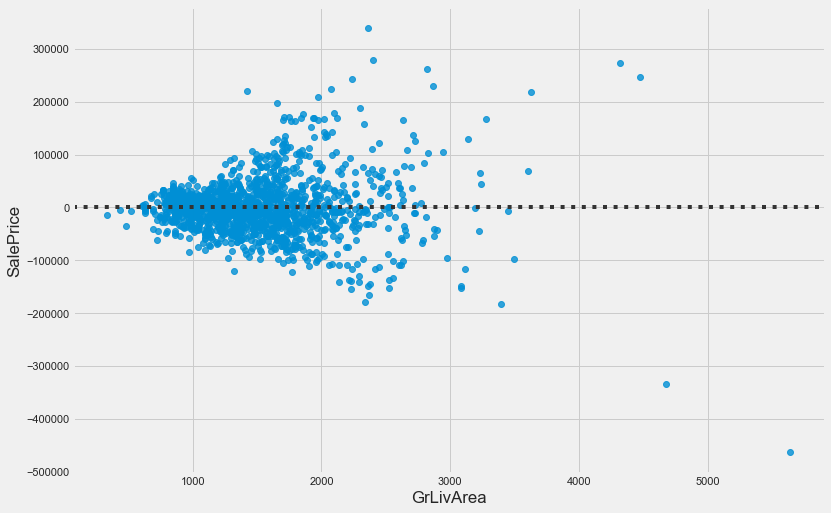

In [69]:
plt.subplots(figsize = (12,8))
sns.residplot(train.GrLivArea, train.SalePrice);

#### Ideally, if the assumptions are met, the residuals will be randomly scattered around the centerline of zero with no apparent pattern. The residual will look like an unstructured cloud of points centered around zero. However, our residual plot is anything but an unstructured cloud of points. Even though it seems like there is a linear relationship between the response variable and predictor variable, the residual plot looks more like a funnel. The error plot shows that as GrLivArea value increases, the variance also increases, which is the characteristics known as 
### 'Heteroscedasticity'. 
Let's break this down.

### Homoscedasticity ( Constant Variance ): The assumption of Homoscedasticity is crucial to linear regression models. Homoscedasticity describes a situation in which the error term or variance or the "noise" or random disturbance in the relationship between the independent variables and the dependent variable is the same across all values of the independent variable. In other words, there is a constant variance present in the response variable as the predictor variable increases. If the "noise" is not the same across the values of an independent variable like the residual plot above, we call that

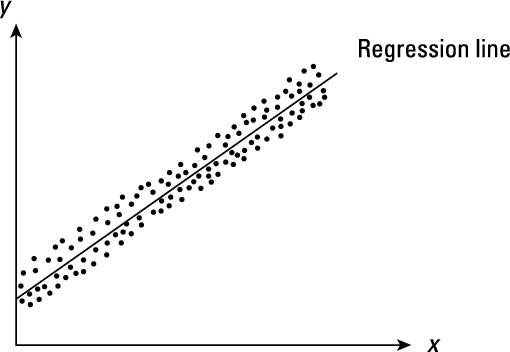

In [70]:
# Homoscedasticity example
Image("/Users/tuktuk/Downloads/415147.image1.jpg") # Image 4

### Heteroscedasticity. As you can tell, it is the opposite of Homoscedasticity.
### One way to fix this Heteroscedasticity is by using a transformation method like log-transformation or box-cox transformation. We will do that later.


## Multivariate Normality ( Normality of Errors): 
### The linear regression analysis requires the dependent variable to be multivariate normally distributed. A histogram, box plot, or a Q-Q-Plot can check if the target variable is normally distributed. The goodness of fit test, e.g., the Kolmogorov-Smirnov test can check for normality in the dependent variable. We already know that our target variable does not follow a normal distribution. Let's bring back the three charts to show our target variable.

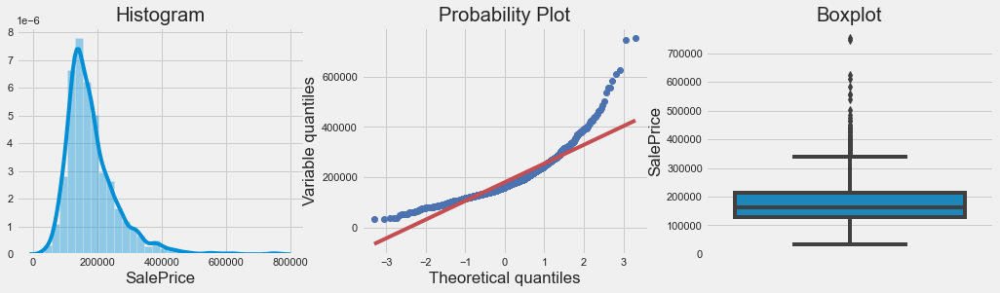

In [71]:
diagnostic_plots(train, 'SalePrice')

### we can see that 'SalePrice' does not follow a normal distribution and is right skewed.
### Normalisation can be done using log-transformation or box-cox transformation
Enough theory, lets move ahead with imputation (completing), creating and converting

### 3.23 Completing
#### For completing lets see missing values

In [72]:
missing_percentage(train_test[cont_vars])

,Total,Percent
LotFrontage,486,16.65
GarageYrBlt,159,5.45
MasVnrArea,23,0.79
TotalBsmtSF,1,0.03
GarageArea,1,0.03
BsmtFinSF1,1,0.03
BsmtFinSF2,1,0.03
BsmtUnfSF,1,0.03


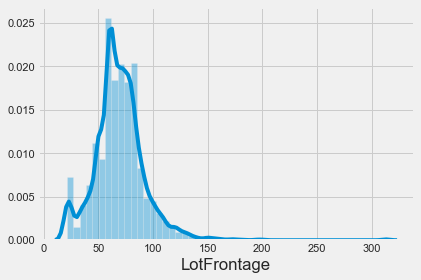

In [75]:
sns.distplot(train_test['LotFrontage']);

In [76]:
train['LotFrontage'].dtypes,test['LotFrontage'].dtypes,test['LotFrontage'].min(), test['LotFrontage'].max()

(dtype('float64'), dtype('float64'), 21.0, 200.0)

In [77]:
#LotFrontage- filling missing values with mean with groupby with Neighbourhood, and interpolating, and as type int 64
train_test['LotFrontage'] = train_test['LotFrontage'].fillna(train_test.groupby('Neighborhood')['LotFrontage'].transform('mean'))
train_test['LotFrontage'].interpolate(method='linear',inplace=True)
train_test['LotFrontage']=train_test['LotFrontage'].astype(int)

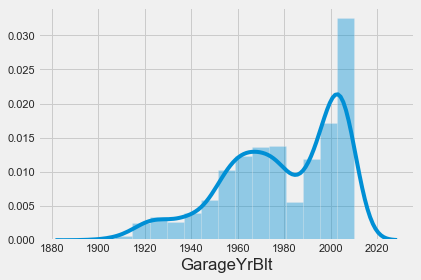

In [78]:
sns.distplot(train['GarageYrBlt'])

In [79]:
# GarageYrBlt, This column must be blank for no Garages, so we leave it blank and fill it with 0

train_test['GarageYrBlt'].fillna(0, inplace = True)

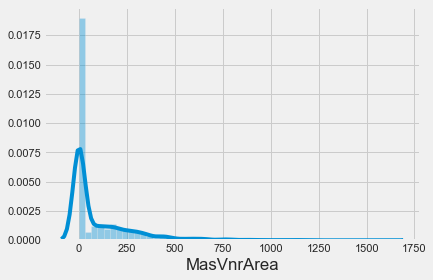

In [80]:
sns.distplot(train['MasVnrArea'])   

In [81]:
train['MasVnrArea'].dtypes,test['MasVnrArea'].dtypes,test['MasVnrArea'].min(), test['MasVnrArea'].max()

(dtype('float64'), dtype('float64'), 0.0, 1290.0)

#### As per data - MasVnrArea: Masonry veneer area in square feet. Masonry veneer walls consist of a single non-structural external layer of masonry, typically made of brick, stone or manufactured stone. Masonry veneer can have an air space behind it and is technically called "anchored veneer". A masonry veneer attached directly to the backing is called "adhered veneer".

In [82]:
#  Lets fill it with mean value as per MasVnrType and as int64
train_test['MasVnrArea'] = train_test['MasVnrArea'].fillna(train_test.groupby('MasVnrType')['MasVnrArea'].transform('mean'))
train_test['MasVnrArea'].interpolate(method='linear',inplace=True)
train_test['MasVnrArea']=train_test['MasVnrArea'].astype(int)

#### Following are more missing values in data, lets see them one by one
GarageArea	1	0.07 (GarageArea: Size of garage in square feet)

'TotalBsmtSF' -   Total square feet of basement area

BsmtFinSF1	1	0.07 (BsmtFinSF1: Type 1 finished square feet)

BsmtFinSF2	1	0.07  (BsmtFinSF2: Type 2 finished square feet)

BsmtUnfSF	1	0.07  (BsmtUnfSF: Unfinished square feet of basement area)

In [83]:
# This means that missing values point to houses without basement and garages, lets fill them with 0
cols = ['GarageArea','TotalBsmtSF','BsmtFinSF1', 'BsmtFinSF2','BsmtUnfSF' ]
for col in cols:
    train_test[col].fillna(0,inplace = True)

### Filling missing values in discrete numerical variables

In [84]:
discrete_vars

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'PoolArea',
 'MoSold',
 'YrSold']

In [85]:
missing_percentage(train_test[discrete_vars])

,Total,Percent
BsmtHalfBath,2,0.07
BsmtFullBath,2,0.07
GarageCars,1,0.03


In [86]:
# Seeing the properties of these variables, we can conclude that they can be fill with 0

cols = [ 'BsmtHalfBath','BsmtFullBath', 'GarageCars']
for col in cols:
    train_test[col].fillna(0, inplace = True)

### Filling missing values of categorical data

In [87]:
missing_percentage(train_test[cat_vars])

,Total,Percent
PoolQC,2909,99.66
MiscFeature,2814,96.40
Alley,2721,93.22
Fence,2348,80.44
FireplaceQu,1420,48.65
GarageCond,159,5.45
GarageQual,159,5.45
GarageFinish,159,5.45
GarageType,157,5.38
BsmtCond,82,2.81


#### Lets see them one by one
PoolQC - : Pool quality (NaN means pool not available)

MiscFeature - Miscellaneous feature not covered in other categories (NaN means 0) 

Alley - Type of alley access (NaN means no Alley Access)

Fence - Fence quality ( NaN means Fence not available)

FireplaceQ - Fireplace quality (NaN means Fireplace not available)

GarageCond ,  GarageQual, GarageFinish & GarageType have  81 missing values in train data, and 78 in test data(Garage Type 76), these four varaible NaN values mean Garage absent

Similarly BsmtCond ,BsmtQual, BsmtExposure , BsmtFinType2  , BsmtFinType1 NaN values mean basement absent

MasVnrType- Masonry veneer type (NaN means Masonry veneer absent)

Electrical - Electrical system ( It cannot be missing, has to be there, lets fill it with most frequent)

MSZoning - The general zoning classification ( cannot be missing , lets fill it with most frequent groupby neighbourhood)

Utilities -         Type of utilities available (NaN means no utility)
 
Functional   -    Home functionality rating (NaN means not available)
 
KitchenQual    -    Kitchen quality (NaN means , not available, can be filled with most frequent as per neighbourhood)
 
SaleType        -   Type of sale (NaN means not available, can be filled with most frequent as per neighbourhood)
 
Exterior2nd     -   Exterior covering on house (if more than one material) (NaN means not available)
 
Exterior1st      - Exterior covering on house (NaN means not available)

In [88]:
# Lets fill them as per above insight
cols = ['PoolQC', 'MiscFeature','Alley' ,'Fence', 'GarageCond' , 'GarageQual', 
        'GarageFinish','GarageType','BsmtCond' ,'BsmtQual', 'BsmtExposure' , 'BsmtFinType2' , 
        'BsmtFinType1','MasVnrType', 'FireplaceQu']

for col in cols:
    train_test[col].fillna('None', inplace = True)

In [89]:
cols = ['Electrical', 'KitchenQual', 'Utilities', 'MSZoning', 'Functional', 'SaleType', 'Exterior1st',
       'Exterior2nd']
for col in cols :
    
    train_test[col].fillna(train_test[col].mode()[0], inplace = True) 
    

In [90]:
train_test.isna().sum()

MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley               0
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          0
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          0
BsmtFinType2        0
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea 

### Now there are no missing values in the data

### 3.24 Next step - Creating

#### Lets see, what new features we can create from exisitng features.
##### we can make a new column for total size of the house.
##### We can make a new column adding Year Built and Year Remodification.
##### Total bathrooms
##### Total porch

In [91]:
train_test.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

#### We can make following new columns
year Built + Year remodified

Total square feet by adding basement, first floor and seconf floor

Total number of bath

Total porch area by adding open porch, 3Ssnporch, enclosedporch, screenporch and wood deck

House age 1 =( year sold - yesr built)

House Age2 = (year sold = Year modified)


In [94]:
train_test['YrBltRmd']=train_test['YearBuilt']+train_test['YearRemodAdd']
train_test['Total_Square_Feet'] = (train_test['BsmtFinSF1'] + train_test['BsmtFinSF2'] + train_test['1stFlrSF'] + train_test['2ndFlrSF'] + train_test['TotalBsmtSF'])
train_test['Total_Bath'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) + train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))
train_test['Total_Porch_Area'] = (train_test['OpenPorchSF'] + train_test['3SsnPorch'] + train_test['EnclosedPorch'] + train_test['ScreenPorch'] + train_test['WoodDeckSF'])

In [95]:
train_test['House_Age1']=train_test['YrSold']-train_test['YearBuilt']+1
train_test['House_Age2']=train_test['YrSold']-train_test['YearRemodAdd']+2

#### We can make new columns for having pool, first floor, second floor, garage, basement , fireplace and old house

In [96]:
train_test['exists_pool'] = train_test['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
train_test['exists_IstFl'] = train_test['1stFlrSF'].apply(lambda x: 1 if x > 0 else 0)
train_test['exists_2ndFl'] = train_test['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
train_test['exists_garage'] = train_test['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
train_test['exists_fireplace'] = train_test['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
train_test['exists_bsmt'] = train_test['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
train_test['old_house'] = train_test['YearBuilt'].apply(lambda x: 1 if x <1990 else 0)

### 3.25 Next step , Converting


In [97]:
(train.dtypes).value_counts(), (test.dtypes).value_counts(), (train_test.dtypes).value_counts()

(object     43
 int64      34
 float64     3
 dtype: int64,
 object     43
 int64      25
 float64    11
 dtype: int64,
 object     43
 int64      38
 float64    12
 dtype: int64)

In [98]:
#### We can see that out of total 47 numerical variables train has 34 int64 & 3 float64 types, whereas
#### test has 25 int64 and 11 float64
# Lets correct this first
for i in train_test.columns:
    if 'SalePrice' not in i:
        if 'object' in str(train_test[str(i)].dtype):
            train_test[str(i)]=train_test[str(i)].fillna(method='ffill')

In [99]:
(train_test.dtypes).value_counts()

object     43
int64      38
float64    12
dtype: int64

#### Now lets convert object types using label encoding

In [100]:
### Categorical variables

cat_vars = [var for var in train_test.columns if train_test[var].dtypes=='O']
print('Number of categorical variables: ', cat_vars, len(cat_vars))

Number of categorical variables:  ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'] 43


In [101]:
from sklearn.preprocessing import  LabelEncoder

# Encoding using LabelEncoder
for col in cat_vars:
    lbl_enc = LabelEncoder() 
    lbl_enc.fit(list(train_test[col].values)) 
    train_test[col] = lbl_enc.transform(list(train_test[col].values))
    

In [102]:
(train_test.dtypes).value_counts()

int64      81
float64    12
dtype: int64

### Coming back,    Finding skewdness and corrcting it

In [104]:
numeric_features = train_test.dtypes[train_test.dtypes != "object"].index
skewed_features = train_test[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
print(skewed_features)

Utilities            54.000003
MiscVal              21.947195
PoolArea             16.898328
exists_pool          14.884318
LotArea              12.822431
LowQualFinSF         12.088761
Heating              12.078788
Condition2           12.060093
3SsnPorch            11.376065
RoofMatl              8.707767
MiscFeature           5.064321
LandSlope             4.975157
KitchenAbvGr          4.302254
BsmtFinSF2            4.146143
EnclosedPorch         4.003891
ScreenPorch           3.946694
BsmtHalfBath          3.931594
Condition1            2.983114
MasVnrArea            2.600375
OpenPorchSF           2.535114
BldgType              2.192261
Total_Square_Feet     1.972651
WoodDeckSF            1.842433
RoofStyle             1.553307
1stFlrSF              1.469604
LotFrontage           1.468441
BsmtFinSF1            1.425230
Total_Porch_Area      1.376649
MSSubClass            1.375457
GrLivArea             1.269358
TotalBsmtSF           1.156894
BsmtUnfSF             0.919339
2ndFlrSF

In [105]:
high_skewness = skewed_features[abs(skewed_features) > 0.9]
skewed_features = high_skewness.index

In [106]:
print(high_skewness)
print('\nVariables with high skewness: \n\n',skewed_features)

Utilities            54.000003
MiscVal              21.947195
PoolArea             16.898328
exists_pool          14.884318
LotArea              12.822431
LowQualFinSF         12.088761
Heating              12.078788
Condition2           12.060093
3SsnPorch            11.376065
RoofMatl              8.707767
MiscFeature           5.064321
LandSlope             4.975157
KitchenAbvGr          4.302254
BsmtFinSF2            4.146143
EnclosedPorch         4.003891
ScreenPorch           3.946694
BsmtHalfBath          3.931594
Condition1            2.983114
MasVnrArea            2.600375
OpenPorchSF           2.535114
BldgType              2.192261
Total_Square_Feet     1.972651
WoodDeckSF            1.842433
RoofStyle             1.553307
1stFlrSF              1.469604
LotFrontage           1.468441
BsmtFinSF1            1.425230
Total_Porch_Area      1.376649
MSSubClass            1.375457
GrLivArea             1.269358
TotalBsmtSF           1.156894
BsmtUnfSF             0.919339
BsmtExpo

In [107]:
train_test[skewed_features].head()

,Utilities,MiscVal,PoolArea,exists_pool,LotArea,LowQualFinSF,Heating,Condition2,3SsnPorch,RoofMatl,MiscFeature,LandSlope,KitchenAbvGr,BsmtFinSF2,EnclosedPorch,ScreenPorch,BsmtHalfBath,Condition1,MasVnrArea,OpenPorchSF,BldgType,Total_Square_Feet,WoodDeckSF,RoofStyle,1stFlrSF,LotFrontage,BsmtFinSF1,Total_Porch_Area,MSSubClass,GrLivArea,TotalBsmtSF,BsmtUnfSF,BsmtExposure,LotConfig,KitchenQual,MSZoning,ExterQual,Fence,ExterCond,SaleCondition,BsmtCond,PavedDrive,BsmtFinType2,GarageQual,Electrical,LandContour,CentralAir,GarageCond,SaleType,GarageYrBlt,exists_garage,Functional,exists_bsmt,Street,PoolQC
0,0,0,0,0,8450,0,1,2,0,1,1,0,1,0.0,0,0,0.0,2,196,61,0,3272.0,0,1,856,65,706.0,61,60,1710,856.0,150.0,3,4,2,3,2,4,4,4,4,2,6,5,4,3,1,5,8,2003.0,1,6,1,1,3
1,0,0,0,0,9600,0,1,2,0,1,1,0,1,0.0,0,0,1.0,1,0,0,0,3502.0,298,1,1262,80,978.0,298,20,1262,1262.0,284.0,1,2,3,3,3,4,4,4,4,2,6,5,4,3,1,5,8,1976.0,1,6,1,1,3
2,0,0,0,0,11250,0,1,2,0,1,1,0,1,0.0,0,0,0.0,2,162,42,0,3192.0,0,1,920,68,486.0,42,60,1786,920.0,434.0,2,4,2,3,2,4,4,4,4,2,6,5,4,3,1,5,8,2001.0,1,6,1,1,3
3,0,0,0,0,9550,0,1,2,0,1,1,0,1,0.0,272,0,0.0,2,0,35,0,2689.0,0,1,961,60,216.0,307,70,1717,756.0,540.0,3,0,2,3,3,4,4,0,1,2,6,5,4,3,1,5,8,1998.0,1,6,1,1,3
4,0,0,0,0,14260,0,1,2,0,1,1,0,1,0.0,0,0,0.0,2,350,84,0,3998.0,192,1,1145,84,655.0,276,60,2198,1145.0,490.0,0,2,2,3,2,4,4,4,4,2,6,5,4,3,1,5,8,2000.0,1,6,1,1,3


#### using boxcox transformation

In [109]:
for feature in skewed_features:
    train_test[feature] = boxcox1p(train_test[feature], boxcox_normmax(train_test[feature] + 1))

In [110]:
train_test[skewed_features].head()

,Utilities,MiscVal,PoolArea,exists_pool,LotArea,LowQualFinSF,Heating,Condition2,3SsnPorch,RoofMatl,MiscFeature,LandSlope,KitchenAbvGr,BsmtFinSF2,EnclosedPorch,ScreenPorch,BsmtHalfBath,Condition1,MasVnrArea,OpenPorchSF,BldgType,Total_Square_Feet,WoodDeckSF,RoofStyle,1stFlrSF,LotFrontage,BsmtFinSF1,Total_Porch_Area,MSSubClass,GrLivArea,TotalBsmtSF,BsmtUnfSF,BsmtExposure,LotConfig,KitchenQual,MSZoning,ExterQual,Fence,ExterCond,SaleCondition,BsmtCond,PavedDrive,BsmtFinType2,GarageQual,Electrical,LandContour,CentralAir,GarageCond,SaleType,GarageYrBlt,exists_garage,Functional,exists_bsmt,Street,PoolQC
0,0.0,0.0,0.0,0.0,13.424521,0.0,0.520289,1.255038,0.0,0.516626,0.599329,0.0,0.75096,0.0,0.000000,0.0,0.00000,1.242948,19.509965,12.009559,0.0,21.773910,0.000000,0.603899,5.318379,14.991428,117.855863,18.721470,6.502440,7.234116,296.832332,30.016554,15.085192,3.816988,5.077704,12.038913,5.498765,6.897404,5.100237,95.385755,7.750873,10.465805,2476.08448,45.177318,6.260105,16.304702,10.49998,65.027911,3738.9334,8.440377e+56,0.712447,30.831045,40.547606,11.459793,3975.446954
1,0.0,0.0,0.0,0.0,13.694528,0.0,0.520289,1.255038,0.0,0.516626,0.599329,0.0,0.75096,0.0,0.000000,0.0,0.71081,0.748863,0.000000,0.000000,0.0,22.161556,56.339211,0.603899,5.550627,16.886058,146.805798,51.575372,4.250991,6.947212,407.302419,44.178887,2.025826,1.940853,10.302990,12.038913,11.456357,6.897404,5.100237,95.385755,7.750873,10.465805,2476.08448,45.177318,6.260105,16.304702,10.49998,65.027911,3738.9334,6.646213e+56,0.712447,30.831045,40.547606,11.459793,3975.446954
2,0.0,0.0,0.0,0.0,14.034134,0.0,0.520289,1.255038,0.0,0.516626,0.599329,0.0,0.75096,0.0,0.000000,0.0,0.00000,1.242948,17.835995,9.849185,0.0,21.634056,0.000000,0.603899,5.362015,15.385756,91.575284,14.644414,6.502440,7.275132,314.805061,56.957794,6.760372,3.816988,5.077704,12.038913,5.498765,6.897404,5.100237,95.385755,7.750873,10.465805,2476.08448,45.177318,6.260105,16.304702,10.49998,65.027911,3738.9334,8.293197e+56,0.712447,30.831045,40.547606,11.459793,3975.446954
3,0.0,0.0,0.0,0.0,13.683422,0.0,0.520289,1.255038,0.0,0.516626,0.599329,0.0,0.75096,0.0,16.012022,0.0,0.00000,1.242948,0.000000,8.921747,0.0,20.685366,0.000000,0.603899,5.388291,14.314502,52.776367,52.547851,6.865584,7.237970,268.234291,64.881734,15.085192,0.000000,5.077704,12.038913,11.456357,6.897404,5.100237,0.000000,1.279875,10.465805,2476.08448,45.177318,6.260105,16.304702,10.49998,65.027911,3738.9334,8.076958e+56,0.712447,30.831045,40.547606,11.459793,3975.446954
4,0.0,0.0,0.0,0.0,14.550143,0.0,0.520289,1.255038,0.0,0.516626,0.599329,0.0,0.75096,0.0,0.000000,0.0,0.00000,1.242948,25.518155,14.180239,0.0,22.933857,42.351294,0.603899,5.493031,17.361996,112.040325,49.148918,6.502440,7.470741,376.259367,61.233857,0.000000,1.940853,5.077704,12.038913,5.498765,6.897404,5.100237,95.385755,7.750873,10.465805,2476.08448,45.177318,6.260105,16.304702,10.49998,65.027911,3738.9334,8.220518e+56,0.712447,30.831045,40.547606,11.459793,3975.446954


In [111]:
train_test=pd.get_dummies(train_test,dtype='int8')

In [112]:
train_test.isnull().sum(),(train_test.dtypes).value_counts()

(MSSubClass              0
 MSZoning                0
 LotFrontage             0
 LotArea                 0
 Street                  0
 Alley                   0
 LotShape                0
 LandContour             0
 Utilities               0
 LotConfig               0
 LandSlope               0
 Neighborhood            0
 Condition1              0
 Condition2              0
 BldgType                0
 HouseStyle              0
 OverallQual             0
 OverallCond             0
 YearBuilt               0
 YearRemodAdd            0
 RoofStyle               0
 RoofMatl                0
 Exterior1st             0
 Exterior2nd             0
 MasVnrType              0
 MasVnrArea              0
 ExterQual               0
 ExterCond               0
 Foundation              0
 BsmtQual                0
 BsmtCond                0
 BsmtExposure            0
 BsmtFinType1            0
 BsmtFinSF1              0
 BsmtFinType2            0
 BsmtFinSF2              0
 BsmtUnfSF               0
 

### Splitting back to train and test

In [113]:
train=train_test[0:1460]
test=train_test[1460:2919]

In [115]:
# using interpolate for equal space (linear)
train.interpolate(method='linear',inplace=True)
test.interpolate(method='linear',inplace=True)

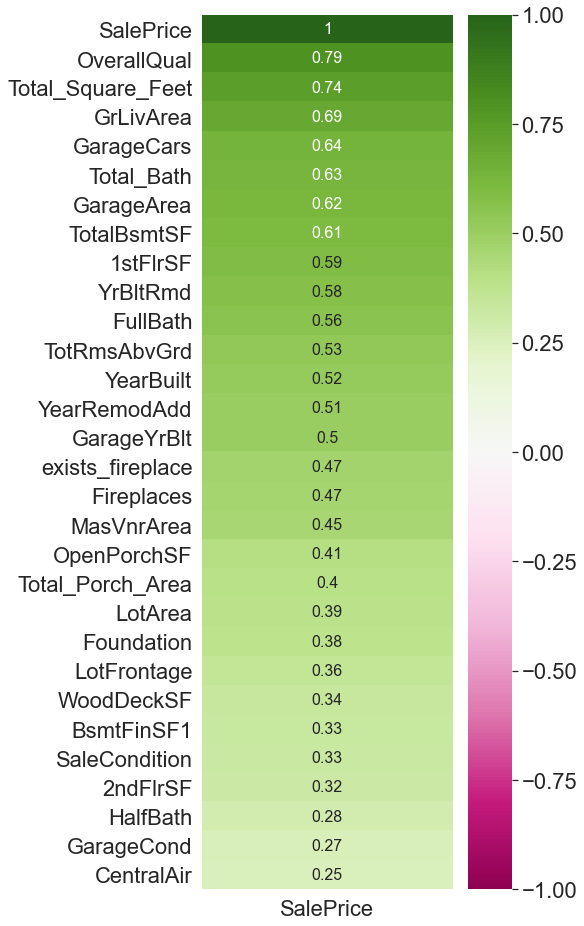

In [117]:
# Finding 30 variables with correlation with SalePrice in descending order
corr_new_train=train.corr()
plt.figure(figsize=(5,15))
sns.heatmap(corr_new_train[['SalePrice']].sort_values(by=['SalePrice'],ascending=False).head(30),annot_kws={"size": 16},vmin=-1, cmap='PiYG', annot=True)
sns.set(font_scale=2)

In [118]:
corr_dict2=corr_new_train['SalePrice'].sort_values(ascending=False).to_dict()
corr_dict2

{'SalePrice': 1.0,
 'OverallQual': 0.7909816005838047,
 'Total_Square_Feet': 0.7411792606604959,
 'GrLivArea': 0.6948427966776257,
 'GarageCars': 0.640409197258349,
 'Total_Bath': 0.6317310679319897,
 'GarageArea': 0.6234314389183598,
 'TotalBsmtSF': 0.607664314018927,
 '1stFlrSF': 0.5885261486489618,
 'YrBltRmd': 0.5761444313502854,
 'FullBath': 0.5606637627484452,
 'TotRmsAbvGrd': 0.5337231555820238,
 'YearBuilt': 0.5228973328794967,
 'YearRemodAdd': 0.5071009671113867,
 'GarageYrBlt': 0.501236469130411,
 'exists_fireplace': 0.4719080685164922,
 'Fireplaces': 0.4669288367515242,
 'MasVnrArea': 0.45493079487718546,
 'OpenPorchSF': 0.4065358661367877,
 'Total_Porch_Area': 0.39516894228388827,
 'LotArea': 0.3906209686440101,
 'Foundation': 0.38247899119010337,
 'LotFrontage': 0.3551574982658317,
 'WoodDeckSF': 0.3376558482078433,
 'BsmtFinSF1': 0.3349735372481382,
 'SaleCondition': 0.3260956409621053,
 '2ndFlrSF': 0.31933380283206614,
 'HalfBath': 0.2841076755947784,
 'GarageCond': 0.26

In [119]:
# Finding best variables as per correlation
best_columns=[]
for key,value in corr_dict2.items():
    if ((value>=0.30) & (value<0.9)) | (value<=-0.30):
        best_columns.append(key)
best_columns

['OverallQual',
 'Total_Square_Feet',
 'GrLivArea',
 'GarageCars',
 'Total_Bath',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'YrBltRmd',
 'FullBath',
 'TotRmsAbvGrd',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'exists_fireplace',
 'Fireplaces',
 'MasVnrArea',
 'OpenPorchSF',
 'Total_Porch_Area',
 'LotArea',
 'Foundation',
 'LotFrontage',
 'WoodDeckSF',
 'BsmtFinSF1',
 'SaleCondition',
 '2ndFlrSF',
 'BsmtExposure',
 'HeatingQC',
 'GarageType',
 'GarageFinish',
 'House_Age2',
 'House_Age1',
 'old_house',
 'KitchenQual',
 'BsmtQual',
 'ExterQual']

In [120]:
print(len(best_columns))

36


In [121]:
# As SalePrice is right skewed, make a new column taking its logarithmic trnasformation
train['SalePrice_Log1p'] = np.log1p(train.SalePrice)

In [122]:
print(min(train['SalePrice_Log1p']))
print(max(train['SalePrice_Log1p']))

10.460270761075149
13.534474352733596


Skew Dist: 1.8828757597682129
Kurtosis Dist: 6.536281860064529


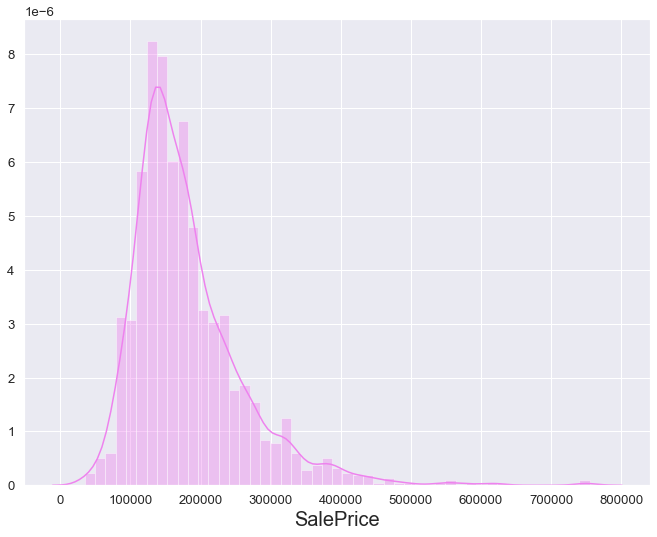

In [123]:
plt.figure(figsize=(10,8))
sns.set(font_scale=1.2)
sns.distplot(train['SalePrice'],color='violet')
plt.xlabel('SalePrice',fontsize=20)
print('Skew Dist:',train['SalePrice'].skew())
print('Kurtosis Dist:',train['SalePrice'].kurt())

Skew Dist: 0.12134661989685329
Kurtosis Dist: 0.809519155707878


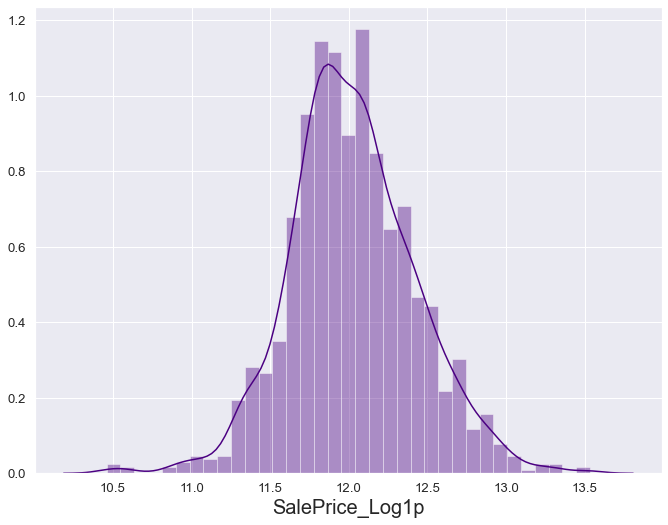

In [124]:
plt.figure(figsize=(10,8))
sns.set(font_scale=1.2)
sns.distplot(train['SalePrice_Log1p'],color='indigo')
plt.xlabel('SalePrice_Log1p',fontsize=20)
print('Skew Dist:',train['SalePrice_Log1p'].skew())
print('Kurtosis Dist:',train['SalePrice_Log1p'].kurt())

#### Can you see effect ?

### Outlier handling using PCA and DBSCAN

### DBSCAN
DBSCAN is a density-based clustering approach, and not an outlier detection method per-se. It grows clusters based on a distance measure. Core points -points that have a minimum of points in their surrounding- and points that are close enough to those core points together form a cluster.

We can use DBSCAN as an outlier detection algorithm becuase points that do not belong to any cluster get their own class: -1. The algorithm has two parameters (epsilon: length scale, and min_samples: the minimum number of samples required for a point to be a core point). Finding a good epsilon is critical.

DBSCAN thus makes binary predictions: a point is either an outlier or not. To refine the predictions, we consider the other clusters apart from the main cluster also as outlier clusters, the smaller the cluster, the higher the outlier score.

The used distance function will be the default Euclidean distance. Note that the worst-case performance of DBSCAN is O(n^2), if the neighbourhood scan is a linear scan, which is the case for the sci-kit learn implementation. This significantly limits the dataset size that can be analyzed.

One can also pass a distance matrix instead of a matrix of datapoints to the algorithm, which should reduce the time complexity. A speed-up was however not observed, but a significant memory-load (despite the matrix being sparse), so this is not done.

In [125]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA

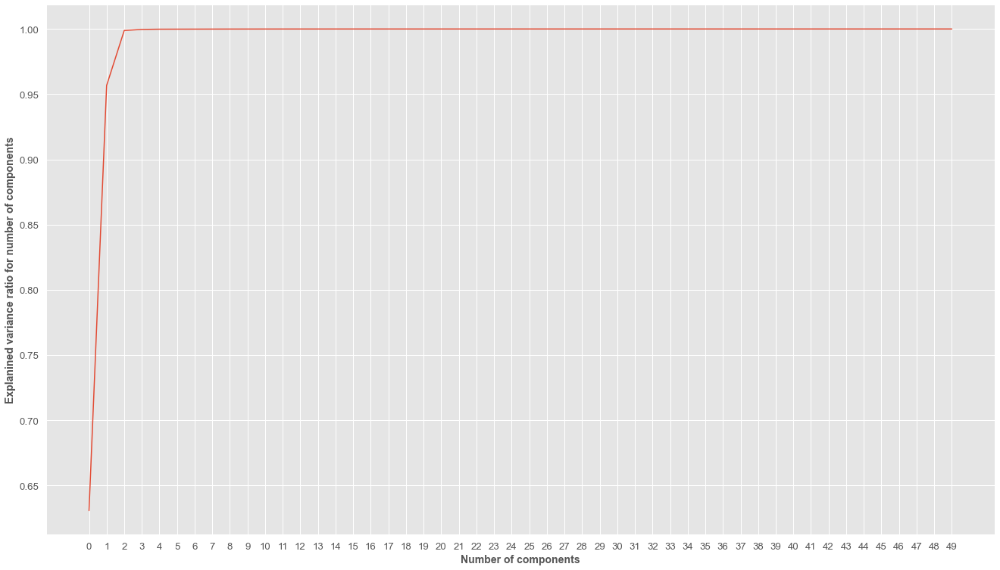

In [126]:
plt.style.use('ggplot')
plt.figure(figsize=(20,12))
rbst_scaler=RobustScaler()
train_rbst=rbst_scaler.fit_transform(train)

pca=PCA(50).fit(train_rbst)
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.xticks(np.arange(0, 50, 1))
plt.xlabel('Number of components',fontweight='bold',size=14)
plt.ylabel('Explanined variance ratio for number of components',fontweight='bold',size=14)

train_pca=PCA(3).fit_transform(train_rbst)

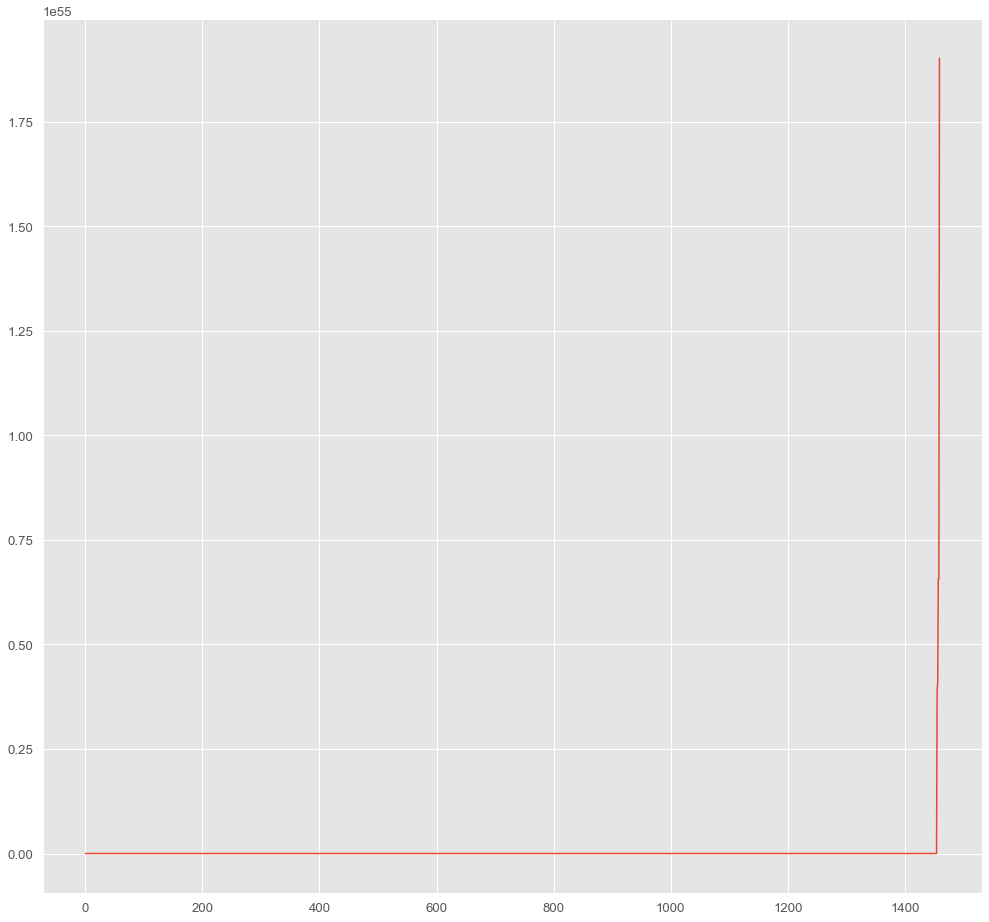

In [127]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(train)
distances, indices = nbrs.kneighbors(train)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(15,15))
plt.plot(distances)

In [128]:
dbscan = DBSCAN(eps=1400, min_samples=20).fit(train_pca)
core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
labels=dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

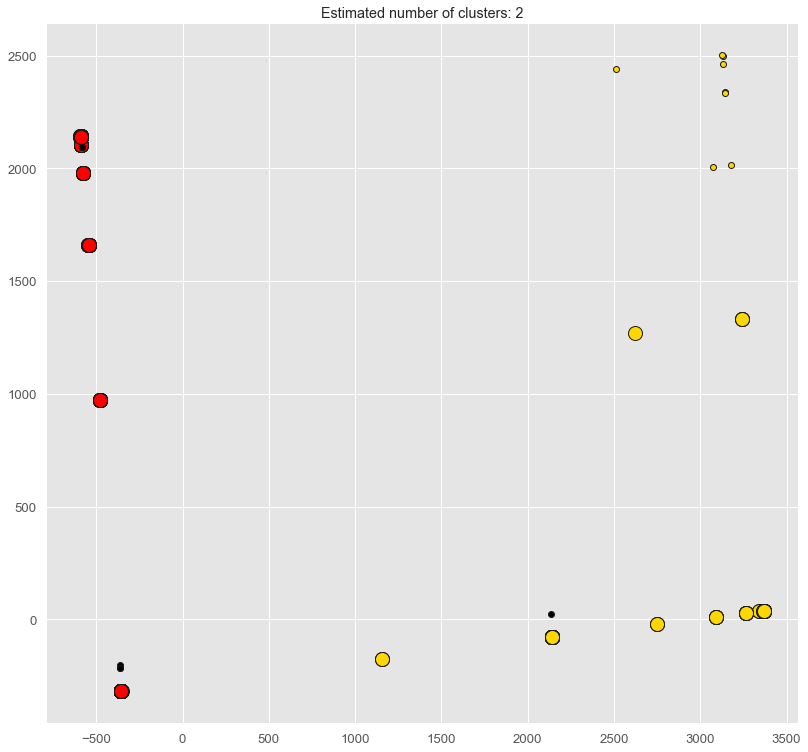

In [129]:
unique_labels = set(labels)
plt.figure(figsize=(12,12))
colors = [plt.cm.prism(each)  for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    xy = train_pca[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = train_pca[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

In [130]:
labels=pd.DataFrame(labels,columns=['Classes'])
print(labels[labels['Classes']==-1])

      Classes
197        -1
810        -1
1170       -1
1182       -1
1298       -1
1386       -1
1423       -1


In [131]:
train=pd.concat([train,labels],axis=1)

In [132]:
train[train.Classes==-1]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,YrBltRmd,Total_Square_Feet,Total_Bath,Total_Porch_Area,House_Age1,House_Age2,exists_pool,exists_IstFl,exists_2ndFl,exists_garage,exists_fireplace,exists_bsmt,old_house,SalePrice_Log1p,Classes
197,7.032144,12.038913,26.118117,15.851262,11.459793,1,3,16.304702,0.0,0.000000,0.0,12,0.000000,1.255038,0.0,5,8,4,1918,1990,0.603899,0.516626,11,12,2,0.000000,5.498765,2.335064,2,4,7.750873,15.085192,2,152.611467,166.225727,8.328699,28.778205,432.890903,0.520289,2,10.49998,6.260105,5.594622,1360,4.792411,7.797759,1.0,0.71081,2,0,4,0.75096,5.077704,8,30.831045,1,0,5,3.933197e+56,3,2.0,795.0,45.177318,65.027911,10.465805,0.000000,5.728972,20.944384,0.0,0.000000,5.842099,0.000000,0.000000,0.599329,0.000000,3,2006,3738.933400,0.000000,235000.0,3908,24.652436,3.5,77.187495,89,18,41.797413,1,1,0.712447,1,40.547606,1,12.367345,-1
810,4.250991,12.038913,16.643843,13.811204,11.459793,1,3,16.304702,0.0,3.816988,0.0,14,1.242948,1.255038,0.0,2,6,6,1974,1999,1.059263,0.516626,6,6,1,14.086205,11.456357,5.100237,1,4,7.750873,15.085192,0,112.962258,166.225727,10.142658,0.000000,347.891887,0.520289,1,10.49998,6.260105,5.572167,0,0.000000,6.981777,1.0,0.00000,1,1,3,0.75096,5.077704,5,30.831045,1,1,1,6.528750e+56,2,2.0,484.0,45.177318,65.027911,10.465805,52.216185,0.000000,0.000000,0.0,0.000000,6.047382,23.005283,0.000000,0.599329,0.000000,1,2006,3738.933400,95.385755,181000.0,3973,21.973687,2.5,47.907618,33,9,41.797413,1,0,0.712447,1,40.547606,1,12.106258,-1
1170,7.190243,12.038913,16.398656,13.755757,11.459793,1,3,16.304702,0.0,3.816988,0.0,11,1.242948,1.255038,0.0,7,6,6,1977,1977,0.603899,0.516626,9,10,2,0.000000,11.456357,5.100237,1,4,7.750873,0.000000,0,96.110964,2476.084480,0.000000,67.281910,363.084560,0.520289,4,10.49998,6.260105,5.478843,0,0.000000,6.832622,1.0,0.00000,1,0,3,0.75096,10.302990,6,30.831045,1,4,1,6.705690e+56,0,1.0,358.0,45.177318,65.027911,10.465805,43.916197,0.000000,0.000000,0.0,0.000000,5.944859,469.517270,0.000000,0.599329,0.000000,7,2008,3738.933400,95.385755,171000.0,3954,20.779652,2.0,40.495253,32,33,41.797413,1,0,0.712447,1,40.547606,1,12.049425,-1
1182,6.502440,12.038913,24.931945,14.751523,11.459793,1,0,16.304702,0.0,0.000000,0.0,15,1.242948,1.255038,0.0,5,10,5,1996,1996,1.059263,0.516626,13,7,2,0.000000,5.498765,5.100237,2,0,7.750873,0.000000,2,245.030955,2476.084480,0.000000,45.658482,686.538585,0.520289,0,10.49998,6.260105,5.923585,2065,0.000000,8.138684,1.0,0.00000,3,1,4,0.75096,0.000000,10,30.831045,2,5,1,7.935766e+56,0,3.0,813.0,45.177318,65.027911,10.465805,39.269101,13.648826,0.000000,0.0,0.000000,5.912482,0.000000,2.826050,0.599329,0.000000,7,2007,3738.933400,0.000000,745000.0,3992,28.150194,4.5,46.065789,12,13,41.797413,1,1,0.712447,1,40.547606,0,13.521141,-1
1298,6.502440,12.038913,36.043299,18.058232,11.459793,1,2,0.000000,0.0,0.000000,0.0,7,0.748863,1.255038,0.0,5,10,5,2008,2008,1.059263,0.000000,11,12,3,36.986262,0.000000,5.100237,2,0,7.750873,2.025826,2,475.812636,2476.084480,0.000000,59.427714,1470.614550,0.520289,0,10.49998,6.260105,6.289154,950,0.000000,8.355352,2.0,0.00000,2,1,3,0.75096,0.000000,12,30.831045,3,2,1,8.819180e+56,0,2.0,1418.0,45.177318,65.027911,10.46580

In [133]:
# As these are the outliers, lets drop them
train.drop([197,810,1170,1182,1298,1386,1423],axis=0,inplace=True)

In [134]:
train.shape, test.shape

((1453, 95), (1459, 93))

### I have removed 7 outliers by using DBSCAN 
#### Lets see relation of sale price and sale price (log transformed) with best columns to remove some more outliers

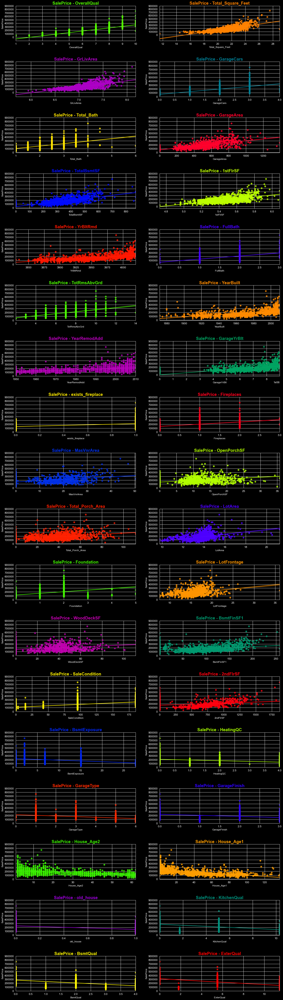

In [135]:
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(20,80))
fig.subplots_adjust(hspace=0.6)
colors=[plt.cm.prism_r(each) for each in np.linspace(0, 1, len(best_columns))]
for i,ax,color in zip(best_columns,axes.flatten(),colors):
    sns.regplot(x=train[i], y=train["SalePrice"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.8},color=color,ax=ax)
    plt.xlabel(i,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_yticks(np.arange(0,900001,100000))
    ax.set_title('SalePrice'+' - '+str(i),color=color,fontweight='bold',size=20)

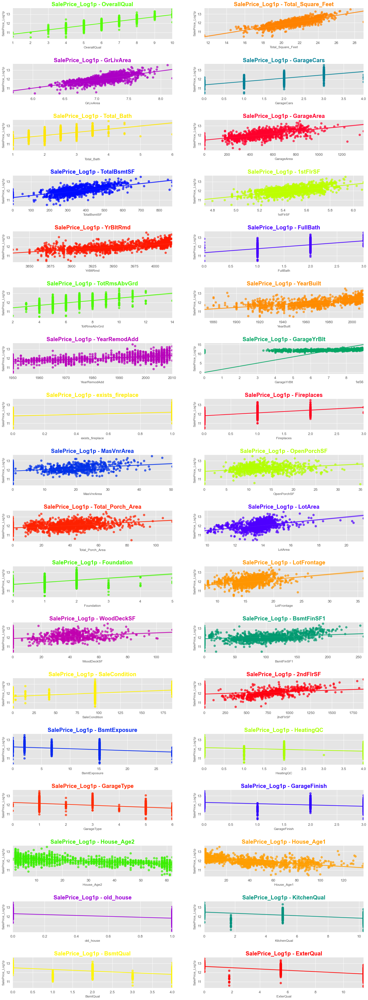

In [136]:
plt.style.use('ggplot')
fig, axes = plt.subplots(18, 2,figsize=(20,60))
fig.subplots_adjust(hspace=0.8)
sns.set(font_scale=1.2)
colors=[plt.cm.prism_r(each) for each in np.linspace(0, 1, len(best_columns))]
for i,ax,color in zip(best_columns,axes.flatten(),colors):
    sns.regplot(x=train[i], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color=color,ax=ax)
    plt.xlabel(i,fontsize=12)
    plt.ylabel('SalePrice_Log1p',fontsize=12)
    ax.set_title('SalePrice_Log1p'+' - '+str(i),color=color,fontweight='bold',size=20)

In [137]:
best_columns

['OverallQual',
 'Total_Square_Feet',
 'GrLivArea',
 'GarageCars',
 'Total_Bath',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'YrBltRmd',
 'FullBath',
 'TotRmsAbvGrd',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'exists_fireplace',
 'Fireplaces',
 'MasVnrArea',
 'OpenPorchSF',
 'Total_Porch_Area',
 'LotArea',
 'Foundation',
 'LotFrontage',
 'WoodDeckSF',
 'BsmtFinSF1',
 'SaleCondition',
 '2ndFlrSF',
 'BsmtExposure',
 'HeatingQC',
 'GarageType',
 'GarageFinish',
 'House_Age2',
 'House_Age1',
 'old_house',
 'KitchenQual',
 'BsmtQual',
 'ExterQual']

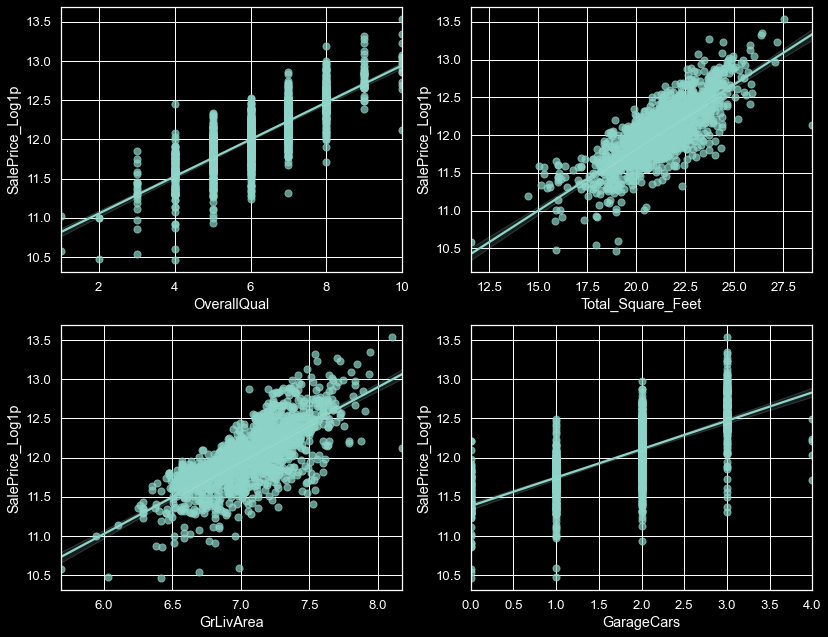

In [138]:
#"""'OverallQual',Total_Square_Feet,GrLivArea,GarageCars
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['OverallQual'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,2)
sns.regplot(x=train['Total_Square_Feet'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})

plt.subplot(2,2,3)
sns.regplot(x=train['GrLivArea'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,4)
sns.regplot(x=train['GarageCars'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

In [139]:
# single outlier in Total_Square_Feet
train['Total_Square_Feet'].max()

28.978301647526607

In [140]:
train = train[train['Total_Square_Feet']<28.97]

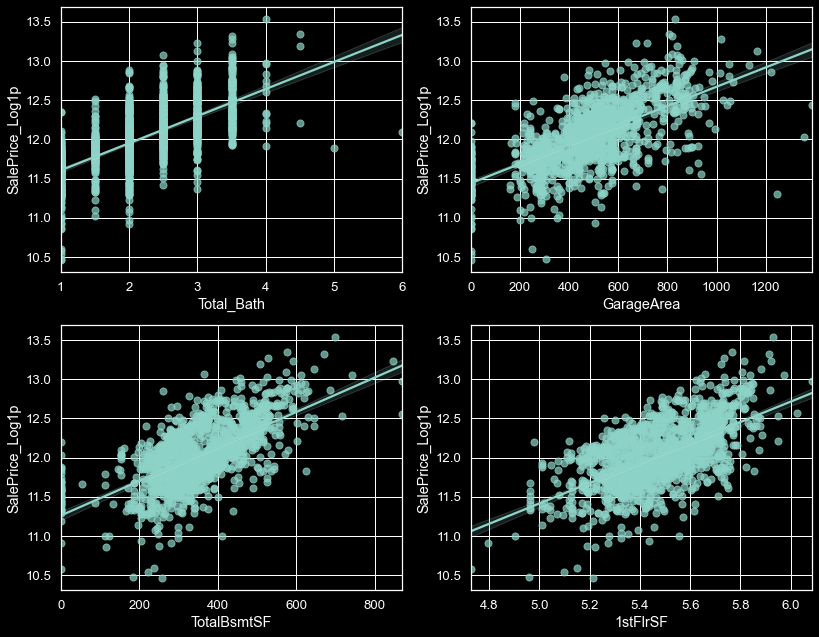

In [141]:
#"""''Total_Bath','GarageArea','TotalBsmtSF','1stFlrSF',
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['Total_Bath'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,2)
sns.regplot(x=train['GarageArea'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})

plt.subplot(2,2,3)
sns.regplot(x=train['TotalBsmtSF'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,4)
sns.regplot(x=train['1stFlrSF'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

In [142]:
#train['GarageArea'].sort_values(ascending = False)

In [143]:
train = train[train['Total_Bath']<5]
train = train[train['GarageArea']<1248]

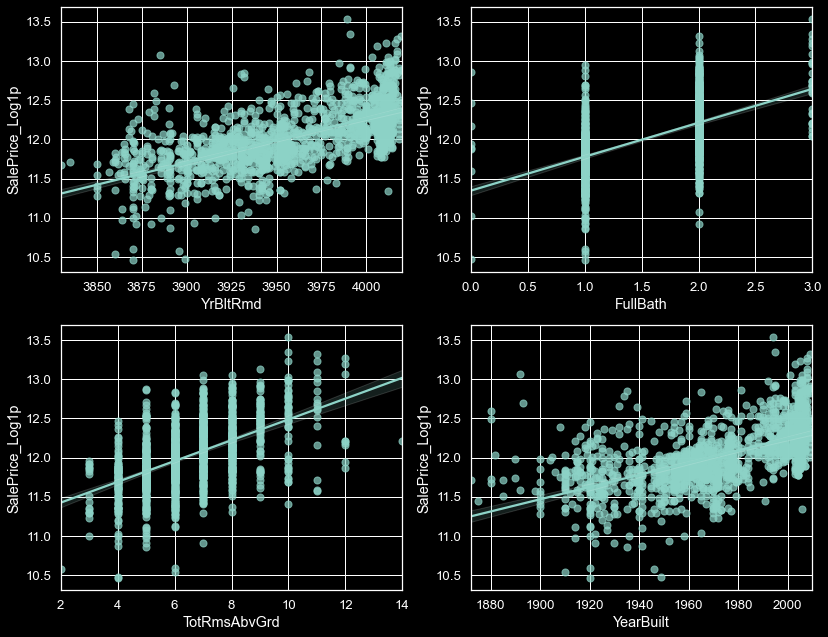

In [144]:
#"""''YrBltRmd',
 #'FullBath',
 #'TotRmsAbvGrd',
 #'YearBuilt'
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['YrBltRmd'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,2)
sns.regplot(x=train['FullBath'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})

plt.subplot(2,2,3)
sns.regplot(x=train['TotRmsAbvGrd'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.subplot(2,2,4)
sns.regplot(x=train['YearBuilt'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

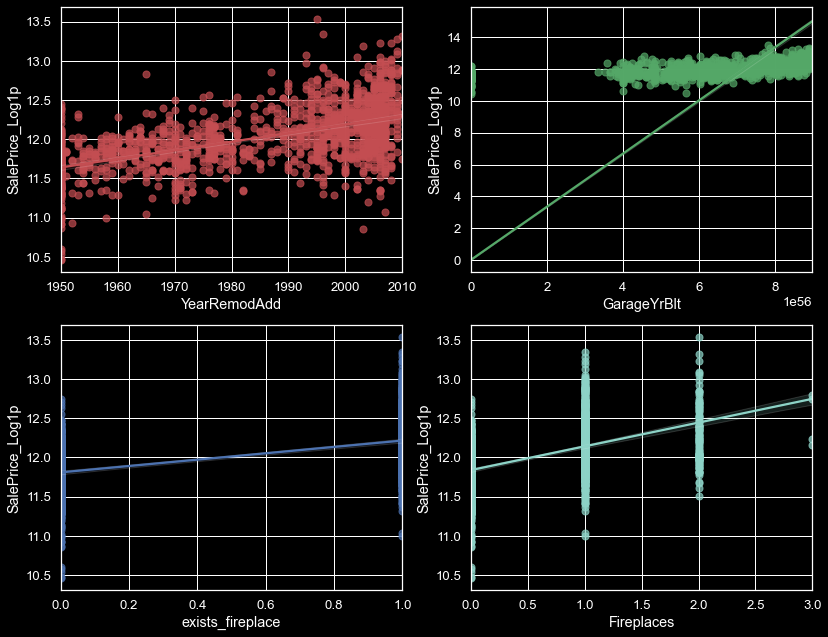

In [145]:
#'YearRemodAdd',
 #'GarageYrBlt',
 #'exists_fireplace',
 #'Fireplaces',
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['YearRemodAdd'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['GarageYrBlt'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['exists_fireplace'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['Fireplaces'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

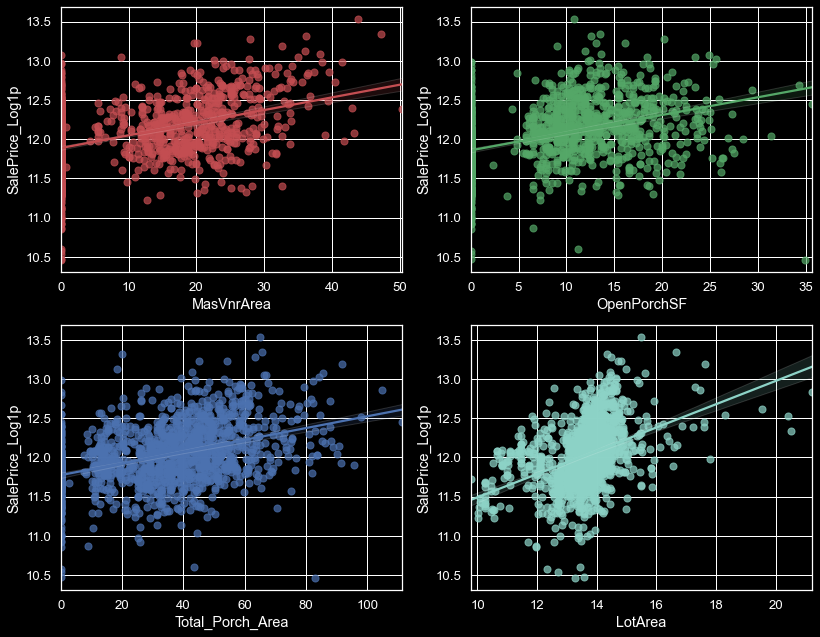

In [146]:
#'MasVnrArea',
 #'OpenPorchSF',
 #'Total_Porch_Area',
 #'LotArea',
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['MasVnrArea'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['OpenPorchSF'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['Total_Porch_Area'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['LotArea'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

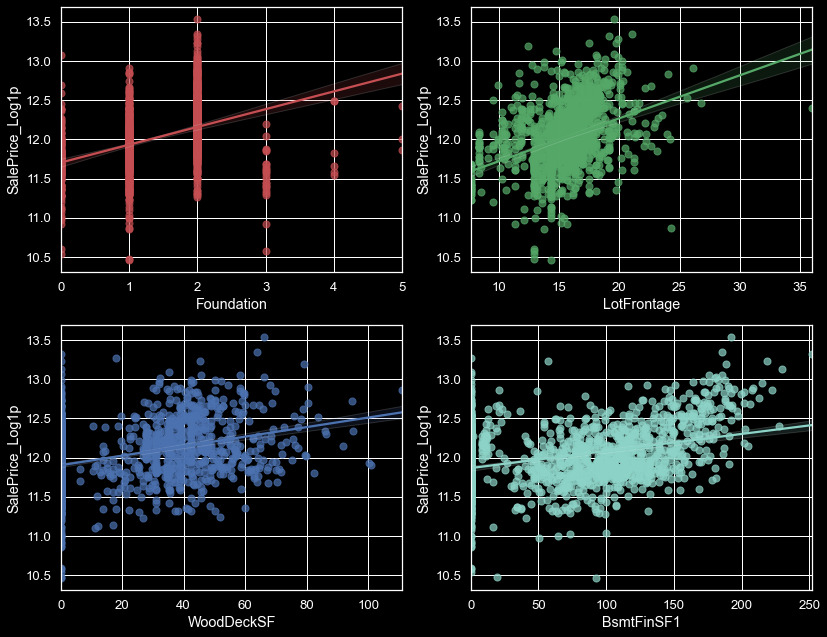

In [147]:
"""'Foundation',
 'LotFrontage',
 'WoodDeckSF',
 'BsmtFinSF1',"""
 
plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['Foundation'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['LotFrontage'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['WoodDeckSF'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['BsmtFinSF1'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

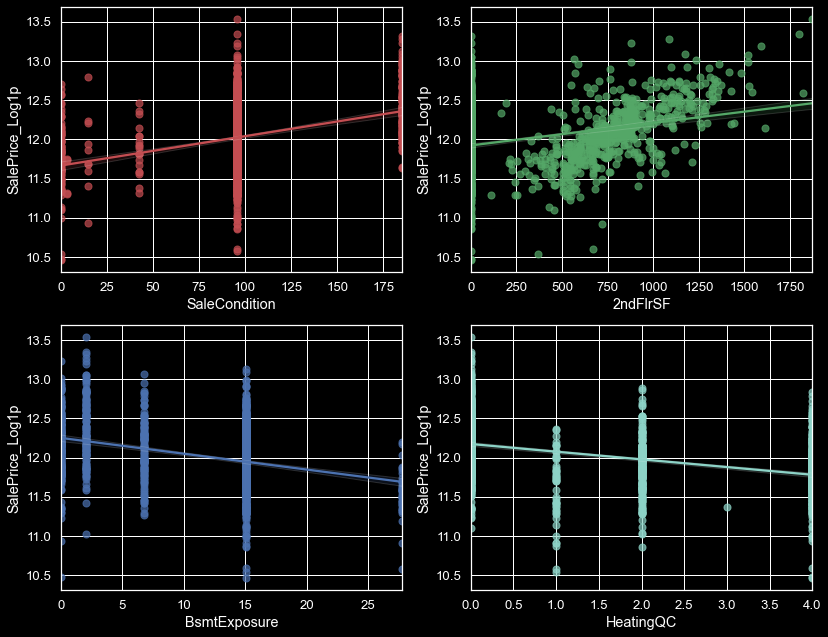

In [148]:
"""SaleCondition',
 '2ndFlrSF',
 'BsmtExposure',
 'HeatingQC',"""

plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['SaleCondition'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['2ndFlrSF'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['BsmtExposure'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['HeatingQC'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

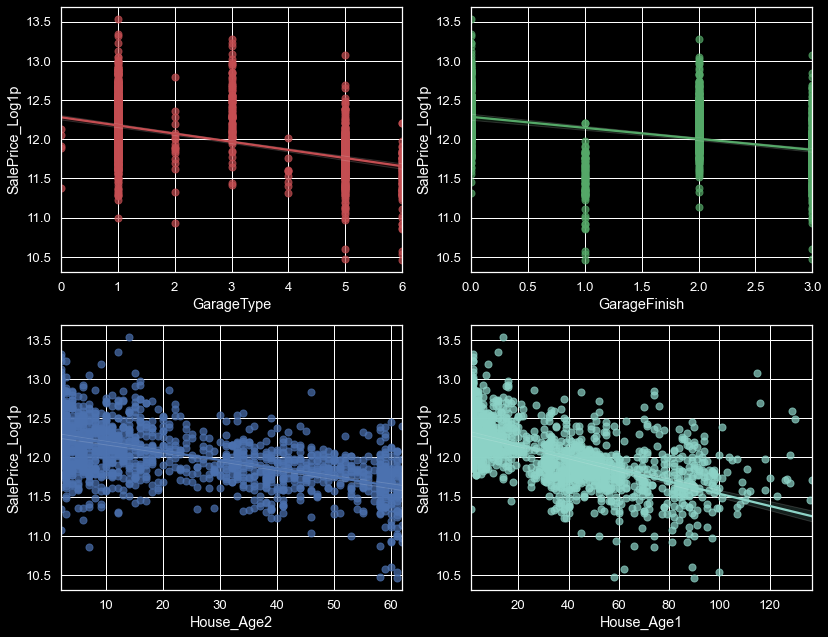

In [149]:
"""'GarageType',
 'GarageFinish',
 'House_Age2',
 'House_Age1',"""

plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['GarageType'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['GarageFinish'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['House_Age2'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['House_Age1'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

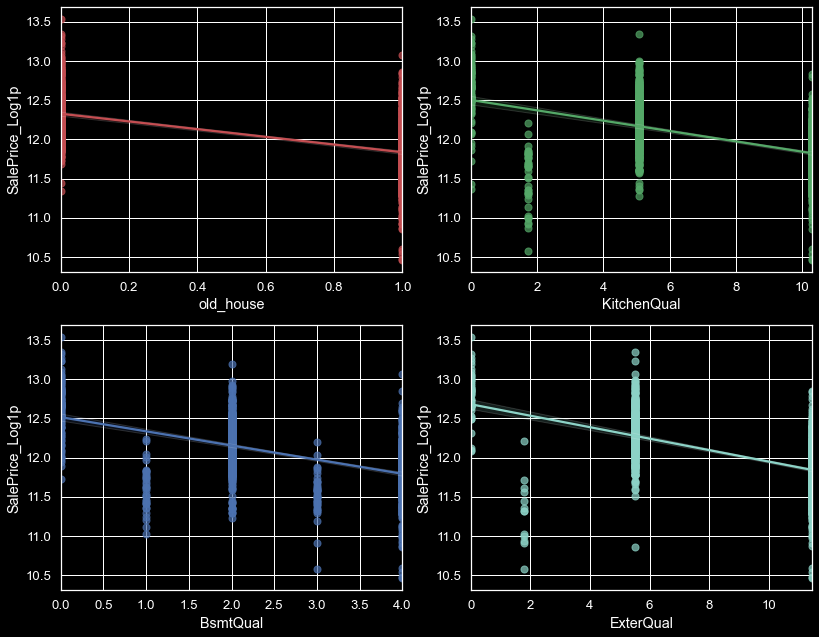

In [150]:
"""'old_house',
 'KitchenQual',
 'BsmtQual',
 'ExterQual']"""

plt.style.use('dark_background')
fig, axes = plt.subplots(18, 2,figsize=(12,10))
#fig.subplots_adjust(hspace=1.2)
plt.subplot(2,2,1)
sns.regplot(x=train['old_house'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='r')
plt.subplot(2,2,2)
sns.regplot(x=train['KitchenQual'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7}, color='g')

plt.subplot(2,2,3)
sns.regplot(x=train['BsmtQual'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7},color='b')
plt.subplot(2,2,4)
sns.regplot(x=train['ExterQual'], y=train["SalePrice_Log1p"], fit_reg=True,marker='o',scatter_kws={'s':50,'alpha':0.7})
plt.show();

In [151]:
train.shape, test.shape

((1447, 95), (1459, 93))

In [152]:
### Lets check correlation now without outliers

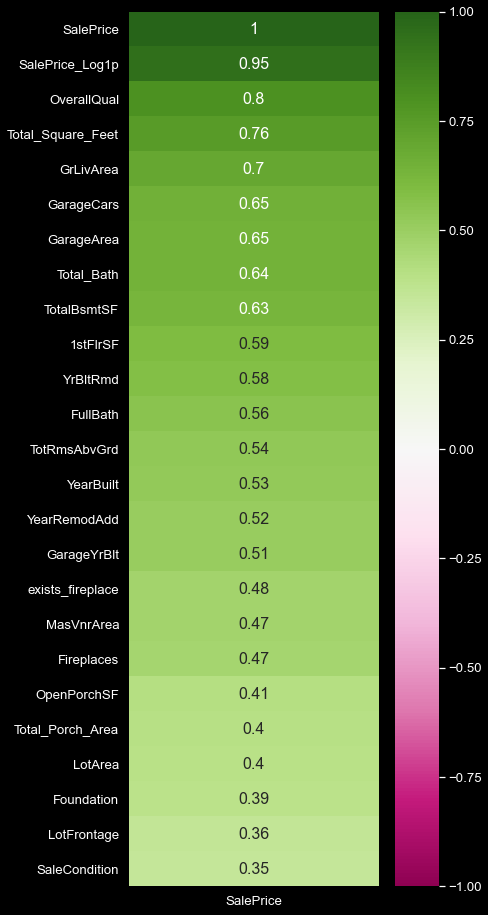

In [153]:
plt.style.use('dark_background')
corr1_new_train=train.corr()
plt.figure(figsize=(5,15))
sns.heatmap(corr1_new_train[['SalePrice']].sort_values(by=['SalePrice'],ascending=False).head(25),annot_kws={"size": 16},vmin=-1, cmap='PiYG', annot=True)
sns.set(font_scale=2)

#### correlation has improved

In [154]:
del test['SalePrice']

In [155]:
# making X and y
X=train.drop(['SalePrice','SalePrice_Log1p','Classes'],axis=1)
y=train.SalePrice_Log1p

In [163]:
for i in X.columns:
        counts = X[i].value_counts()
        #print(i, '\n', counts)
        zeros = counts.iloc[0]
        print(i, '\n', zeros)

MSSubClass 
 534
MSZoning 
 1139
LotFrontage 
 142
LotArea 
 25
Street 
 1442
Alley 
 1356
LotShape 
 917
LandContour 
 1302
Utilities 
 1446
LotConfig 
 1043
LandSlope 
 1370
Neighborhood 
 224
Condition1 
 1252
Condition2 
 1433
BldgType 
 1210
HouseStyle 
 721
OverallQual 
 395
OverallCond 
 815
YearBuilt 
 67
YearRemodAdd 
 177
RoofStyle 
 1134
RoofMatl 
 1423
Exterior1st 
 514
Exterior2nd 
 503
MasVnrType 
 865
MasVnrArea 
 857
ExterQual 
 900
ExterCond 
 1272
Foundation 
 642
BsmtQual 
 643
BsmtCond 
 1299
BsmtExposure 
 947
BsmtFinType1 
 427
BsmtFinSF1 
 464
BsmtFinType2 
 1246
BsmtFinSF2 
 1283
BsmtUnfSF 
 116
TotalBsmtSF 
 37
Heating 
 1415
HeatingQC 
 736
CentralAir 
 1352
Electrical 
 1322
1stFlrSF 
 25
2ndFlrSF 
 823
LowQualFinSF 
 1422
GrLivArea 
 22
BsmtFullBath 
 853
BsmtHalfBath 
 1366
FullBath 
 763
HalfBath 
 907
BedroomAbvGr 
 797
KitchenAbvGr 
 1380
KitchenQual 
 730
TotRmsAbvGrd 
 400
Functional 
 1347
Fireplaces 
 687
FireplaceQu 
 687
GarageType 
 863
GarageYrBl

In [166]:
# Finding variables which can create over fitting

def overfit_reducer(df):

    overfit = []
    for i in df.columns:
        counts = df[i].value_counts()
        zeros = counts.iloc[0]
        if zeros / len(df) * 100 > 99.9:
            overfit.append(i)
    overfit = list(overfit)
    return overfit
overfitted_features = overfit_reducer(X)

In [167]:
overfitted_features

['Utilities', 'PoolArea', 'PoolQC', 'exists_pool', 'exists_IstFl']

In [168]:
### Lets drop them from X and test
X.drop(['Utilities', 'PoolArea', 'PoolQC', 'exists_pool', 'exists_IstFl'], axis=1, inplace = True)
test.drop(['Utilities', 'PoolArea', 'PoolQC', 'exists_pool', 'exists_IstFl'], axis=1, inplace = True)

In [169]:
print(X.shape)
print(test.shape)

(1447, 87)
(1459, 87)


In [170]:
### Scaling
from sklearn.preprocessing import StandardScaler,RobustScaler,LabelEncoder,PowerTransformer

std_scaler=StandardScaler()
rbst_scaler=RobustScaler()
power_transformer=PowerTransformer()
X_std=std_scaler.fit_transform(X)
X_rbst=rbst_scaler.fit_transform(X)
X_pwr=power_transformer.fit_transform(X)

test_std=std_scaler.transform(test)
test_rbst=rbst_scaler.transform(test)
test_pwr=power_transformer.transform(test)

In [171]:
### Splitting the data in X_train,X_test,y_train,y_test

In [172]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X_std,y,test_size=0.2,random_state=52)
print('X_train Shape :',X_train.shape)
print('X_test Shape :',X_test.shape)
print('y_train Shape :',y_train.shape)
print('y_test Shape :',y_test.shape)

X_train Shape : (1157, 87)
X_test Shape : (290, 87)
y_train Shape : (1157,)
y_test Shape : (290,)


In [173]:
# Import common MLA libraries
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from xgboost import XGBClassifier, XGBRegressor
from sklearn.neural_network import MLPRegressor

In [174]:
# Regression problem

MLA = [
    
    # Linear Regression
    linear_model.LinearRegression(),
    linear_model.Ridge(),
    
    # Decision Tree
    tree.DecisionTreeRegressor(random_state = 0),
    
    #Ensemble Methods
    ensemble.BaggingRegressor(random_state = 0),
    ensemble.ExtraTreesRegressor(random_state = 0),
    ensemble.GradientBoostingRegressor(random_state = 0),
    ensemble.RandomForestRegressor(random_state = 0),
    
    #Nearest Neighbor
    neighbors.KNeighborsRegressor(),

    #xgboost
    XGBRegressor(random_state = 0), 
    
    ]

In [175]:
#create table to compare MLA metrics
MLA_columns = ['MLA Name', 'MLA Parameters','MLA Train Accuracy', 'MLA Test Accuracy', 'MLA RMSE', 'MLA Time']
MLA_compare = pd.DataFrame(columns = MLA_columns)

row_index = 0


for alg in MLA:
    #index through MLA and save performance to table
    
    #set name and parameters
    MLA_name = alg.__class__.__name__
    MLA_compare.loc[row_index, 'MLA Name'] = MLA_name
    MLA_compare.loc[row_index, 'MLA Parameters'] = str(alg.get_params())
    
    #score model
    fitted_alg = alg.fit(X_train, y_train)
    MLA_compare.loc[row_index, 'MLA Train Accuracy'] = fitted_alg.score(X_train, y_train)
    MLA_compare.loc[row_index, 'MLA Test Accuracy'] = fitted_alg.score(X_test, y_test)
    #MLA_compare.loc[row_index, 'MLA Time'] = fitted_alg.fit_time(X_test, y_test)
    """cv_results['fit_time'].mean()"""
    # RMSE score
    MLA_compare.loc[row_index, 'MLA RMSE'] = np.sqrt(mean_squared_error(y_test, alg.predict(X_test)))
    
    row_index+=1

    
#print and sort table
MLA_compare.sort_values(by = ['MLA RMSE'], ascending = True, inplace = True)
MLA_compare

,MLA Name,MLA Parameters,MLA Train Accuracy,MLA Test Accuracy,MLA RMSE,MLA Time
5,GradientBoostingRegressor,"{'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'ls', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'presort': 'deprecated', 'random_state': 0, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}",0.968238,0.896451,0.125987,NaN
1,Ridge,"{'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'normalize': False, 'random_state': None, 'solver': 'auto', 'tol': 0.001}",0.933307,0.888953,0.130468,NaN
0,LinearRegression,"{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': False}",0.933316,0.888843,0.130533,NaN
4,ExtraTreesRegressor,"{'bootstrap': False, 'ccp_alpha': 0.0, 'criterion': 'mse', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}",1,0.881776,0.134619,NaN
6,RandomForestRegressor,"{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'mse', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}",0.98417,0.874589,0.13865,NaN
3,BaggingRegressor,"{'base_estimator': None, 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}",0.976524,0.862343,0.145261,NaN
8,XGBRegressor,"{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'gamma': None, 'gpu_id': None, 'importance_type': 'gain', 'interaction_constraints': None, 'learning_rate': None, 'max_delta_step': None, 'max_depth': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 0, 'reg_alpha': None, 'reg_lambda': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}",0.999791,0.853006,0.150107,NaN
7,KNeighborsRegressor,"{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}",0.87914,0.786688,0.180825,NaN
2,DecisionTreeRegressor,"{'ccp_alpha': 0.0, 'criterion': 'mse', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': 'deprecated', 'random_state': 0, 'splitter': 'best'}",1,0.714376,0.209242,NaN


In [176]:
from sklearn.model_selection import RandomizedSearchCV, KFold,GridSearchCV
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [177]:
# RidgeCV
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)
#{'alpha': 1.0, 'copy_X': True, 'fit_intercept'...	
alphas=[1e-9,1e-8,1e-7,1e-6]

ridgecv_reg= make_pipeline(RidgeCV(alphas=alphas, cv=kfolds))
ridgecv_reg.fit(X_train, y_train)
y_head=ridgecv_reg.predict(X_test)
print('-'*10+'RidgeCV'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------RidgeCV----------
R square Accuracy:  0.8889014765820825
Mean Absolute Error Accuracy:  0.08566884153164075
Mean Squared Error Accuracy:  0.017029878971123076


In [179]:
import lightgbm as lgb
import xgboost as xgb
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, KFold,GridSearchCV
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.preprocessing import StandardScaler,RobustScaler,LabelEncoder,PowerTransformer
from sklearn.ensemble import GradientBoostingRegressor,StackingRegressor, RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeRegressor

In [180]:
#lightgbm
lgb_regressor=lgb.LGBMRegressor(objective='regression', num_leaves=5, learning_rate=0.035, n_estimators=2177, max_bin=50, bagging_fraction=0.65,bagging_freq=5, bagging_seed=7, 
                                feature_fraction=0.201, feature_fraction_seed=7,n_jobs=-1)
lgb_regressor.fit(X_train, y_train)
y_head=lgb_regressor.predict(X_test)
print('-'*10+'LGBM'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.201, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.201
[LightGBM] [Warning] bagging_fraction is set=0.65, subsample=1.0 will be ignored. Current value: bagging_fraction=0.65
----------LGBM----------
R square Accuracy:  0.8904975975015753
Mean Absolute Error Accuracy:  0.08272090564690868
Mean Squared Error Accuracy:  0.016785215538648906


In [181]:
#GradientBoostingRegressor
gb_reg = GradientBoostingRegressor(n_estimators=1992, learning_rate=0.03005, max_depth=4, max_features='sqrt', min_samples_leaf=15, min_samples_split=14, loss='huber', random_state =42)
gb_reg.fit(X_train, y_train)
y_head=gb_reg.predict(X_test)
print('-'*10+'GBR'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------GBR----------
R square Accuracy:  0.897414184290461
Mean Absolute Error Accuracy:  0.08091437710727145
Mean Squared Error Accuracy:  0.015724997704205598


In [182]:
#LassoCV
kfolds = KFold(n_splits=8, shuffle=True, random_state=42)

lassocv_reg= make_pipeline(LassoCV(alphas=alphas, cv=kfolds))
lassocv_reg.fit(X_train, y_train)
y_head=lassocv_reg.predict(X_test)
print('-'*10+'LassoCV'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------LassoCV----------
R square Accuracy:  0.8888057770179896
Mean Absolute Error Accuracy:  0.08569804206723096
Mean Squared Error Accuracy:  0.017044548400958454


In [183]:
#ElsticNetCV
kfolds = KFold(n_splits=8, shuffle=True, random_state=42)

alphas=[0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006]
l1ratio=[0.87, 0.9,0.92, 0.95,0.97, 0.99, 1]

elasticv_reg= make_pipeline(ElasticNetCV(alphas=alphas, cv=kfolds, l1_ratio=l1ratio))
elasticv_reg.fit(X_train, y_train)
y_head=elasticv_reg.predict(X_test)
print('-'*10+'ElasticNetCV'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------ElasticNetCV----------
R square Accuracy:  0.8909168869637789
Mean Absolute Error Accuracy:  0.08479276753622342
Mean Squared Error Accuracy:  0.016720944218243192


In [184]:
#StackingRegressor
estimators = [ ('gbr', gb_reg),   
              ('lasso', lassocv_reg),   
              ('ridge', ridgecv_reg),   
              ('elasticnet', elasticv_reg)]

stack_reg=StackingRegressor(estimators=estimators,final_estimator=ExtraTreesRegressor(n_estimators=50),n_jobs=-1)
stack_reg.fit(X_train, y_train)
y_head=stack_reg.predict(X_test)
print('-'*10+'StackingRegressor'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------StackingRegressor----------
R square Accuracy:  0.8820718371415659
Mean Absolute Error Accuracy:  0.09142681802311486
Mean Squared Error Accuracy:  0.018076768970289796


In [185]:
# making dataframe with prediction
y_head=pd.DataFrame(y_head,columns=['Predict'])
y_test.reset_index(drop=True,inplace=True)
y_test_y_head=pd.concat([y_test,y_head],axis=1)
y_test_y_head.head()

,SalePrice_Log1p,Predict
0,12.363081,12.142196
1,12.173038,12.263357
2,12.268583,12.347958
3,12.354497,12.495859
4,12.013101,12.065831


In [186]:
# predicting test data with all these models
test_pred_lgb=lgb_regressor.predict(test_pwr)
test_pred_gb=gb_reg.predict(test_pwr)
test_pred_elastic=elasticv_reg.predict(test_pwr)
test_pred_ridge=ridgecv_reg.predict(test_pwr)
test_pred_lasso=lassocv_reg.predict(test_pwr)
test_pred_stack=stack_reg.predict(test_pwr)

In [187]:
# making dataframe with these predictions
test_pred_lgb=pd.DataFrame(test_pred_lgb,columns=['SalePrice'])
test_pred_gb=pd.DataFrame(test_pred_gb,columns=['SalePrice'])
test_pred_elastic=pd.DataFrame(test_pred_elastic,columns=['SalePrice'])
test_pred_ridge=pd.DataFrame(test_pred_ridge,columns=['SalePrice'])
test_pred_lasso=pd.DataFrame(test_pred_lasso,columns=['SalePrice'])
test_pred_stack=pd.DataFrame(test_pred_stack,columns=['SalePrice'])

In [188]:
# getting anti log (to get Sale Price)
test_pred_lgb.SalePrice =np.floor(np.expm1(test_pred_lgb.SalePrice))
test_pred_gb.SalePrice =np.floor(np.expm1(test_pred_gb.SalePrice))
test_pred_elastic.SalePrice =np.floor(np.expm1(test_pred_elastic.SalePrice))
test_pred_ridge.SalePrice =np.floor(np.expm1(test_pred_ridge.SalePrice))
test_pred_lasso.SalePrice =np.floor(np.expm1(test_pred_lasso.SalePrice))
test_pred_stack.SalePrice =np.floor(np.expm1(test_pred_stack.SalePrice))

In [190]:
# taking average of all models
final_pred=(test_pred_stack+test_pred_lgb+test_pred_ridge+test_pred_gb + test_pred_elastic + test_pred_lasso)/6
final_pred.head()

,SalePrice
0,123331.333333
1,154789.000000
2,184564.666667
3,201060.833333
4,188575.166667


In [192]:
#Lets check accuracy on test data of kaggle by submitting predictions in form of submission file

y_pred_test = (test_pred_stack+test_pred_lgb+test_pred_ridge+test_pred_gb + test_pred_elastic + test_pred_lasso)/6

temp = pd.DataFrame(pd.read_csv("/Users/tuktuk/Downloads/house-prices-advanced-regression-techniques/test.csv")['Id'])
temp['SalePrice'] = y_pred_test
temp.to_csv("/Users/tuktuk/Downloads/house-prices-advanced-regression-techniques/submission23Sep1.csv", index = False)

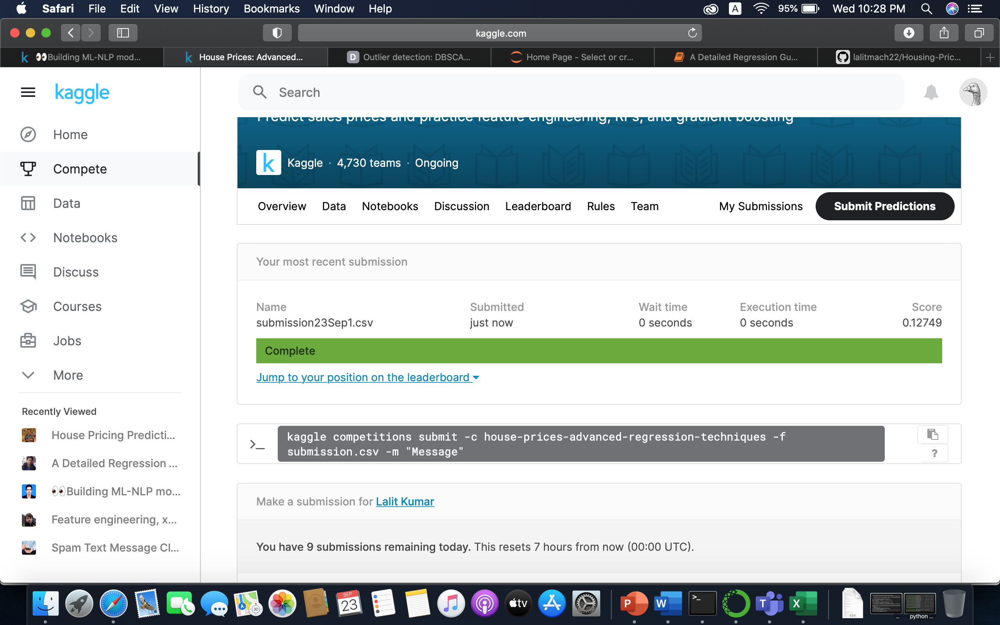

In [193]:
Image("/Users/tuktuk/Desktop/Screenshot 2020-09-23 at 10.28.02 PM.png")

### I submitted and got score of 0.12749

# Happy Learning
## notebook is available at
### "https://github.com/lalitmach22/Housing-Price-Prediction"

# Theoretical concepts of linear regression with example from this datset
I would like to discuss Linear Regression algorthms(Linear, Ridge, Lasso, ElasticNet) for a better understanding. This way I would review what I know and at the same time help out the community. If you already know enough about Linear Regression, you may skip this part and go straight to the part where I fit the model. However, if you take your time to read this and other model description sections and let me know how I am doing, I would genuinely appreciate it. Let's get started.

#### Linear Regression

We will start with one of the most basic but useful machine learning model, Linear Regression. However, do not let the simplicity of this model fool you, as Linear Regression is the base some of the most complex models out there. For the sake of understanding this model, we will use only two features, SalePrice and GrLivArea. Let's take a sample of the data and graph it.

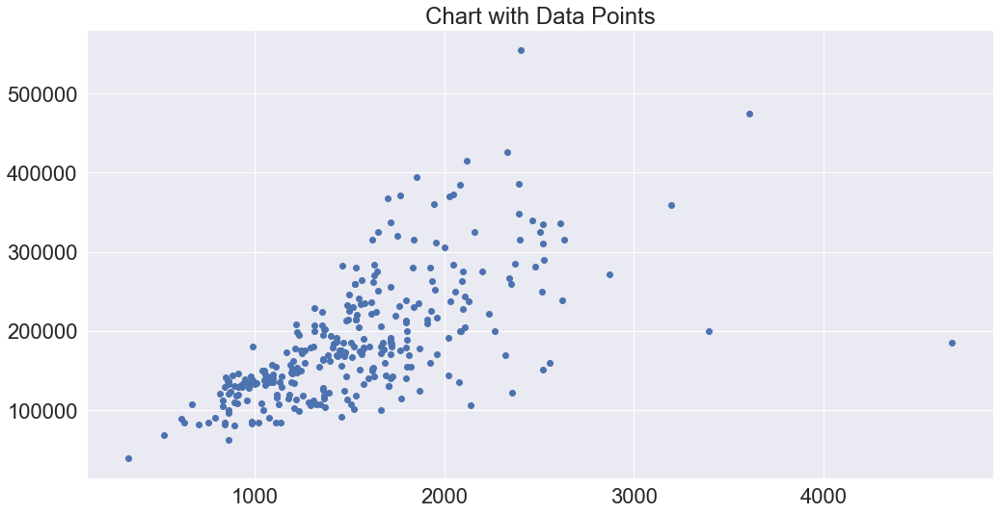

In [196]:
sample_train = train_orig.sample(300)
import seaborn as sns
plt.subplots(figsize = (15,8))
ax = plt.gca()
ax.scatter(sample_train.GrLivArea.values, sample_train.SalePrice.values, color ='b');
plt.title("Chart with Data Points");

#### As we discussed before, there is a linear relationship between SalePrice and GrLivArea. We want to know/estimate/predict the sale price of a house based on the given area, How do we do that? One naive way is to find the average of all the house prices. Let's find a line with the average of all houses and place it in the scatter plot. Simple enough.

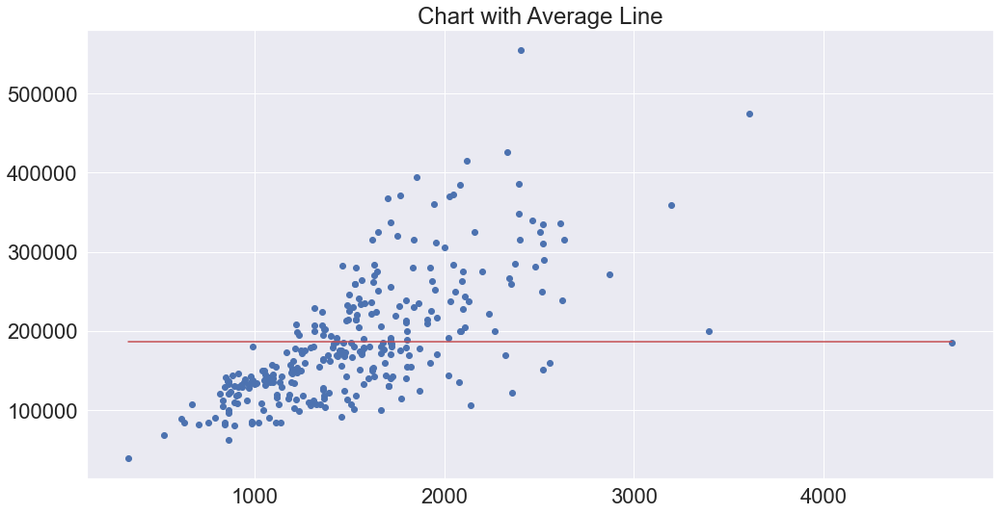

In [197]:
plt.subplots(figsize = (15,8))
ax = plt.gca()
ax.scatter(sample_train.GrLivArea.values, sample_train.SalePrice.values, color ='b');
#ax = sns.regplot(sample_train.GrLivArea.values, sample_train.SalePrice.values)
ax.plot((sample_train.GrLivArea.values.min(),sample_train.GrLivArea.values.max()), (sample_train.SalePrice.values.mean(),sample_train.SalePrice.values.mean()), color = 'r');
plt.title("Chart with Average Line");

#### You can tell this is not the most efficient way to estimate the price of houses. The average line clearly does not represent all the datapoint and fails to grasp the linear relationship between GrLivArea & SalePrice. Let use one of the evaluation regression metrics and find out the Mean Squared Error(more on this later) of this line.

In [198]:
## Calculating Mean Squared Error(MSE)
sample_train['mean_sale_price'] = sample_train.SalePrice.mean()
sample_train['mse'] = np.square(sample_train.mean_sale_price - sample_train.SalePrice)
sample_train.mse.mean()
## getting mse
print("Mean Squared Error(MSE) for average line is : {}".format(sample_train.mse.mean()))

Mean Squared Error(MSE) for average line is : 6041402676.073463


#### We will explain more on MSE later. For now, let's just say, the closer the value of MSE is to "0", the better. Of course, it makes sense since we are talking about an error(mean squared error). We want to minimize this error. How can we do that?

Introducing Linear Regression, one of the most basic and straightforward models. Many of us may have learned to show the relationship between two variable using something called "y equals mX plus b." Let's refresh our memory and call upon on that equation.

#### y = mx + b

#### Here,

m = slope of the regression line. It represents the relationship between X and y. In another word, it gives weight as to for each x(horizontal space) how much y(vertical space) we have to cover. In machine learning, we call it coefficient.

b = y-intercept.

x and y are the data points located in x_axis and y_axis respectively.

#### y = B0 + B1x1 + e
And, this is the equation for a simple linear regression. Here,

y = Dependent variable. This is what we are trying to estimate/solve/understand.

B0  = the y-intercept, it is a constant and it represents the value of y when x is 0.

B1  = Slope, Weight, Coefficient of x. This metrics is the relationship between y and x. In simple terms, it shows 1 unit increase in y changes when 1 unit increases in x.

x1 = Independent variable ( simple linear regression ) /variables.

e = error or residual.

residual = 𝑦𝑖−𝑦̂𝑖

##### This error is the only part that's different/addition from the slope equation. This error exists because in real life we will never have a dataset where the regression line crosses exactly every single data point. There will be at least a good amount of points where the regression line will not be able to go through for the sake of model specifications and bias-variance tradeoff (more on this later). This error term accounts for the difference of those points. So, simply speaking, an error is the difference between an original value (yi) and a predicted value(  𝑦̂𝑖). 


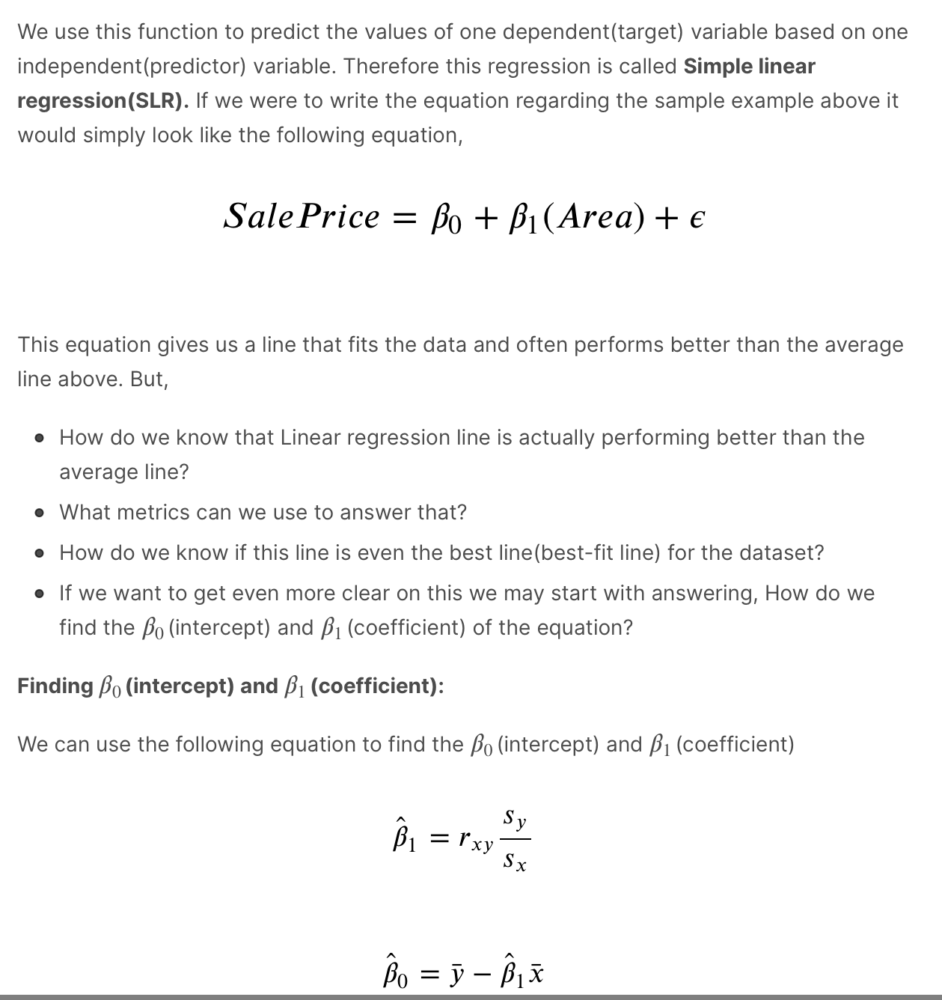

In [200]:
Image("/Users/tuktuk/Desktop/Images/Image 5.png") # Image 5

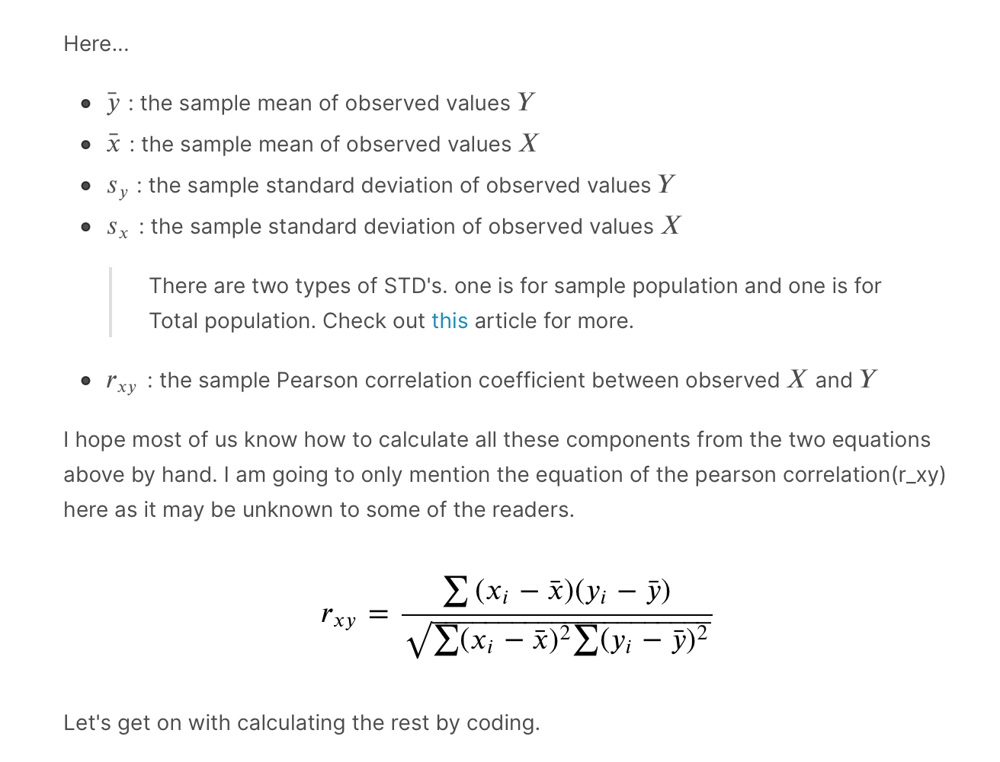

In [201]:
Image("/Users/tuktuk/Desktop/Images/Image 6.png") #Image 6

In [202]:
## Calculating the beta coefficients by hand. 
## mean of y. 
y_bar = sample_train.SalePrice.mean()
## mean of x. 
x_bar = sample_train.GrLivArea.mean()
## Std of y
std_y = sample_train.SalePrice.std()
## std of x
std_x = sample_train.GrLivArea.std()
## correlation of x and y
r_xy = sample_train.corr().loc['GrLivArea','SalePrice']
## finding beta_1
beta_1 = r_xy*(std_y/std_x)
## finding beta_0
beta_0 = y_bar - beta_1*x_bar

In [203]:
## getting y_hat, which is the predicted y values. 
sample_train['Linear_Yhat'] = beta_0 + beta_1*sample_train['GrLivArea']

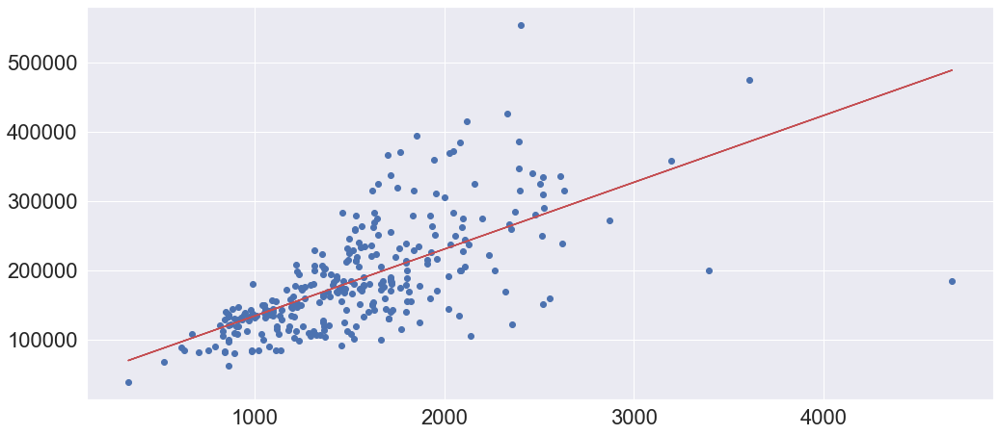

In [204]:
# create a figure
fig = plt.figure(figsize=(15,7))
# get the axis of that figure
ax = plt.gca()

# plot a scatter plot on it with our data
ax.scatter(sample_train.GrLivArea, sample_train.SalePrice, c='b')
ax.plot(sample_train['GrLivArea'], sample_train['Linear_Yhat'], color='r');

In [205]:
## getting mse
print("Mean Squared Error(MSE) for regression line is : {}".format(np.square(sample_train['SalePrice'] 
                                                                             - sample_train['Linear_Yhat']).mean()))

Mean Squared Error(MSE) for regression line is : 3406519788.314047


In [206]:
from sklearn.metrics import mean_squared_error
mean_squared_error(sample_train['SalePrice'], sample_train.Linear_Yhat)

3406519788.3140464

#### A much-anticipated decrease in mean squared error(mse), therefore better-predicted model. The way we compare between the two predicted lines is by considering their errors. Let's put both of the model's side by side and compare the errors.

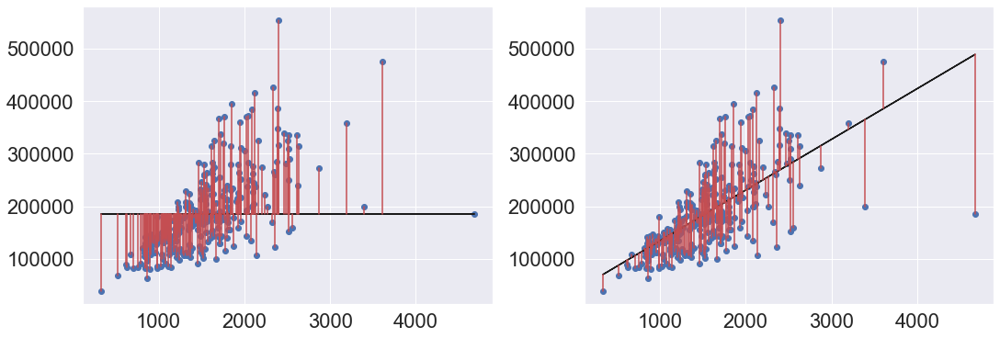

In [207]:
## Creating a customized chart. and giving in figsize and everything. 
fig = plt.figure(constrained_layout=True, figsize=(15,5))
## creating a grid of 3 cols and 3 rows. 
grid = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
#gs = fig3.add_gridspec(3, 3)
#ax1 = fig.add_subplot(grid[row, column])
ax1 = fig.add_subplot(grid[0, :1])

# get the axis
ax1 = fig.gca()

# plot it
ax1.scatter(x=sample_train['GrLivArea'], y=sample_train['SalePrice'], c='b')
ax1.plot(sample_train['GrLivArea'], sample_train['mean_sale_price'], color='k');

# iterate over predictions
for _, row in sample_train.iterrows():
    plt.plot((row['GrLivArea'], row['GrLivArea']), (row['SalePrice'], row['mean_sale_price']), 'r-')
    
ax2 = fig.add_subplot(grid[0, 1:])

# plot it
ax2.scatter(x=sample_train['GrLivArea'], y=sample_train['SalePrice'], c='b')
ax2.plot(sample_train['GrLivArea'], sample_train['Linear_Yhat'], color='k');
# iterate over predictions
for _, row in sample_train.iterrows():
    plt.plot((row['GrLivArea'], row['GrLivArea']), (row['SalePrice'], row['Linear_Yhat']), 'r-')

#### On the two charts above, the left one is the average line, and the right one is the regression line. Blue dots are observed data points and red lines are error distance from each observed data points to model-predicted line. As you can see, the regression line reduces much of the errors; therefore, performs much better than average line.

Now, we need to introduce a couple of evaluation metrics that will help us compare and contrast models. One of them is mean squared error(MSE) which we used while comparing two models. Some of the other metrics are...

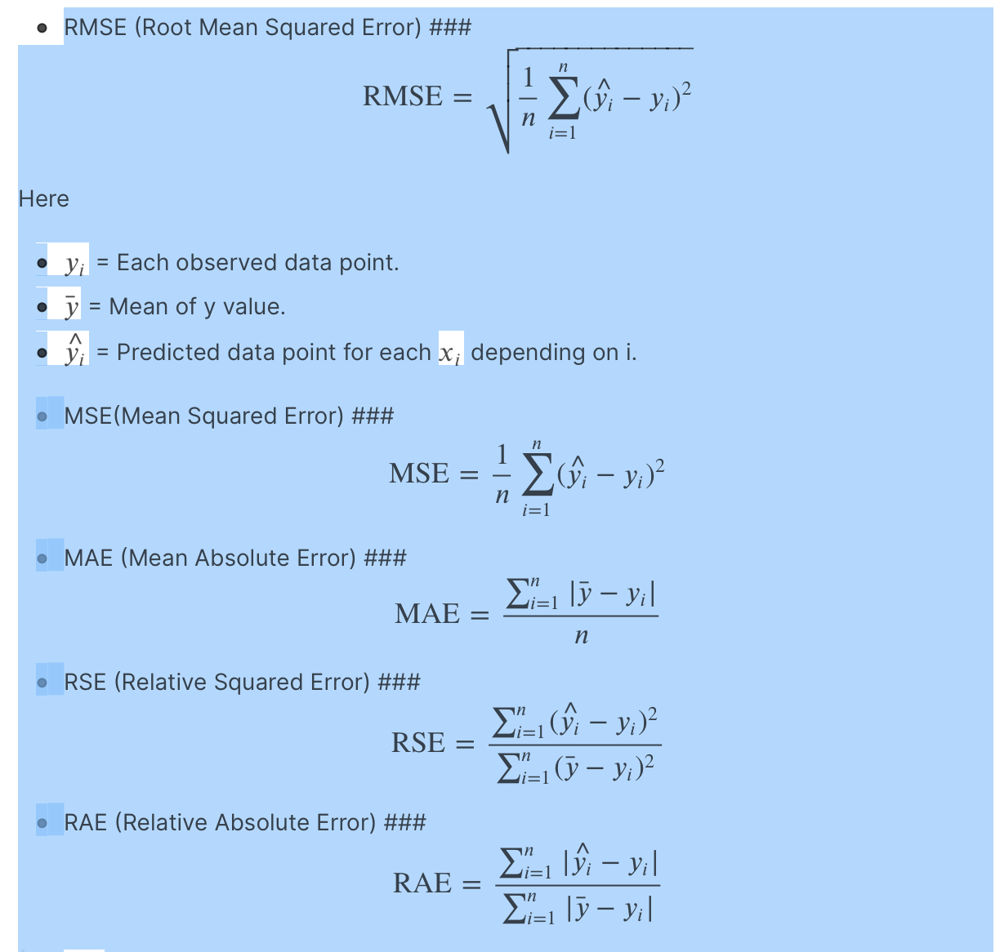

In [208]:
Image("/Users/tuktuk/Desktop/Images/Image 7.png") # Image 7

#### and R2 ((Coefficient of the determination))

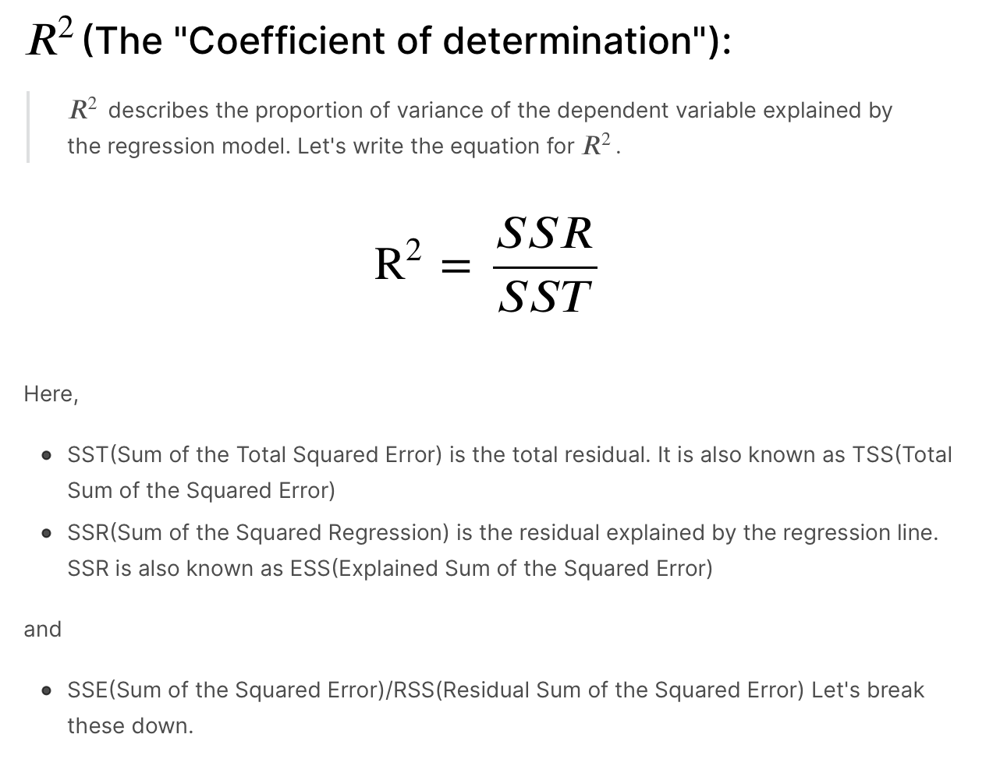

In [209]:
Image("/Users/tuktuk/Desktop/ML/Screenshot 2020-09-16 at 1.06.20 PM.png") # Image 8

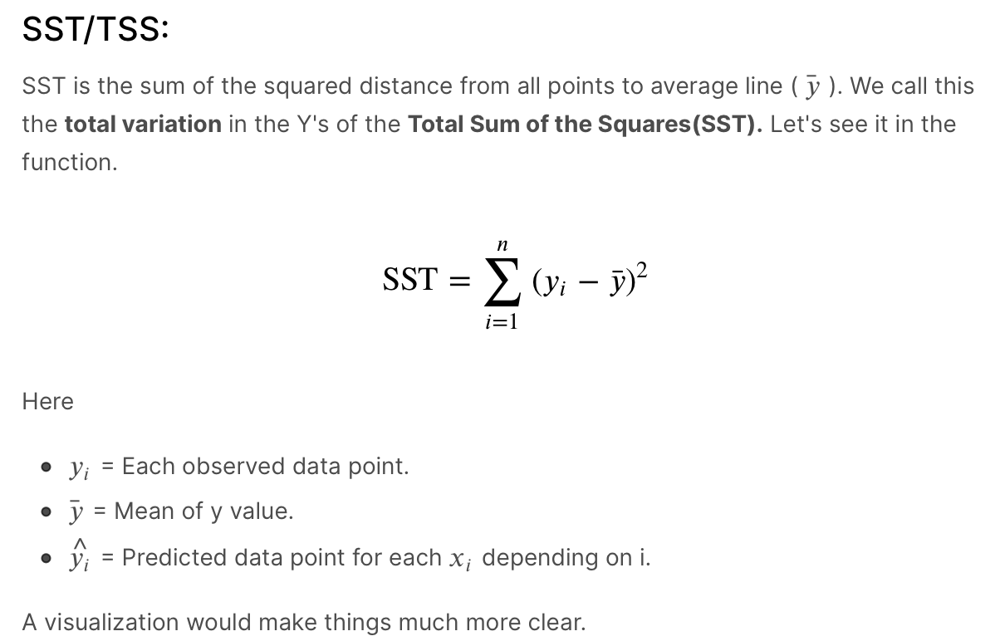

In [210]:
Image("/Users/tuktuk/Desktop/Images/Image 8.png") #Image 9

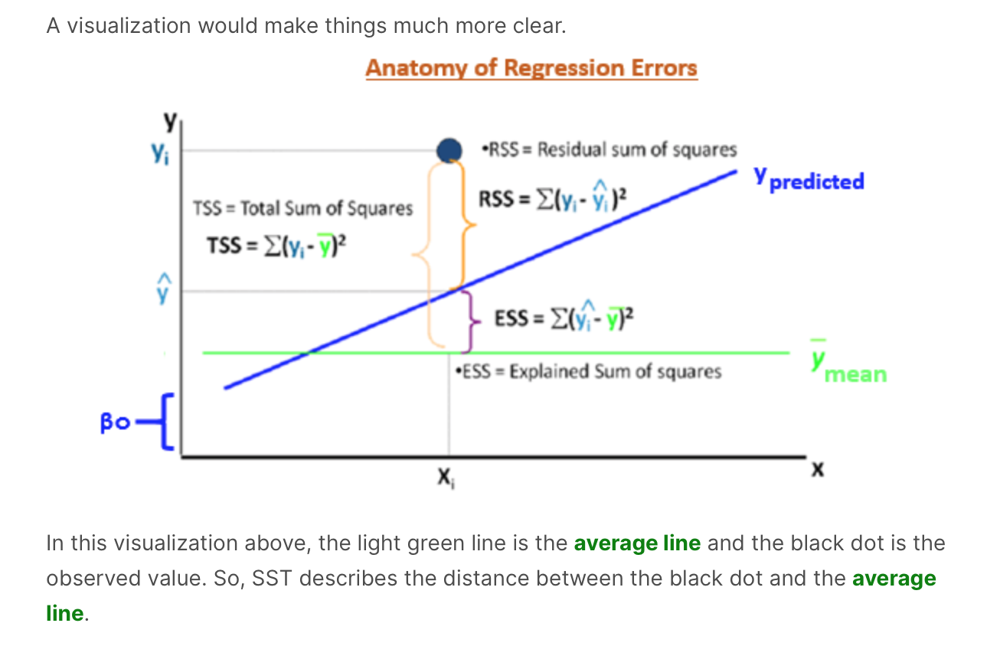

In [211]:
Image("/Users/tuktuk/Desktop/Images/Image 9.png") # Image 9

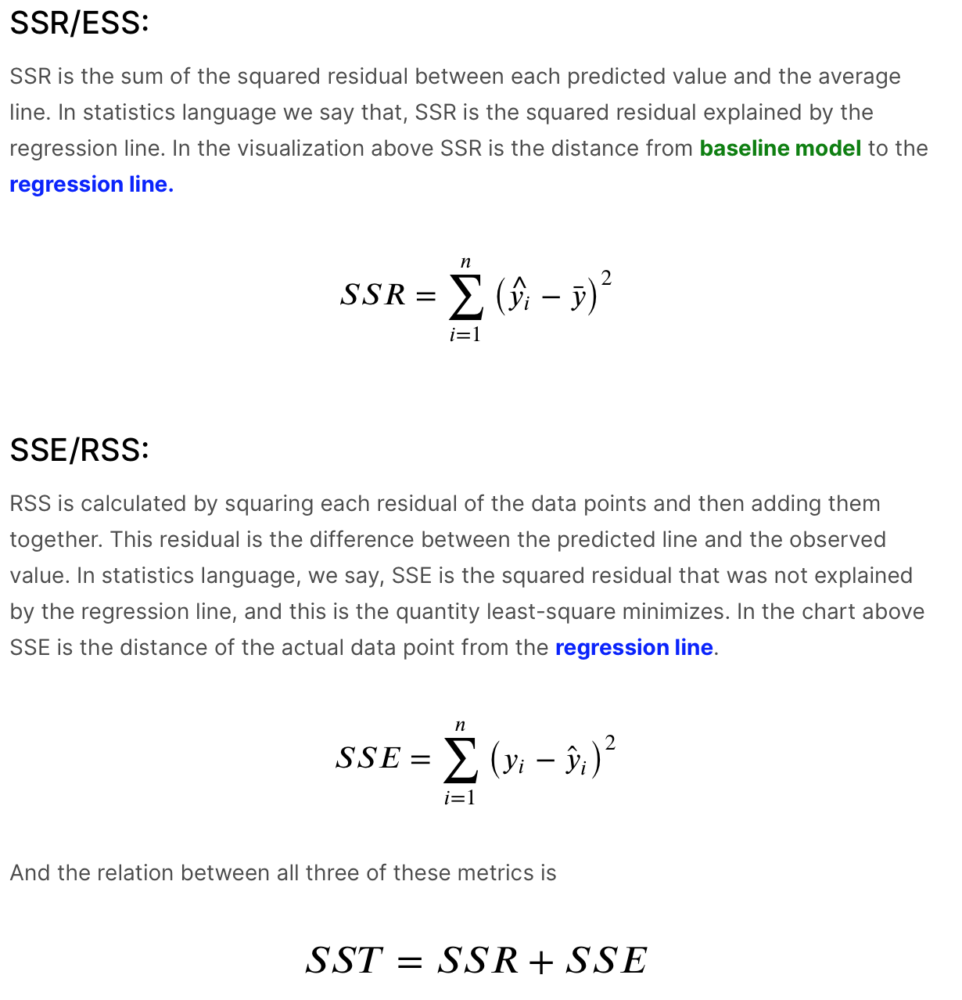

In [212]:
Image("/Users/tuktuk/Desktop/Images/Image 10.png") # Image 10

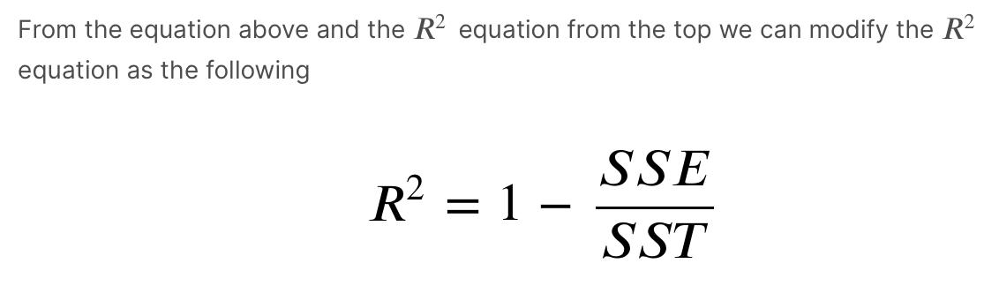

In [213]:
Image("/Users/tuktuk/Desktop/Images/Image 11.png") # Image 11

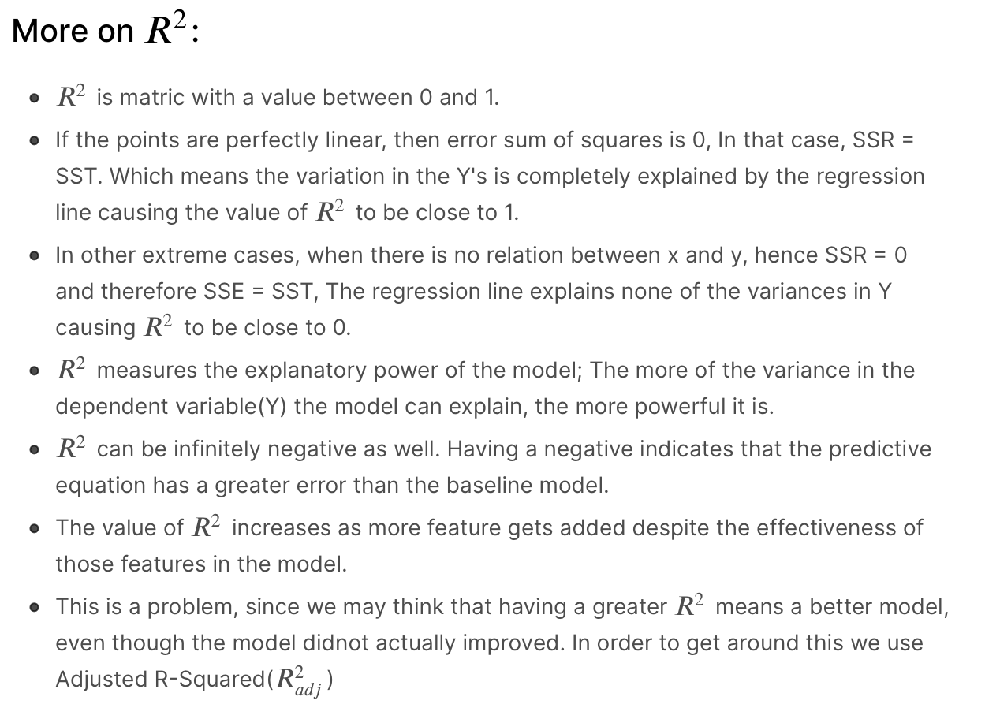

In [214]:
Image("/Users/tuktuk/Desktop/Images/Image 12.png") # image 12

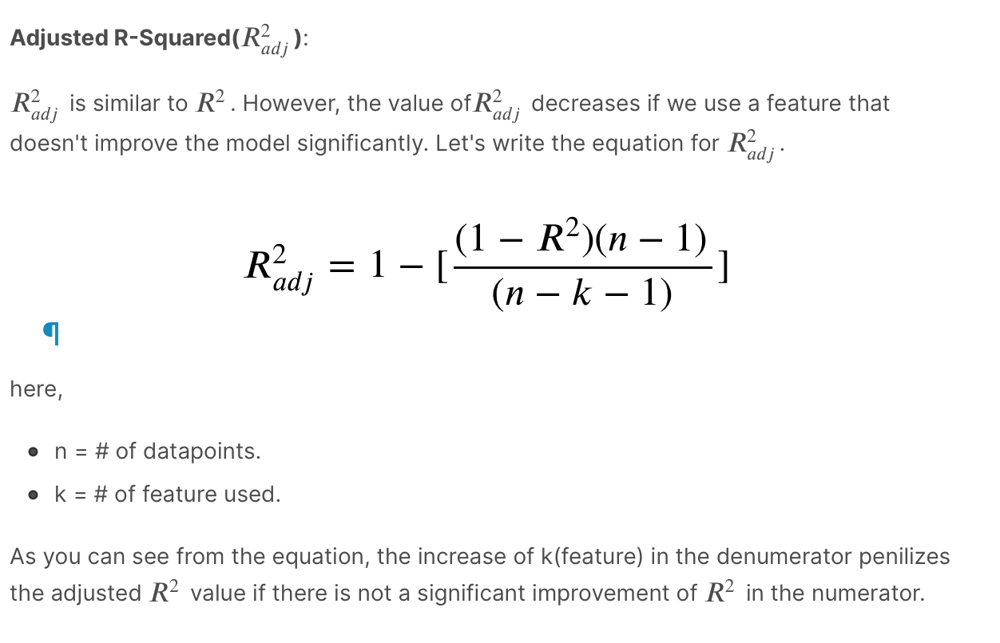

In [215]:
Image("/Users/tuktuk/Desktop/Images/Image 13.png") # Image 13

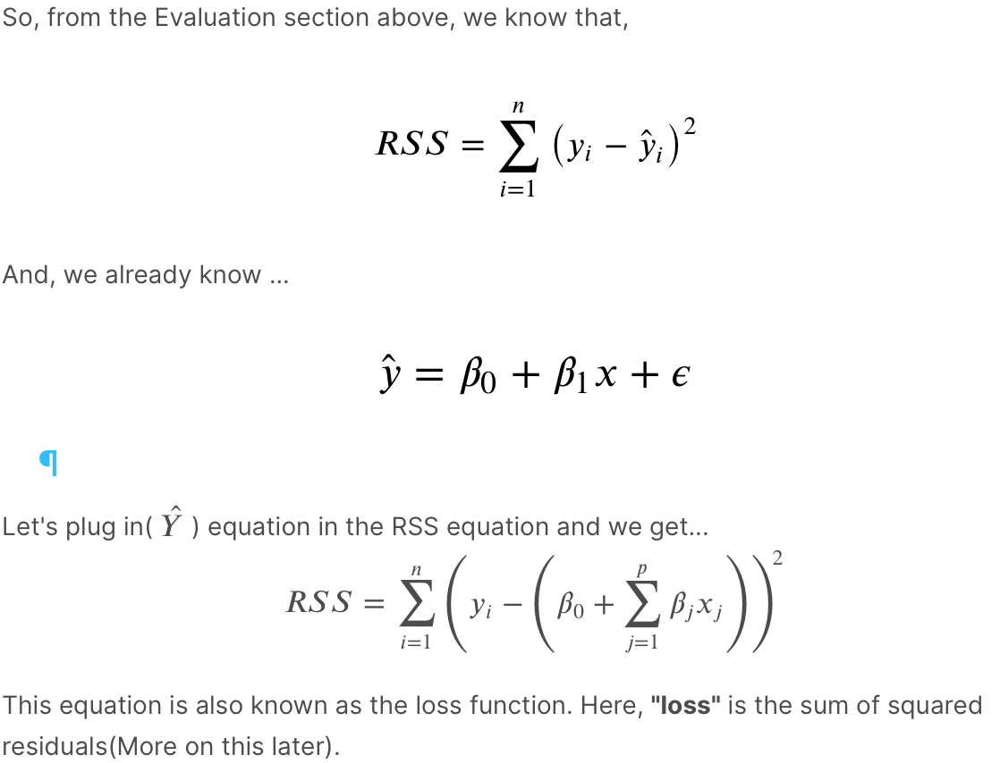

In [216]:
Image("/Users/tuktuk/Desktop/Images/Image 14.png") # Image 14

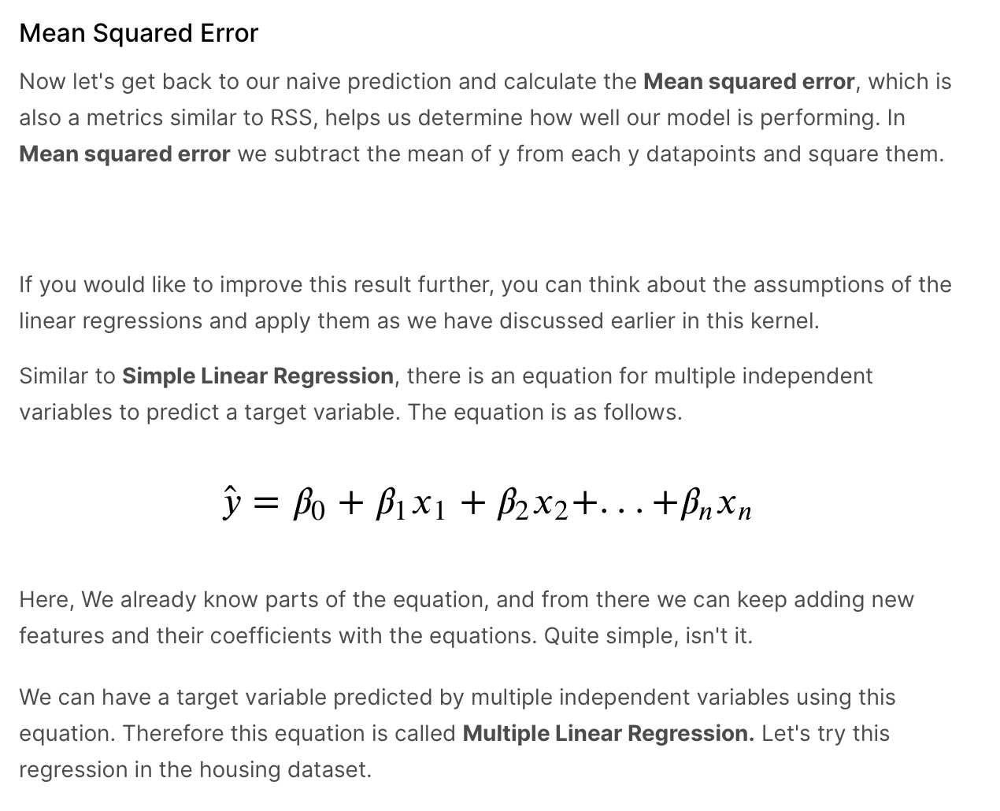

In [217]:
Image("/Users/tuktuk/Desktop/Images/Image 15.png") # Image 15

In [218]:
## importing necessary models.
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

## Call in the LinearRegression object
lin_reg = LinearRegression(normalize=True, n_jobs=-1)
## fit train and test data. 
lin_reg.fit(X_train, y_train)
## Predict test data. 
y_pred = lin_reg.predict(X_test)

In [219]:
## get average squared error(MSE) by comparing predicted values with real values. 
print ('%.2f'%mean_squared_error(y_test, y_pred))

0.02


#### Using cross validation.

In [220]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold
lin_reg = LinearRegression()
cv = KFold(shuffle=True, random_state=2, n_splits=10)
scores = cross_val_score(lin_reg, X,y,cv = cv, scoring = 'neg_mean_absolute_error')

In [221]:
print ('%.8f'%scores.mean())

-0.24538321


#### This way of model fitting above is probably the simplest way to construct a machine learning model. However, Let's dive deep into some more complex regression.

Regularization Models

What makes regression model more effective is its ability of regularizing. The term "regularizing" stands for models ability to structurally prevent overfitting by imposing a penalty on the coefficients.

There are three types of regularizations.

Ridge, Lasso and Elastic Net

These regularization methods work by penalizing the magnitude of the coefficients of features and at the same time minimizing the error between the predicted value and actual observed values. This minimization becomes a balance between the error (the difference between the predicted value and observed value) and the size of the coefficients. The only difference between Ridge and Lasso is the way they penalize the coefficients. Elastic Net is the combination of these two. Elastic Net adds both the sum of the squares errors and the absolute value of the squared error. To get more in-depth of it, let us review the least squared loss function.

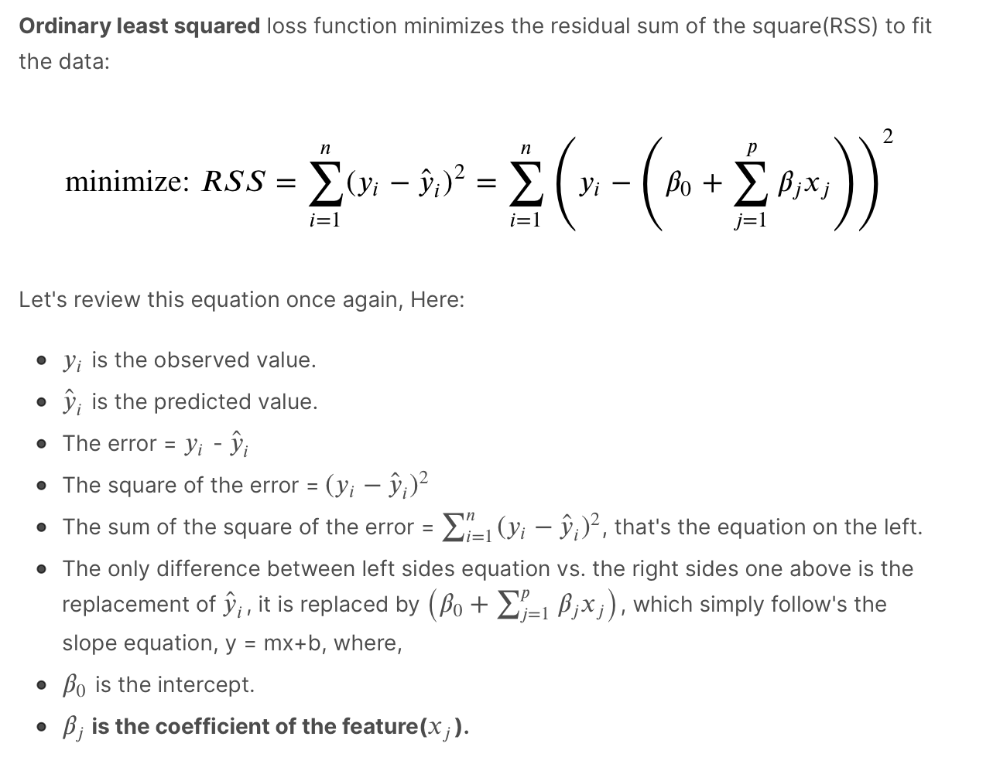

In [222]:
Image("/Users/tuktuk/Desktop/Images/Image 16.png") # Image 16

#### Let's describe the effect of regularization and then we will learn how we can use loss function in Ridge.

One of the benefits of regularization is that it deals with multicollinearity(high correlation between predictor variables) well, especially Ridge method. Lasso deals with multicollinearity more brutally by penalizing related coefficients and force them to become zero, hence removing them. However, Lasso is well suited for redundant variables.

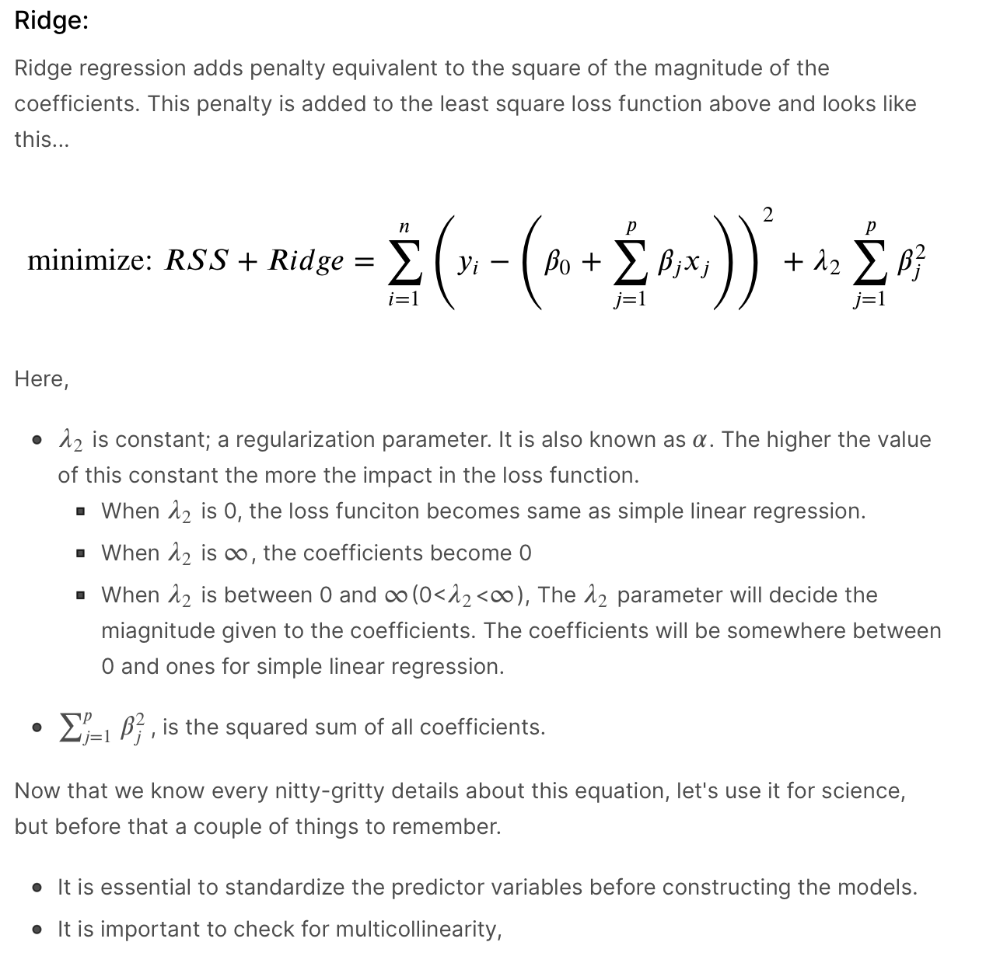

In [223]:
Image("/Users/tuktuk/Desktop/Images/Image 17.png") # Image 17

In [224]:
## Importing Ridge. 
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error
## Assiging different sets of alpha values to explore which can be the best fit for the model. 
alpha_ridge = [-3,-2,-1,1e-15, 1e-10, 1e-8,1e-5,1e-4, 1e-3,1e-2,0.5,1,1.5, 2,3,4, 5, 10, 20, 30, 40]
temp_rss = {}
temp_mse = {}
for i in alpha_ridge:
    ## Assigin each model. 
    ridge = Ridge(alpha= i, normalize=True)
    ## fit the model. 
    ridge.fit(X_train, y_train)
    ## Predicting the target value based on "Test_x"
    y_pred = ridge.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rss = sum((y_pred-y_test)**2)
    temp_mse[i] = mse
    temp_rss[i] = rss

In [225]:
for key, value in sorted(temp_mse.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.01: 0.016867682032968453
0.001: 0.01701909995835496
1e-15: 0.017029878719360732
1e-10: 0.01702987874865289
1e-08: 0.01702988164789857
1e-05: 0.01703221846271665
0.0001: 0.017037063356836937
0.5: 0.01734957250771911
1: 0.01892333504409843
1.5: 0.02048354720016499
2: 0.022034235691281802
3: 0.02513804198709789
4: 0.028244995370847993
5: 0.03133254084674211
10: 0.045806017528048276
20: 0.0680961634880712
30: 0.08329738919697034
40: 0.09405688669317439
-3: 0.6440633967507297
-2: 4.524518327910258
-1: 6.575642570894396


In [226]:
for key, value in sorted(temp_rss.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.01: 4.89162778956085
0.001: 4.935538987922939
1e-15: 4.9386648286146135
1e-10: 4.93866483710934
1e-08: 4.938665677890585
1e-05: 4.939343354187826
0.0001: 4.94074837348271
0.5: 5.031376027238542
1: 5.487767162788546
1.5: 5.940228688047846
2: 6.389928350471721
3: 7.290032176258386
4: 8.19104865754592
5: 9.086436845555216
10: 13.283745083134
20: 19.747887411540646
30: 24.15624286712142
40: 27.276497141020563
-3: 186.77838505771152
-2: 1312.1103150939753
-1: 1906.9363455593748


#### For alpha = 0.01, both RSS and MSE are the least

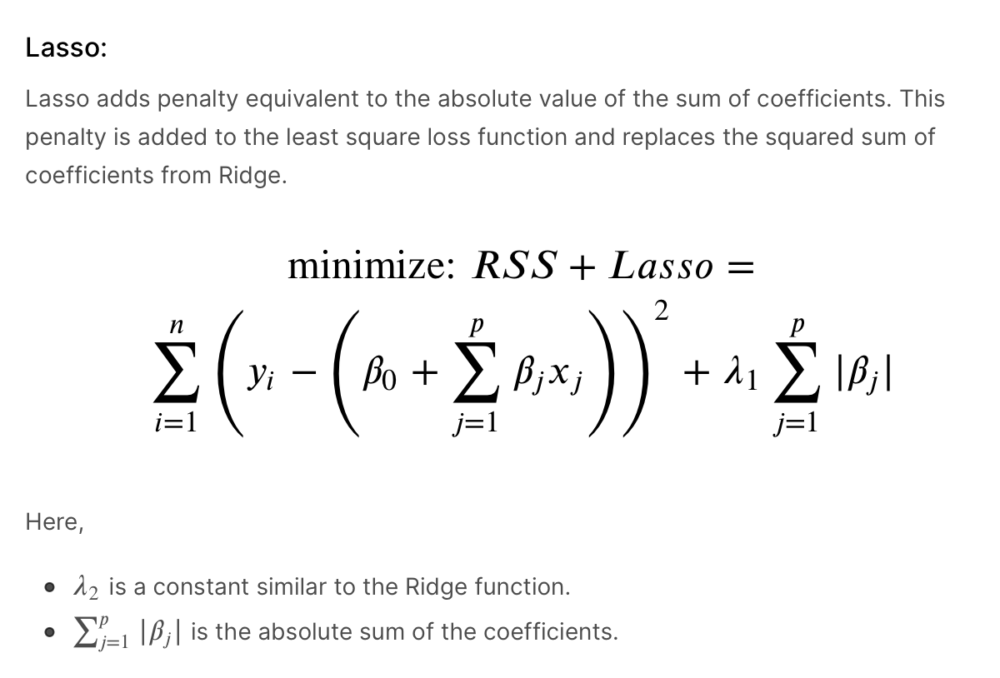

In [227]:
Image("/Users/tuktuk/Desktop/Images/Image 18.png") # Image 18

In [228]:
from sklearn.linear_model import Lasso 
temp_rss = {}
temp_mse = {}
for i in alpha_ridge:
    ## Assigin each model. 
    lasso_reg = Lasso(alpha= i, normalize=True)
    ## fit the model. 
    lasso_reg.fit(X_train, y_train)
    ## Predicting the target value based on "Test_x"
    y_pred = lasso_reg.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rss = sum((y_pred-y_test)**2)
    temp_mse[i] = mse
    temp_rss[i] = rss

In [229]:
for key, value in sorted(temp_mse.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.0001: 0.016676767936981616
1e-05: 0.016816528509954416
1e-08: 0.017045180182628128
1e-10: 0.017045481964752942
1e-15: 0.017045484987334707
0.001: 0.02271475083907522
0.01: 0.15330659323357815
0.5: 0.15330659323357815
1: 0.15330659323357815
1.5: 0.15330659323357815
2: 0.15330659323357815
3: 0.15330659323357815
4: 0.15330659323357815
5: 0.15330659323357815
10: 0.15330659323357815
20: 0.15330659323357815
30: 0.15330659323357815
40: 0.15330659323357815
-1: 2689740.3686171835
-2: 10758926.563714487
-3: 24207559.263227765


In [230]:
for key, value in sorted(temp_rss.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.0001: 4.836262701724669
1e-05: 4.876793267886781
1e-08: 4.943102252962155
1e-10: 4.943189769778353
1e-15: 4.943190646327064
0.001: 6.5872777433318115
0.01: 44.45891203773766
0.5: 44.45891203773766
1: 44.45891203773766
1.5: 44.45891203773766
2: 44.45891203773766
3: 44.45891203773766
4: 44.45891203773766
5: 44.45891203773766
10: 44.45891203773766
20: 44.45891203773766
30: 44.45891203773766
40: 44.45891203773766
-1: 780024706.8989834
-2: 3120088703.4772034
-3: 7020192186.336055


#### with LASSO, MSE is coming lesser and with alpha = 0.0001

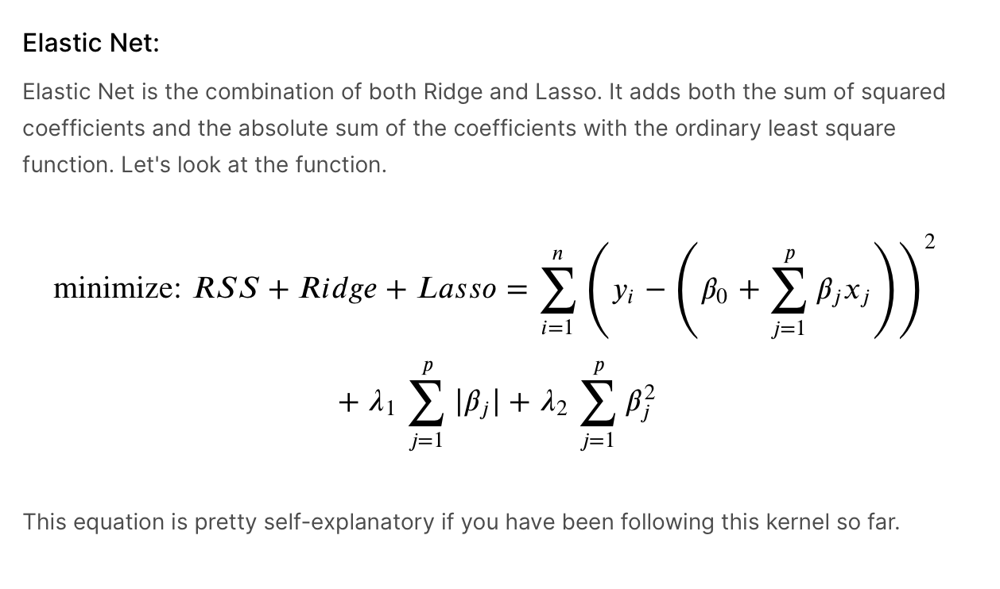

In [231]:
Image("/Users/tuktuk/Desktop/Images/Image 19.png") # Image 19

In [232]:
from sklearn.linear_model import ElasticNet
temp_rss = {}
temp_mse = {}
for i in alpha_ridge:
    ## Assigin each model. 
    lasso_reg = ElasticNet(alpha= i, normalize=True)
    ## fit the model. 
    lasso_reg.fit(X_train, y_train)
    ## Predicting the target value based on "Test_x"
    y_pred = lasso_reg.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rss = sum((y_pred-y_test)**2)
    temp_mse[i] = mse
    temp_rss[i] = rss

In [233]:
for key, value in sorted(temp_mse.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.0001: 0.016333480699288253
1e-05: 0.016827827833794985
1e-08: 0.017045209460290856
1e-10: 0.01704548230275143
1e-15: 0.017045484987338055
0.001: 0.02000785052998988
0.01: 0.10453131493699075
0.5: 0.15330659323357815
1: 0.15330659323357815
1.5: 0.15330659323357815
2: 0.15330659323357815
3: 0.15330659323357815
4: 0.15330659323357815
5: 0.15330659323357815
10: 0.15330659323357815
20: 0.15330659323357815
30: 0.15330659323357815
40: 0.15330659323357815
-3: 1.4586469980478165
-2: 1.4712940104157008
-1: 1.5102677595608816


In [234]:
for key, value in sorted(temp_rss.items(), key=lambda item: item[1]):
    print("%s: %s" % (key, value))

0.0001: 4.736709402793595
1e-05: 4.880070071800547
1e-08: 4.943110743484349
1e-10: 4.943189867797916
1e-15: 4.94319064632804
0.001: 5.802276653697068
0.01: 30.314081331727333
0.5: 44.45891203773766
1: 44.45891203773766
1.5: 44.45891203773766
2: 44.45891203773766
3: 44.45891203773766
4: 44.45891203773766
5: 44.45891203773766
10: 44.45891203773766
20: 44.45891203773766
30: 44.45891203773766
40: 44.45891203773766
-3: 423.00762943386707
-2: 426.6752630205533
-1: 437.9776502726557
